In [1]:
from __future__ import annotations
import os
import json
import pandas as pd
import numpy as np
import psycopg2
import joblib
import logging
from typing import List
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.neighbors import LocalOutlierFactor
import logging
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    r2_score,
    explained_variance_score,
    mean_absolute_error,
    mean_squared_error
)
import torch
import torch.nn as nn
from typing import Optional
# Set options to show full DataFrame output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import sys, os
import re
# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"

def data_load_and_cleaning_po():
        ### setting connection
    #conn = psycopg2.connect(host='fortifai-ng-dev-db.postgres.database.azure.com',
    			#database='baldota-dev-db',
    			#user='fortifai_ng_ai_user_rw',
    			#password='AIPwd@123!',
    			#port='5432',
                #sslmode="require"
    		#)
    
    conn = psycopg2.connect(host='fortifai-ng-dev-db.postgres.database.azure.com',
    			database='baldota-dev-db',
                            user='fortifai_ng_ai_user_rw',
    			password='AIPwd@123!',
    			#user='fortifai_ng_user_ro',
    			#password='user@123!',
    			port='5432',
                sslmode="require"
    		)
    cur = conn.cursor()
    cur.execute("""
                SELECT table_name 
                FROM information_schema.tables 
            """)
    tables = [row[0] for row in cur.fetchall()]
    
     # --- Step 4: Commit and close ---
    #conn.commit()
    #cur.close()
    #conn.close()
    
    line_item_keys = ["Purch.Doc.","Item", "Purch.Req.","Item.1",
        "Buyer Name", "Changed On", "CoCd", "Eq. To", "Denom.", "Conv.", "Conv..1", "Ct", "Customer", "D",
        "GR", "GR Date", "GR-IV", "Gross value", "IR","MTyp", "Material", "Matl Group",
        "Net Price", "Net Value", "PO Quantity.1", "PO Quantity", "Plnt",
        "Reference Document for PO Trac", "S", "Short Text", "Targ. Qty", "Target Value", "TrackingNo",
        "EKPO-CHG_FPLNR", "Acknowledgment", "Agmt.", "Item.2", "Status of purchasing doc. item"
    ]
    line_item_values = ["purch_doc_no", "purch_doc_item_no","pr_no", "pr_item_no",
        "requester_name", "doc_change_date", "company_code", "p2o_unit_conv_denom", "o2b_unit_conv_denom",
        "p2o_unit_conv_num", "o2b_unit_conv_num", "acct_assgnmt_category", "customer_no", "po_item_del_flag",
        "gr_indicator", "latest_gr_dt", "gr_invoice_verif_flag", "gross_val_po_curr", "inv_receipt_indicator",
        "material_type", "material_no", "matl_group", "net_price_doc_curr",
        "net_val_po_curr", "order_uom", "quantity", "plant", "tpop_crm_ref_ordr_no",
        "rfq_status", "short_text", "target_qty", "outline_agrmt_tgt_val_doc_curr", "reqmt_tracking_no",
        "no_invoice_flag", "order_ack_no", "principal_purch_agrmt_no", "principal_purch_agrmt_item_no",
        "purch_doc_item_status"
    ]
    
    
    # Step 2: Create the dictionary
    my_dict_line_item = dict(zip(line_item_keys, line_item_values))
    
    # Step 3: Print the result
    print("Line items key with baldota: mapped values SAP fixed",my_dict_line_item)
    
    header_keys=["Purch.Doc.","Supplier",
        "C", "CoCd", "Crcy", "Created By", "Created On", "Ctl", "D", "Doc. Date",
        "Doc.Cond.", "Exch. Rate", "PGr", "POrg", "PayT", "Proc.state",
        "R", "Rel", "Release", "S", "Salespers.", "Tot. value", "Type",
        "VP Start", "VPer.End"]
    header_values=["purch_doc_no","vendor_or_creditor_acct_no",
        "purch_doc_category", "company_code", "currency", "object_created_by", "doc_change_date",
        "control_indicator", "po_item_del_flag", "purch_doc_date", "principal_purch_agrmt_no",
        "exchange_rate", "purch_group", "purch_org", "pymnt_terms", "processing_status", "doc_release_incompl_flag", "release_indicator", "release_status",
        "rfq_status", "resp_vendor_salesperson",
        "on_release_total_value", "purch_doc_type", "validity_start_dt", "validity_end_dt"
    ]
    # Step 2: Create the dictionary
    my_header_dict = dict(zip(header_keys, header_values))
    
    # Step 3: Print the result
    print("Header key with baldota: mapped values SAP fixed",my_header_dict)
    
    
    
    
    #tables = [row[0] for row in cur.fetchall()]
    #p2p_line_item_po_data
    for table in tables:
        if table == 'purchasing_document_item':
            p2p_line_item_po_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
            
    df_line_item_po_data=p2p_line_item_po_data.copy()
    ## dropping '4500009180^00030' at index 0 as its order_uom is 0.0 must be added for testing
    df_line_item_po_data.drop(index=0, inplace=True)
    
    # convert to str to maintain
    df_line_item_po_data['purch_doc_no'] = df_line_item_po_data['purch_doc_no'].astype(float).astype('int64').astype(str)
    #df_line_item_po_data['pr_no'] = df_line_item_po_data['pr_no'].astype(float).astype('int64').astype(str)
    
    ### bring values for item number to orginal form, 10.0 to 00010 etc
    df_line_item_po_data['purch_doc_item_no'] = df_line_item_po_data['purch_doc_item_no'].fillna(0).astype(float).astype(int).astype(str).str.zfill(5)
    df_line_item_po_data['pr_item_no'] = df_line_item_po_data['pr_item_no'].fillna(0).astype(float).astype(int).astype(str).str.zfill(5)
    #df_line_item_po_data['principal_purch_agrmt_item_no'] = df_line_item_po_data['principal_purch_agrmt_item_no'].fillna(0).astype(float).astype(int).astype(str).str.zfill(5)
    
    ## converting all column values dtype to string except for ingestion_timestamp :: will be updating dtype for values in code when those are required
    #df_line_item_po_data.loc[:, df_line_item_po_data.columns != 'ingestion_timestamp'] = df_line_item_po_data.loc[:, df_line_item_po_data.columns != 'ingestion_timestamp'].astype(str)
    
    ##main data using the mapped columns from baldota
    df_line_item=df_line_item_po_data[line_item_values]
    ## to merge with label data later on
    df_line_item['base_id']=df_line_item["purch_doc_no"] + "^" + df_line_item["purch_doc_item_no"]
    # adding src to line item data columns to distinguish with header column data
    df_line_item_renamed = df_line_item.rename(columns={col: f"{col}_src" for col in df_line_item.columns})
    
    
    #p2p_header_po_data
    for table in tables:
        if table == 'purchasing_document_header':
            p2p_header_po_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
    df_header_po_data=p2p_header_po_data.copy()
    
    df_header_po_data['purch_doc_no'] = df_header_po_data['purch_doc_no'].astype(float).astype('int64').astype(str)
    ## converting all column values dtype to string except for ingestion_timestamp :: will be updating dtype for values in code when those are required
    #df_header_po_data.loc[:, df_header_po_data.columns != 'ingestion_timestamp'] = df_header_po_data.loc[:, df_header_po_data.columns != 'ingestion_timestamp'].astype(str)
    ##main data using the mapped columns from baldota
    df_header=df_header_po_data[header_values]
    # adding hpd to header data columns to distinguish with line_item column data
    df_header_renamed = df_header.rename(columns={col: f"{col}_hpd" for col in df_header.columns})
    
    merged_df_before_label=pd.merge(df_line_item_renamed,df_header_renamed,left_on='purch_doc_no_src',right_on='purch_doc_no_hpd',how='outer')
    merged_df_before_label.shape
    
    
    df=merged_df_before_label.copy()
    # Convert dates
    df["doc_change_date_src"] = pd.to_datetime(df["doc_change_date_src"], errors='coerce')
    df["doc_change_date_hpd"] = pd.to_datetime(df["doc_change_date_hpd"], errors='coerce')
    df["purch_doc_date_hpd"] = pd.to_datetime(df["purch_doc_date_hpd"], errors='coerce')
    
    # drop all rows where all values are Nan
    df = df.dropna(axis=1, how='all')
    #df.info()
    #df['purch_doc_mapping']=df["purch_doc_no_src"] + "^" + df["purch_doc_item_no_src"]
    df_final_po= df.rename(columns={col: f"{col}_po" for col in df.columns})
    df_final_po.info()
    cur.close()
    conn.close()
    # there are 3 po that have data in header but not in line item
    
    
    
    
    ### Invoice Data ####
    
    conn = psycopg2.connect(host='fortifai-ng-dev-db.postgres.database.azure.com',
    			database='baldota-dev-db',
                            user='fortifai_ng_ai_user_rw',
    			password='AIPwd@123!',
    			#user='fortifai_ng_user_ro',
    			#password='user@123!',
    			port='5432',
                sslmode="require"
    		)
    cur = conn.cursor()
    cur.execute("""
                SELECT table_name 
                FROM information_schema.tables 
            """)
    tables = [row[0] for row in cur.fetchall()]
    
    
    line_item_keys = ["DocumentNo","InvItem","Purch.Doc.","Item", "Amount", "BlR", "Central Contract", "Central Contract Item", "CoCd", "D/C", "FIn",
        "GR/IR Clrg", "Indicator for Differential Invoicing", "Material", "Plnt",
         "OUn", "Quantity", "OPUn", "Qty in OPUn", "Reference", "SAA", "Supplier",
        "Tax Jur.", "Year", "Year.1"
    ]
    line_item_values = ["accounting_doc_no","doc_line_item_no","purch_doc_no", "purch_doc_item_no","amt_doc_curr", "block_reason_field", "central_contract",
                        "central_contract_item_no","company_code", "debit_credit_flag", "final_inv_flag",
        "ext_gr_ir_clrg_flag", "diff_invoicing_flag", 
        "material_no", "plant", "order_uom", "quantity", "po_uom",
        "po_qty_order_uom", "ref_doc_no", "acct_assgnmt_seq_no", "vendor_or_creditor_acct_no",
        "tax_jurisdiction_code", "fiscal_year", "ref_doc_fiscal_year"
    ]
    
    
    # Step 2: Create the dictionary
    my_dict_line_item = dict(zip(line_item_keys, line_item_values))
    
    # Step 3: Print the result
    print("Line items key with baldota: mapped values SAP fixed",my_dict_line_item)
    
    header_keys= ["Doc. No.",
        "Bline Date", "CoCd", "Crcy", "Del.Costs", "Doc. Date",  "Doc.Header Text",
        "Entry Dte", "Exch.rate", "G/L", "Gross Amnt", "I", "IV cat", "InR.Ref.no", "Inv. Pty",
        "PBk", "PM", "PayT", "Payer", "Paymt Ref.", "Reference", "Rel.", "Rvrsd by",
        "St", "TCode", "Time", "Type", "User Name"
    ]
    header_values=["accounting_doc_no","baseline_date", "company_code", "currency", "unplanned_dlvry_costs", "doc_date",
         "doc_header_text", "doc_entry_date", "exchange_rate", "gl_account",
        "gross_inv_amt_doc_curr", "post_inv_flag", "logistics_inv_verif_orig_type", "txn_invoice_no",
        "vendor_or_creditor_acct_no", "house_bank_short_key", "pymnt_method", "pymnt_terms",
        "payee_or_payer_name", "assignment_no", "ref_doc_no", "sap_release", "reversal_doc_no",
        "invoice_doc_status", "txn_code", "entry_time", "doc_type", "username"
    ]
    # Step 2: Create the dictionary
    my_header_dict = dict(zip(header_keys, header_values))
    
    # Step 3: Print the result
    print("Header key with baldota: mapped values SAP fixed",my_header_dict)
    
    
    #tables = [row[0] for row in cur.fetchall()]
    #p2p_line_item_invoice_data
    for table in tables:
        if table == 'invoice_receipt_items':
            p2p_line_item_invoice_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
            
    df_line_item_invoice_data=p2p_line_item_invoice_data.copy()
    # there are na values in accounting_doc_no--> dropping
    df_line_item_invoice_data= df_line_item_invoice_data.dropna(subset=['accounting_doc_no'])
    
    # convert to str to maintain
    df_line_item_invoice_data['accounting_doc_no'] = df_line_item_invoice_data['accounting_doc_no'].astype(float).astype('int64').astype(str)
    df_line_item_invoice_data['purch_doc_no'] = df_line_item_invoice_data['purch_doc_no'].astype(float).astype('int64').astype(str)
    
    ### bring values for item number to orginal form, 10.0 to 00010 etc
    df_line_item_invoice_data['purch_doc_item_no'] = df_line_item_invoice_data['purch_doc_item_no'].fillna(0).astype(float).astype(int).astype(str).str.zfill(5)
    # convert doc_line_item_no to str
    df_line_item_invoice_data['doc_line_item_no'] = df_line_item_invoice_data['doc_line_item_no'].fillna(0).astype(float).astype(int).astype(str)
    
    
    
    ##main data using the mapped columns from baldota
    df_line_item=df_line_item_invoice_data[line_item_values]
    ## to merge with label data later on
    df_line_item['base_id']=df_line_item["accounting_doc_no"] + "^" + df_line_item["doc_line_item_no"]
    # adding src to line item data columns to distinguish with header column data
    df_line_item_renamed = df_line_item.rename(columns={col: f"{col}_src" for col in df_line_item.columns})
    
    
    #p2p_header_invoice_data
    for table in tables:
        if table == 'invoice_receipt_header':
            p2p_header_invoice_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
    df_header_invoice_data=p2p_header_invoice_data.copy()
    
    # there are na values in accounting_doc_no--> dropping
    df_header_invoice_data= df_header_invoice_data.dropna(subset=['accounting_doc_no'])
    
    # str maintain
    df_header_invoice_data['accounting_doc_no'] = df_header_invoice_data['accounting_doc_no'].astype(float).astype('int64').astype(str)
    ## converting all column values dtype to string except for ingestion_timestamp :: will be updating dtype for values in code when those are required
    #df_header_po_data.loc[:, df_header_po_data.columns != 'ingestion_timestamp'] = df_header_po_data.loc[:, df_header_po_data.columns != 'ingestion_timestamp'].astype(str)
    ##main data using the mapped columns from baldota
    df_header=df_header_invoice_data[header_values]
    # adding hpd to header data columns to distinguish with line_item column data
    df_header_renamed = df_header.rename(columns={col: f"{col}_hpd" for col in df_header.columns})
    
    merged_df_before_label=pd.merge(df_line_item_renamed,df_header_renamed,left_on='accounting_doc_no_src',right_on='accounting_doc_no_hpd',how='outer')
    merged_df_before_label.shape
    
    df=merged_df_before_label.copy()
    # Convert dates
    df["baseline_date_hpd"] = pd.to_datetime(df["baseline_date_hpd"], errors='coerce')
    df["doc_date_hpd"] = pd.to_datetime(df["doc_date_hpd"], errors='coerce')
    df["doc_entry_date_hpd"] = pd.to_datetime(df["doc_entry_date_hpd"], errors='coerce')
    
    # drop all rows where all values are Nan
    df = df.dropna(axis=1, how='all')
    #df.info()
    df['purch_doc_mapping']=df["purch_doc_no_src"] + "^" + df["purch_doc_item_no_src"]
    df_final_invoice = df.rename(columns={col: f"{col}_invoice" for col in df.columns})
    df_final_invoice.info()
    
    ## there are 175 invoice that have data in header but not in line item
    cur.close()
    conn.close()
    
    
    po_invoice=pd.merge(df_final_po,df_final_invoice, left_on='base_id_src_po',right_on='purch_doc_mapping_invoice',how='outer')
    
    ## cleaning .0 from vendor
    s = po_invoice['vendor_or_creditor_acct_no_hpd_po'].astype(str).str.strip()           # ensure string & tidy spaces
    mask = s.str.upper().eq('UNKNOWN')                 # rows to leave as-is
    po_invoice['vendor_or_creditor_acct_no_hpd_po'] = s.where(mask, s.str.replace(r'\.0$', '', regex=True))
    
    ## getting vendor name from vendor master DB
    conn = psycopg2.connect(host='fortifai-ng-dev-db.postgres.database.azure.com',
    			database='baldota-dev-db',
                            user='fortifai_ng_ai_user_rw',
    			password='AIPwd@123!',
    			#user='fortifai_ng_user_ro',
    			#password='user@123!',
    			port='5432',
                sslmode="require"
    		)
    cur = conn.cursor()
    cur.execute("""
                SELECT table_name 
                FROM information_schema.tables 
            """)
    tables = [row[0] for row in cur.fetchall()]
    vendor_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{'vendor_master_general_section'}", conn)
    lfa_1=pd.read_excel('LFA1 - Vendor Master.xlsx')
    lfa_1["Supplier"] = lfa_1["Supplier"].astype(str)
    lfa_1_1=lfa_1[['Supplier','DelF','DeBl','B','B.1','Status']]
    lfa_1_2 = lfa_1_1.rename(columns={
        "Supplier": "vendor_or_creditor_acct_no",
        'DelF':"central_deletion_flag",
        "DeBl": "central_del_block_flg",
        "B": "central_posting_blk_flag",
        "B.1": "central_purch_blk_flag",
        "Status": "data_transfer_status",
    })
    
    KEY = "vendor_or_creditor_acct_no"
    cols_to_update = ["central_deletion_flag",
        "central_del_block_flg",
        "central_posting_blk_flag",
        "central_purch_blk_flag",
        "data_transfer_status",
    ]
    
    
    vendor= vendor_data.drop(columns=cols_to_update)
    
    
    # Merge and overwrite columns
    merged = vendor.merge(
        lfa_1_2,
        on=KEY,
        how="outer")
    vendor_data_updated = merged
    # drop all rows where all values are Nan
    vendor_data_1 = vendor_data_updated.dropna(axis=1, how='all')
    po_invoice_vendor=pd.merge(po_invoice,vendor_data_1,left_on='vendor_or_creditor_acct_no_hpd_po',right_on='vendor_or_creditor_acct_no',how='outer')
    
    # ---------- 0) Invoice reversed flag ----------
    po_invoice_vendor["invoice_reversed"] = np.where(
        po_invoice_vendor["reversal_doc_no_hpd_invoice"].isnull(), 0, 1
    )
    
    # ---------- 1) Make sure inputs are numeric ----------
    for col in ["amt_doc_curr_src_invoice", "quantity_src_invoice",
                "net_val_po_curr_src_po", "quantity_src_po"]:
        po_invoice_vendor[col] = pd.to_numeric(po_invoice_vendor[col], errors="coerce")
    
    # ---------- 2) Build the gate ----------
    if "reversal_doc_no_hpd_invoice" in po_invoice_vendor.columns:
        inv_rev_ok = po_invoice_vendor["reversal_doc_no_hpd_invoice"].isna()
    elif "invoice_reversed" in po_invoice_vendor.columns:
        inv_rev_ok = po_invoice_vendor["invoice_reversed"].fillna(0).eq(0)
    else:
        inv_rev_ok = True  # broadcasts
    
    gate = (
        (po_invoice_vendor["release_indicator_hpd_po"] == "R") &
        (po_invoice_vendor["po_item_del_flag_src_po"].isna()) &
        inv_rev_ok
    )
    
    KEY = "purch_doc_mapping_invoice"
    
    # ---------- 3) Work only on gated rows ----------
    cols_needed = [KEY, "amt_doc_curr_src_invoice", "quantity_src_invoice",
                   "net_val_po_curr_src_po", "quantity_src_po"]
    gated = po_invoice_vendor.loc[gate, cols_needed].copy()
    
    # Group totals ONLY from gated rows
    gated["invoice_total_amount"]   = gated.groupby(KEY)["amt_doc_curr_src_invoice"].transform("sum")
    gated["invoice_total_quantity"] = gated.groupby(KEY)["quantity_src_invoice"].transform("sum")
    
    # Pick PO references within gated rows (use max to be conservative)
    gated["po_value_ref"] = gated.groupby(KEY)["net_val_po_curr_src_po"].transform("max")
    gated["po_qty_ref"]   = gated.groupby(KEY)["quantity_src_po"].transform("max")
    
    # ---------- 4) Kill float noise and compare with tolerance ----------
    AMT_ATOL = 0.01   # ₹0.01 tolerance
    QTY_ATOL = 1e-9   # effectively exact for integers
    
    # Round values before comparing (money: 2dp; qty: 6dp)
    gated["invoice_total_amount"]   = gated["invoice_total_amount"].round(2)
    gated["po_value_ref"]           = gated["po_value_ref"].round(2)
    gated["invoice_total_quantity"] = gated["invoice_total_quantity"].round(6)
    gated["po_qty_ref"]             = gated["po_qty_ref"].round(6)
    
    amt_breach = gated["invoice_total_amount"]   > (gated["po_value_ref"] + AMT_ATOL)
    qty_breach = gated["invoice_total_quantity"] > (gated["po_qty_ref"]   + QTY_ATOL)
    
    gated["invoice_more_than_po_flag"] = (amt_breach | qty_breach).astype(int)
    
    # If any row in a gated group breaches → mark ALL gated rows in that group
    gated["invoice_more_than_po_flag"] = gated.groupby(KEY)["invoice_more_than_po_flag"].transform("max")
    
    # ---------- 5) Map results back; non-gated rows remain 0 ----------
    po_invoice_vendor["invoice_total_amount"]          = 0.0
    po_invoice_vendor["invoice_total_quantity"]        = 0.0
    po_invoice_vendor["invoice_more_than_po_flag"]     = 0
    
    po_invoice_vendor.loc[gated.index, "invoice_total_amount"]   = gated["invoice_total_amount"].values
    po_invoice_vendor.loc[gated.index, "invoice_total_quantity"] = gated["invoice_total_quantity"].values
    po_invoice_vendor.loc[gated.index, "invoice_more_than_po_flag"] = gated["invoice_more_than_po_flag"].values
    
    # (Optional) ensure the flag is int, not float
    #po_invoice_vendor["invoice_more_than_po_flag"] = po_invoice_vendor["invoice_more_than_po_flag"].astype(int)
        
    
    
    
    label_data=pd.read_excel("Rulewise summary - 6 rules.xlsx")
    one=pd.merge(po_invoice_vendor,label_data,left_on='base_id_src_po',right_on='base_id',how='left')
    
    
    
    one_1=one[['purch_doc_no_src_po', 'purch_doc_item_no_src_po', 'pr_no_src_po',
           'pr_item_no_src_po', 'requester_name_src_po', 'doc_change_date_src_po',
           'company_code_src_po', 'p2o_unit_conv_denom_src_po',
           'o2b_unit_conv_denom_src_po', 'p2o_unit_conv_num_src_po',
           'o2b_unit_conv_num_src_po', 'po_item_del_flag_src_po',
           'gr_indicator_src_po', 'gr_invoice_verif_flag_src_po',
           'gross_val_po_curr_src_po', 'inv_receipt_indicator_src_po',
           'material_type_src_po', 'material_no_src_po', 'matl_group_src_po',
           'net_price_doc_curr_src_po', 'net_val_po_curr_src_po',
           'order_uom_src_po', 'quantity_src_po', 'plant_src_po',
           'short_text_src_po', 'target_qty_src_po',
           'outline_agrmt_tgt_val_doc_curr_src_po', 'reqmt_tracking_no_src_po',
           'principal_purch_agrmt_item_no_src_po', 'base_id_src_po',
           'purch_doc_no_hpd_po', 'vendor_or_creditor_acct_no_hpd_po',
           'purch_doc_category_hpd_po', 'company_code_hpd_po', 'currency_hpd_po',
           'object_created_by_hpd_po', 'doc_change_date_hpd_po',
           'control_indicator_hpd_po', 'purch_doc_date_hpd_po',
           'principal_purch_agrmt_no_hpd_po', 'exchange_rate_hpd_po',
           'purch_group_hpd_po', 'purch_org_hpd_po', 'pymnt_terms_hpd_po',
           'processing_status_hpd_po', 'doc_release_incompl_flag_hpd_po',
           'release_indicator_hpd_po', 'release_status_hpd_po',
           'rfq_status_hpd_po', 'resp_vendor_salesperson_hpd_po',
           'on_release_total_value_hpd_po', 'purch_doc_type_hpd_po','vendor_or_creditor_acct_no', 'country_code', 'vendor_name_1',
           'vendor_name_2', 'vendor_name_3', 'vendor_name_4', 'city',
           'postal_code', 'street_address', 'item_manual_addr_no',
           'matchcode_search_term_1', 'record_creation_dt', 'object_created_by',
           'vendor_acct_group',
           'tax_no_1', 'vendor_telephone_no', 'second_telephone_no', 'tax_no_3',
           'tax_no_5','central_deletion_flag', 'central_purch_blk_flag','central_posting_blk_flag','data_transfer_status',
               "invoice_more_than_po_flag"]]
    
    #one_1.drop_duplicates(inplace=True)
    
    #rule_2
    # ensure the flag is numeric 0/1 (or numeric)
    one_1["invoice_more_than_po_flag"] = (
        pd.to_numeric(one_1["invoice_more_than_po_flag"], errors="coerce")
          .fillna(0).astype(int)
    )
    
    # keep rows where the flag equals the group's max; drop the rest
    grp_max = one_1.groupby("base_id_src_po")["invoice_more_than_po_flag"].transform("max")
    one_1 = one_1.loc[
        one_1["invoice_more_than_po_flag"].eq(grp_max)
    ].copy()
    one_1 = (one_1
             .sort_values(["base_id_src_po", "invoice_more_than_po_flag"], ascending=[True, False])
             .drop_duplicates("base_id_src_po", keep="first"))
    
    
    # rule label output
    #line_item=pd.read_excel("baldota rule label data/Line Item Transaction Summary.xlsx")
    rft=pd.read_csv("Line Item Transaction Summary 24_07.csv")
    ## taking output po label at line item
    rft_po=rft[rft['stage']=='PO']
    one_2=one_1[one_1['base_id_src_po'].notna()].copy()
    ## merging main data df with label data df
    one_3=pd.merge(one_2,rft_po[['base_id','rule_ids','rft_by_engine']],left_on='base_id_src_po',right_on='base_id',how="left")
    #one_3.head()
    ## rule_3
    block_cols = ["central_deletion_flag", "central_purch_blk_flag", "central_posting_blk_flag"]
    
    one_3["po_to_blocked_vendor"] = np.where(
        (one_3[block_cols].eq("X").any(axis=1)) &
        (one_3["release_indicator_hpd_po"] == "R") &
        (one_3["po_item_del_flag_src_po"].isna()),
        1,
        0
    )
    
    
    ## rule_3
    # Ensure both columns are datetime
    one_3["purch_doc_date_hpd_po"] = pd.to_datetime(one_3["purch_doc_date_hpd_po"], errors="coerce")
    one_3["record_creation_dt"] = pd.to_datetime(one_3["record_creation_dt"], errors="coerce")
    
    # Create flag: 1 if purch_doc_date_hpd_po is within 30 days of record_creation_dt
    one_3["purch_doc_within_30days"] = (
        (one_3["purch_doc_date_hpd_po"] - one_3["record_creation_dt"]).abs().dt.days <= 30
    ).astype(int)
    
    ## rule_4
    # Ensure numeric types
    one_3["on_release_total_value_hpd_po"] = pd.to_numeric(one_3["on_release_total_value_hpd_po"], errors="coerce")
    one_3["exchange_rate_hpd_po"] = pd.to_numeric(one_3["exchange_rate_hpd_po"], errors="coerce")
    
    # Calculate PO value in INR (or base currency)
    one_3["po_value_inr"] = one_3["on_release_total_value_hpd_po"] * one_3["exchange_rate_hpd_po"]
    
    # Create flag: 1 if > 1 crore (1 Cr = 10,000,000)
    one_3["po_gt_1cr_flag"] = np.where(one_3["po_value_inr"] > 1e7, 1, 0)
    
    one_3["po_to_new_vendor_gt_tolerance"] = np.where(
        (one_3["purch_doc_within_30days"] == 1) & (one_3["po_gt_1cr_flag"] == 1) & (one_3["release_indicator_hpd_po"] == 'R')
        & (one_3["po_item_del_flag_src_po"].isna()),
        1,
        0
    )
    ## rule_5
    df = one_3.copy() # or your dataframe name
    
    # 1) Extract PAN: remove first 2 chars and last 3 chars, clean up casing/whitespace
    df["pan_extracted"] = (
        df["tax_no_3"]
          .astype(str)
          .str.strip()
          .str.upper()
          .str[2:-3]                 # remove first 2 and last 3
    )
    
    # (Optional) Keep only plausible PANs (10 chars, alphanumeric)
    pan_valid = df["pan_extracted"].str.len().eq(10) & df["pan_extracted"].str.isalnum()
    df.loc[~pan_valid, "pan_extracted"] = np.nan
    
    # 2) Amount in INR (or base) and >= 1 Cr flag
    df["on_release_total_value_hpd_po"] = pd.to_numeric(df["on_release_total_value_hpd_po"], errors="coerce")
    df["exchange_rate_hpd_po"] = pd.to_numeric(df["exchange_rate_hpd_po"], errors="coerce")
    df["po_value_inr"] = df["on_release_total_value_hpd_po"] * df["exchange_rate_hpd_po"]
    
    amount_ge_1cr = df["po_value_inr"] >= 1e7  # 1 crore = 10,000,000
    
    # 3) 4th PAN character == 'P'
    fourth_char_is_P = df["pan_extracted"].str[3].eq("P")
    
    # 4) Final flag: 4th PAN char 'P' AND amount ≥ 1 Cr  -> 1 else 0
    df["pan4P_amt_ge_1cr_flag"] = np.where(fourth_char_is_P & amount_ge_1cr &  (df["release_indicator_hpd_po"] == 'R')
        & (df["po_item_del_flag_src_po"].isna()), 1, 0)
    
    ##rule_6
    df["missing_tax_id_flag"] = np.where(df["tax_no_3"].isna() &  (df["release_indicator_hpd_po"] == 'R')
        & (df["po_item_del_flag_src_po"].isna()), 1, 0)
    
    
    one_3=df.copy()
    
    
    
    # 1) Flag: True if either column is true
    # List your 5 columns
    cols_to_check = ["invoice_more_than_po_flag", "po_to_blocked_vendor", "po_to_new_vendor_gt_tolerance", "pan4P_amt_ge_1cr_flag","missing_tax_id_flag"]
    
    # output_flag will be True if any column == 1, else False
    one_3["new_model_output"] = df[cols_to_check].eq(1).any(axis=1)
    
    
    
    # List the columns to check
    cols_to_check = ["invoice_more_than_po_flag", "po_to_blocked_vendor", "po_to_new_vendor_gt_tolerance", "pan4P_amt_ge_1cr_flag","missing_tax_id_flag"]
    
    # Build rule_summary by joining column names where value == 1
    one_3["new_rule_summary"] = (
        df[cols_to_check]
        .apply(lambda row: ",".join(row.index[row.eq(1)]), axis=1)
    )
    
    # If you prefer NaN instead of empty string when no rules matched:
    # df["rule_summary"] = df["rule_summary"].replace("", np.nan)
    #one_3.head()
    
    
    
    try:
        to_bool
    except NameError:
        TRUEY = {"true","t","yes","y","1","ok","on"}
        def to_bool(x):
            if pd.isna(x):
                return False
            if isinstance(x, (bool, np.bool_)):
                return bool(x)
            if isinstance(x, (int, np.integer, float, np.floating)):
                # treat 1 or True-like as True
                return x == 1 or x is True
            return str(x).strip().lower() in TRUEY
    
    try:
        split_rules
    except NameError:
        def split_rules(val):
            if pd.isna(val):
                return []
            if isinstance(val, (list, tuple, set)):
                parts = list(val)
            else:
                # accept commas/semicolons
                parts = [p.strip() for chunk in str(val).split(';') for p in chunk.split(',')]
            parts = [p for p in parts if p and p.lower() != "nan"]
            # de-dupe preserve order
            seen, out = set(), []
            for p in parts:
                if p not in seen:
                    seen.add(p); out.append(p)
            return out
    
    
    
    # 1) Flag: True if either column is true
    one_3["rft_by_engine_7"] = (
        one_3["rft_by_engine"].map(to_bool) | one_3["new_model_output"].map(to_bool)
    )
    
    # (Optional) whitelist to avoid free-text becoming a "rule"
    ALLOWED_RULES = None  # e.g., {"invoice_before_po_flag", "invoice_more_than_po_flag"}
    
    def merge_rules_guarded(row):
        # Build candidate rules from both columns
        parts = split_rules(row.get("new_rule_summary")) + split_rules(row.get("rule_ids"))
        parts = list(dict.fromkeys(parts))  # de-dupe, keep order
        if ALLOWED_RULES is not None:
            parts = [p for p in parts if p in ALLOWED_RULES]
    
        # ENFORCE: if flag is False -> no rules
        if not to_bool(row.get("rft_by_engine_7", False)):
            return []
    
        return parts
    
    # Build final columns with gating
    one_3["rule_ids_7_list"] = one_3.apply(merge_rules_guarded, axis=1)
    one_3["rule_ids_7"] = one_3["rule_ids_7_list"].apply(lambda lst: ",".join(lst) if lst else np.nan)
    
    
    # Step 1: Get unique rule IDs from all rows (comma-separated strings)
    rule_sets = one_3['rule_ids_7'].dropna().apply(lambda x: [r.strip() for r in x.split(',')])
    unique_rules = sorted(set(r for sublist in rule_sets for r in sublist))
    
    # Step 2: Create columns for each rule ID with 1 if present, else 0
    for rule in unique_rules:
        one_3[rule] = one_3['rule_ids_7'].apply(lambda x: int(rule in x.split(',')) if pd.notna(x) else 0)
    
    #Invoice before PO date
    #Invoice Exceeds PO
    # Final rule to sub-risk mapping
    def get_sub_risks(row):
        rule_to_subrisk = {"P2P02067": "Price Variance Risk",
            "P2P02068": "Price Variance Risk",
            "P2P02070": "Split PO",
            "P2P02072": "Split PO",
            "invoice_more_than_po_flag": "Invoice Exceeds PO",
            "po_to_blocked_vendor":"PO to block vendor",
            "po_to_new_vendor_gt_tolerance":"PO to new vendor > tolerance level",
            "pan4P_amt_ge_1cr_flag":"PO to Non Company Vendors",
            "missing_tax_id_flag":"PO to Vendor with missing KYC",
                           
                           
            #rule_1": "Invoice before PO date",
        }
        risks = {rule_to_subrisk[rule] for rule in rule_to_subrisk if row.get(rule, 0) == 1}
        return list(risks) if risks else ["No Risk"]
    def sub_risk(df):    
        
        # Step 1: Assign Main Risk Scenario
        df["main_risk_scenario"] = df["rft_by_engine_7"].apply(
            lambda x: "Procurement Risk" if x else "No Risk"
        )
        
        # Step 2: Generate clean list of sub risks
        #def get_sub_risks(row):
            #risks = {rule_to_subrisk[rule] for rule in rule_to_subrisk if row.get(rule, 0) == 1}
            #return list(risks) if risks else ["No Risk"]
        
        df["sub_risks"] = df.apply(get_sub_risks, axis=1)
        
        return df
    
    invoice_data_2=sub_risk(one_3)
    #invoice_data_2.head()
    
    
    
    po_data_2=invoice_data_2[['purch_doc_no_src_po', 'purch_doc_item_no_src_po', 'pr_no_src_po',
           'pr_item_no_src_po', 'requester_name_src_po', 'doc_change_date_src_po',
           'company_code_src_po', 'p2o_unit_conv_denom_src_po',
           'o2b_unit_conv_denom_src_po', 'p2o_unit_conv_num_src_po',
           'o2b_unit_conv_num_src_po', 'po_item_del_flag_src_po',
           'gr_indicator_src_po', 'gr_invoice_verif_flag_src_po',
           'gross_val_po_curr_src_po', 'inv_receipt_indicator_src_po',
           'material_type_src_po', 'material_no_src_po', 'matl_group_src_po',
           'net_price_doc_curr_src_po', 'net_val_po_curr_src_po',
           'order_uom_src_po', 'quantity_src_po', 'plant_src_po',
           'short_text_src_po', 'target_qty_src_po',
           'outline_agrmt_tgt_val_doc_curr_src_po', 'reqmt_tracking_no_src_po',
           'principal_purch_agrmt_item_no_src_po', 'base_id_src_po',
           'purch_doc_no_hpd_po', 'vendor_or_creditor_acct_no_hpd_po',
           'purch_doc_category_hpd_po', 'company_code_hpd_po', 'currency_hpd_po',
           'object_created_by_hpd_po', 'doc_change_date_hpd_po',
           'control_indicator_hpd_po', 'purch_doc_date_hpd_po',
           'principal_purch_agrmt_no_hpd_po', 'exchange_rate_hpd_po',
           'purch_group_hpd_po', 'purch_org_hpd_po', 'pymnt_terms_hpd_po',
           'processing_status_hpd_po', 'doc_release_incompl_flag_hpd_po',
           'release_indicator_hpd_po', 'release_status_hpd_po',
           'rfq_status_hpd_po', 'resp_vendor_salesperson_hpd_po',
                                  'on_release_total_value_hpd_po', 'purch_doc_type_hpd_po',
           'vendor_or_creditor_acct_no', 'country_code', 'vendor_name_1',
           'vendor_name_2', 'vendor_name_3', 'vendor_name_4', 'city',
           'postal_code', 'street_address', 'item_manual_addr_no',
           'matchcode_search_term_1', 'record_creation_dt', 'object_created_by',
           'vendor_acct_group', 'tax_no_1', 'vendor_telephone_no',
           'second_telephone_no', 'tax_no_3', 'tax_no_5', 'central_deletion_flag',
           'central_purch_blk_flag', 'central_posting_blk_flag',
           'data_transfer_status', 'invoice_more_than_po_flag', 
           'po_to_blocked_vendor', 'purch_doc_within_30days', 'po_value_inr',
           'po_gt_1cr_flag', 'po_to_new_vendor_gt_tolerance', 'pan_extracted',
           'pan4P_amt_ge_1cr_flag', 'missing_tax_id_flag','rft_by_engine_7','main_risk_scenario', 'sub_risks']]
    
    #po_data_2.head()po_invoice
    #po_data_2.to_pickle('po_data_02_10.pkl')
    df_final=po_data_2.copy()
    #return po_data_2

    return df_final,df_final_invoice
df_final,df_final_invoice=data_load_and_cleaning_po()
from __future__ import annotations
##############################################################################
#  Cell 1 — Imports & common paths
##############################################################################
import os
import json
import pandas as pd
import numpy as np
import psycopg2
import joblib
import logging
from typing import List
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.neighbors import LocalOutlierFactor
import logging
from sklearn.metrics import (
    r2_score,
    explained_variance_score,
    mean_absolute_error,
    mean_squared_error
)
from sklearn.impute import SimpleImputer
import torch
import torch.nn as nn
from typing import Optional

from sklearn.preprocessing import MultiLabelBinarizer

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, multilabel_confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Set options to show full DataFrame output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import random
from pathlib import Path
from datetime import timedelta
import joblib, json, warnings
import numpy as np
import pandas as pd
import argparse
from typing import Any, Dict
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.feature_selection import RFECV
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import time
import re
import sys, os

# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"

warnings.filterwarnings("ignore", category=FutureWarning)

# -----------------------------------------------------------------------------
# 2) Feature engineering functions (pure, chainable)
# -----------------------------------------------------------------------------

def preprocessing_feature_engineering_prediction(df_final):
    def _prep(df: pd.DataFrame) -> pd.DataFrame:
        """Rename key columns, parse dates & fill obvious nulls."""
        #df = df.rename(columns={k: v for k, v in COL_MAP.items() if k in df.columns})
        df["purch_doc_date_hpd_po"] = pd.to_datetime(df["purch_doc_date_hpd_po"], errors="coerce")
        df["doc_change_date_src_po"] = pd.to_datetime(df.get("doc_change_date_src_po"), errors="coerce")
        df["vendor_or_creditor_acct_no_hpd_po"] = df.get("vendor_or_creditor_acct_no_hpd_po", "UNKNOWN").fillna("UNKNOWN")
        df["requester_name_src_po"] = df.get("requester_name_src_po", "UNKNOWN").fillna("UNKNOWN")
        df["exchange_rate_hpd_po"] = df.get("exchange_rate_hpd_po", 1.0).replace({0: np.nan}).fillna(1.0)
        return df
    
    # -----------------------------------------------------------------------------
    # 2a) Rule‑based features (rules 1,2,3,5)
    # -----------------------------------------------------------------------------
    
    def add_rule_metrics(df: pd.DataFrame,
                         split_days: int = 60,
                         price_var_days: int = 365) -> pd.DataFrame:
        """Add features mirroring Baldota P2P rules.
    
        * vm_count/value = aggregation for **same vendor+material** within *split_days*
        * vm_price_var_pct = price deviation (%) vs mean of past *price_var_days*
        * mat_vendor_cnt & mat_price_var_pct analogues for material across vendors
        """
        df = df.copy()
        df.sort_values("purch_doc_date_hpd_po", inplace=True)
        df.reset_index(drop=True, inplace=True)
    
        # Initialise
        df["vm_count_%dd" % split_days] = 0
        df["vm_value_%dd" % split_days] = 0.0
        df["vm_price_var_pct_%dd" % price_var_days] = 0.0
        df["mat_vendor_cnt_%dd" % split_days] = 0
        df["mat_price_var_pct_%dd" % price_var_days] = 0.0
    
        # Pre‑extract convenient arrays for speed
        po_dates = df["purch_doc_date_hpd_po"].values
        prices = df.get("net_price_doc_curr_src_po").astype(float).values
        vals = df.get("gross_val_po_curr_src_po").astype(float).values
    
        # --- Same vendor + material group logic ----------------------------------
        for (v, m), idx in df.groupby(["vendor_or_creditor_acct_no_hpd_po", "material_no_src_po"]).groups.items():
            d = po_dates[idx]
            p = prices[idx]
            vls = vals[idx]
            for loc, ridx in enumerate(idx):
                cur = d[loc]
                # split window
                win_mask = (d >= cur - np.timedelta64(split_days, "D")) & (d <= cur)
                df.iat[ridx, df.columns.get_loc("vm_count_%dd" % split_days)] = int(win_mask.sum())
                df.iat[ridx, df.columns.get_loc("vm_value_%dd" % split_days)] = float(vls[win_mask].sum())
                # price variance window
                var_mask = (d >= cur - np.timedelta64(price_var_days, "D")) & (d <= cur)
                if var_mask.sum() > 1:
                    mean_price = p[var_mask].mean()
                    if mean_price:
                        pct = abs(p[loc] - mean_price) / mean_price * 100
                        df.iat[ridx, df.columns.get_loc("vm_price_var_pct_%dd" % price_var_days)] = pct
    
        # --- Material‑only group logic -------------------------------------------
        for m, idx in df.groupby("material_no_src_po").groups.items():
            d = po_dates[idx]
            p = prices[idx]
            vendors = df.loc[idx, "vendor_or_creditor_acct_no_hpd_po"].values
            for loc, ridx in enumerate(idx):
                cur = d[loc]
                win_mask = (d >= cur - np.timedelta64(split_days, "D")) & (d <= cur)
                df.iat[ridx, df.columns.get_loc("mat_vendor_cnt_%dd" % split_days)] = int(len(set(vendors[win_mask])))
                var_mask = (d >= cur - np.timedelta64(price_var_days, "D")) & (d <= cur)
                if var_mask.sum() > 1:
                    mean_price = p[var_mask].mean()
                    if mean_price:
                        pct = abs(p[loc] - mean_price) / mean_price * 100
                        df.iat[ridx, df.columns.get_loc("mat_price_var_pct_%dd" % price_var_days)] = pct
    
        return df
    
    # -----------------------------------------------------------------------------
    # 2b) Value & process metrics
    # -----------------------------------------------------------------------------
    
    def add_value_and_timing(df: pd.DataFrame) -> pd.DataFrame:
        df = df.copy()
        df["conv_factor_p2o"] = (
            df.get("p2o_unit_conv_num_src_po") / df.get("p2o_unit_conv_denom_src_po")
        ).replace({np.inf: np.nan, -np.inf: np.nan})
        df["conv_factor_o2b"] = (
            df.get("o2b_unit_conv_num_src_po") / df.get("o2b_unit_conv_denom_src_po")
        ).replace({np.inf: np.nan, -np.inf: np.nan})
    
        df["po_change_lag_days"] = (df.get("doc_change_date_src_po") - df["purch_doc_date_hpd_po"]).dt.days
        df["base_value"] = df.get("gross_val_po_curr_src_po") * df.get("exchange_rate_hpd_po")
        p95 = df["gross_val_po_curr_src_po"].quantile(0.95)
        df["high_value_flag"] = (df["gross_val_po_curr_src_po"] >= p95).astype(int)
        return df
    
    # -----------------------------------------------------------------------------
    # 2c) Behavioural rolling windows
    # -----------------------------------------------------------------------------
    
    def _rolling_stats(df: pd.DataFrame, group_col: str, days: int,
                       count_col: str, sum_col: str) -> pd.DataFrame:
        df = df.copy()
        df[count_col] = 0
        df[sum_col] = 0.0
    
        po_dates = df["purch_doc_date_hpd_po"].values
        gross_vals = df["gross_val_po_curr_src_po"].values
    
        for key, idx in df.groupby(group_col).groups.items():
            dates = po_dates[idx]
            vals = gross_vals[idx]
            for loc, ridx in enumerate(idx):
                cur = dates[loc]
                mask = (dates >= cur - np.timedelta64(days, "D")) & (dates <= cur)
                df.iat[ridx, df.columns.get_loc(count_col)] = int(mask.sum())
                df.iat[ridx, df.columns.get_loc(sum_col)] = float(vals[mask].sum())
        return df
    
    
    def add_behavioural_stats(df: pd.DataFrame, window_days: int = 30) -> pd.DataFrame:
        df = _rolling_stats(df, "requester_name_src_po", window_days,
                            "req_po_count_%dd" % window_days,
                            "req_val_sum_%dd" % window_days)
        df = _rolling_stats(df, "vendor_or_creditor_acct_no_hpd_po", window_days,
                            "vendor_po_count_%dd" % window_days,
                            "vendor_val_sum_%dd" % window_days)
        return df
    
    # -----------------------------------------------------------------------------
    # 3) Public orchestrator
    # -----------------------------------------------------------------------------
    
    def build_features(raw_df: pd.DataFrame) -> pd.DataFrame:
        """End‑to‑end feature generator (no target leakage)."""
        df = _prep(raw_df)
        df = add_rule_metrics(df)
        df = add_value_and_timing(df)
        df = add_behavioural_stats(df)
        return df
    def flag_split_po(df):
        df = df.copy()
        df['split_po_flag'] = 0  # Default 0
    
        # Apply exclusion filters only for computation
        exclude_doc_types = ["AN", "AR", "MN", "QC", "QI", "QS", "RS", "SC", "SG", "SR", "SS", "ST", "TP", "TR", "UB", "WK"]
    
        filtered = df[
            (~df['purch_doc_type_hpd_po'].isin(exclude_doc_types)) &
            (df['purch_doc_type_hpd_po'].notna()) &
            (~(df['po_item_del_flag_src_po'] == 'L')) &
            (~df['plant_src_po'].fillna("").astype(str).str.startswith("4")) &
            (df['release_indicator_hpd_po'] == 'R') &
            (df['gross_val_po_curr_src_po'] >= 10) &
            (df['purch_doc_date_hpd_po'].notna()) &
            (df['vendor_or_creditor_acct_no_hpd_po'].notna()) &
            (df['company_code_src_po'].notna())
        ].copy()
    
        filtered['purch_doc_date_hpd_po'] = pd.to_datetime(filtered['purch_doc_date_hpd_po'])
    
        def get_group_key(row):
            if pd.notna(row['material_no_src_po']):
                return f"{row['vendor_or_creditor_acct_no_hpd_po']}__{row['material_no_src_po']}"
            elif pd.notna(row['short_text_src_po']):
                return f"{row['vendor_or_creditor_acct_no_hpd_po']}__{row['short_text_src_po']}"
            else:
                return np.nan
    
        filtered['split_key'] = filtered.apply(get_group_key, axis=1)
        filtered = filtered[filtered['split_key'].notna()].copy()
        filtered.sort_values(['split_key', 'purch_doc_date_hpd_po'], inplace=True)
    
        flagged_po_set = set()
    
        for key, group in filtered.groupby('split_key'):
            dates = group['purch_doc_date_hpd_po'].reset_index(drop=True)
            po_nos = group['purch_doc_no_src_po'].reset_index(drop=True)
    
            for i in range(len(dates)):
                date_i = dates[i]
                po_i = po_nos[i]
                mask = (
                    (dates >= date_i - pd.Timedelta(days=14)) &
                    (dates <= date_i + pd.Timedelta(days=14)) &
                    (po_nos != po_i)
                )
                if mask.sum() > 0:
                    flagged_po_set.add(po_i)
    
        # Assign flag only to matching rows in original df
        df['split_po_flag'] = df['purch_doc_no_src_po'].isin(flagged_po_set).astype(int)
        return df
    def flag_intra_po_split(df, gross_threshold=10):
        df = df.copy()
        df['intra_po_split_flag'] = 0  # Default
    
        df_valid = df[
            df['gross_val_po_curr_src_po'].notna() &
            df['vendor_or_creditor_acct_no_hpd_po'].notna() &
            df['material_no_src_po'].notna() &
            df['purch_doc_no_src_po'].notna()
        ].copy()
    
        group_cols = ['purch_doc_no_src_po', 'vendor_or_creditor_acct_no_hpd_po', 'material_no_src_po']
        grouped = df_valid.groupby(group_cols)
    
        flagged_indexes = []
    
        for _, group in grouped:
            total_gross = group['gross_val_po_curr_src_po'].sum()
            num_items = len(group)
            all_below_threshold = group['gross_val_po_curr_src_po'].all()
    
            if total_gross >= gross_threshold and num_items > 1 and all_below_threshold:
                flagged_indexes.extend(group.index.tolist())
    
        df.loc[flagged_indexes, 'intra_po_split_flag'] = 1
        return df
    def flag_multiple_pos_per_pr_item(df):
        df = df.copy()
        df['multi_po_per_pr_flag'] = 0  # Default
    
        # Only consider approved POs with valid PR and PR item
        df_valid = df[
            (df['release_indicator_hpd_po'] == 'R') &
            df['pr_no_src_po'].notna() &
            df['pr_item_no_src_po'].notna() &
            df['purch_doc_no_src_po'].notna()
        ][['pr_no_src_po', 'pr_item_no_src_po', 'purch_doc_no_src_po']].drop_duplicates()
    
        # Count number of unique POs per PR+Item
        po_counts = df_valid.groupby(['pr_no_src_po', 'pr_item_no_src_po'])['purch_doc_no_src_po'].nunique()
    
        # Identify PR+Items linked to more than one PO
        multi_po_keys = po_counts[po_counts > 1].index.tolist()
    
        # Create a set for fast lookup
        multi_po_set = set(multi_po_keys)
    
        # Flag in the main DataFrame
        df['multi_po_per_pr_flag'] = df.apply(
            lambda row: 1 if (row['pr_no_src_po'], row['pr_item_no_src_po']) in multi_po_set else 0,
            axis=1
        )
    
        return df
    def flag_same_vendor_price_increase(df, price_increase_threshold=0.05, months_range=6, flag_column='same_vendor_price_increase_flag'):
        df = df.copy()
        df[flag_column] = 0
    
        df_valid = df[
            (df['release_indicator_hpd_po'] == 'R') &
            (df['material_no_src_po'].notna()) &
            (df['vendor_or_creditor_acct_no_hpd_po'].notna()) &
            (df['net_price_doc_curr_src_po'].notna()) &
            (df['purch_doc_date_hpd_po'].notna())
        ].copy()
    
        df_valid['purch_doc_date_hpd_po'] = pd.to_datetime(df_valid['purch_doc_date_hpd_po'])
        df_valid.sort_values(['vendor_or_creditor_acct_no_hpd_po', 'material_no_src_po', 'purch_doc_date_hpd_po'], inplace=True)
    
        group_cols = ['vendor_or_creditor_acct_no_hpd_po', 'material_no_src_po']
        flagged_indices = []
    
        for _, group in df_valid.groupby(group_cols):
            group = group.sort_values('purch_doc_date_hpd_po').reset_index()
    
            for i in range(1, len(group)):
                current_row = group.loc[i]
                current_date = current_row['purch_doc_date_hpd_po']
                current_price = current_row['net_price_doc_curr_src_po']
    
                mask = group.loc[:i-1, 'purch_doc_date_hpd_po'] >= current_date - pd.DateOffset(months=months_range)
                past_group = group.loc[:i-1][mask]
    
                if not past_group.empty:
                    last_price = past_group['net_price_doc_curr_src_po'].iloc[-1]
                    if last_price > 0 and ((current_price - last_price) / last_price) >= price_increase_threshold:
                        flagged_indices.append(current_row['index'])
    
        df.loc[flagged_indices, flag_column] = 1
        return df
    def flag_diff_vendor_price_variance(df, price_variance_threshold=0.05, months_range=6, flag_column='diff_vendor_price_variance_flag'):
        df = df.copy()
        df[flag_column] = 0
    
        df_valid = df[
            (df['release_indicator_hpd_po'] == 'R') &
            (df['material_no_src_po'].notna()) &
            (df['vendor_or_creditor_acct_no_hpd_po'].notna()) &
            (df['net_price_doc_curr_src_po'].notna()) &
            (df['purch_doc_date_hpd_po'].notna())
        ].copy()
    
        df_valid['purch_doc_date_hpd_po'] = pd.to_datetime(df_valid['purch_doc_date_hpd_po'])
        df_valid = df_valid.sort_values(['material_no_src_po', 'purch_doc_date_hpd_po'])
    
        for material, mat_group in df_valid.groupby('material_no_src_po'):
            mat_group = mat_group.sort_values('purch_doc_date_hpd_po').reset_index()
    
            for i in range(len(mat_group)):
                current_row = mat_group.loc[i]
                current_date = current_row['purch_doc_date_hpd_po']
                current_price = current_row['net_price_doc_curr_src_po']
    
                past_window = mat_group[
                    (mat_group['purch_doc_date_hpd_po'] < current_date) &
                    (mat_group['purch_doc_date_hpd_po'] >= current_date - pd.DateOffset(months=months_range))
                ]
    
                vendor_prices = past_window.groupby('vendor_or_creditor_acct_no_hpd_po')['net_price_doc_curr_src_po'].mean()
                if not vendor_prices.empty:
                    max_price = vendor_prices.max()
                    min_price = vendor_prices.min()
                    if max_price > 0 and (max_price - min_price) / max_price >= price_variance_threshold:
                        df.loc[current_row['index'], flag_column] = 1
    
        return df
    
    def final_parsing(df):
            # === Parse Date Columns ===
        date_cols = [
            "doc_change_date_src_po",
            "doc_change_date_hpd_po",
            "purch_doc_date_hpd_po"
        ]
        for col in date_cols:
            if col in df.columns:
                df[col] = pd.to_datetime(df[col], errors="coerce")
        
        # === Feature Engineering ===
        
        # A. Date Features
        df["po_doc_age_days"] = (df["doc_change_date_hpd_po"] - df["purch_doc_date_hpd_po"]).dt.days
        df["lead_time_po_vs_pr"] = (df["purch_doc_date_hpd_po"] - df["doc_change_date_src_po"]).dt.days
        df["po_day_of_week"] = df["purch_doc_date_hpd_po"].dt.dayofweek
        df["po_day_of_month"] = df["purch_doc_date_hpd_po"].dt.day
        df["po_month"] = df["purch_doc_date_hpd_po"].dt.month
        
        # B. Price & Value Features
        df["price_per_unit"] = df["net_val_po_curr_src_po"] / df["quantity_src_po"].replace(0, np.nan)
        df["net_vs_gross_delta"] = df["gross_val_po_curr_src_po"] - df["net_val_po_curr_src_po"]
        df["price_variance_percent"] = (df["net_val_po_curr_src_po"] - df["gross_val_po_curr_src_po"]) / df["gross_val_po_curr_src_po"].replace(0, np.nan)
        df["outline_agrmt_coverage"] = df["outline_agrmt_tgt_val_doc_curr_src_po"] / df["net_val_po_curr_src_po"].replace(0, np.nan)
        
        # C. PO-PR Linkage Flags
        df["has_pr_link"] = df["pr_no_src_po"].notna().astype(int)
        df["has_pr_item_link"] = df["pr_item_no_src_po"].notna().astype(int)
        
        # D. Flags & Indicators
        binary_cols = [
            "gr_indicator_src_po", "gr_invoice_verif_flag_src_po",
            "inv_receipt_indicator_src_po", "release_indicator_hpd_po",
            "release_status_hpd_po", "doc_release_incompl_flag_hpd_po"
        ]
        for col in binary_cols:
            if col in df.columns:
                df[col + "_flag"] = df[col].notna().astype(int)
        
        # E. Missing Signal
        critical_cols = [
            "material_type_src_po", "material_no_src_po",
            "vendor_or_creditor_acct_no_hpd_po", "gross_val_po_curr_src_po",
            "net_price_doc_curr_src_po"
        ]
        df["missing_critical_fields"] = df[critical_cols].isnull().sum(axis=1)
        
        # F. Currency & Exchange Rate
        df["has_exchange_rate"] = df["exchange_rate_hpd_po"].notna().astype(int)
        df["log_exchange_rate"] = np.log1p(df["exchange_rate_hpd_po"].fillna(0))
        
        # G. Unit Conversion Features
        df["p2o_conversion_ratio"] = df["p2o_unit_conv_num_src_po"] / df["p2o_unit_conv_denom_src_po"].replace(0, np.nan)
        df["o2b_conversion_ratio"] = df["o2b_unit_conv_num_src_po"] / df["o2b_unit_conv_denom_src_po"].replace(0, np.nan)
        
        # H. Behavioral Flags
        df["is_same_vendor_pr_po"] = (
            df["vendor_or_creditor_acct_no_hpd_po"].notna() & df["base_id_src_po"].notna()
        ).astype(int)
        df["has_rfq_status"] = df["rfq_status_hpd_po"].notna().astype(int)
        df["purch_group_org_same"] = (df["purch_group_hpd_po"] == df["purch_org_hpd_po"]).astype(int)
        
        # I. Rare Category Flagging
        rare_cat_cols = ["purch_doc_type_hpd_po", "purch_group_hpd_po", "vendor_or_creditor_acct_no_hpd_po"]
        for col in rare_cat_cols:
            if col in df.columns:
                freq_map = df[col].value_counts(normalize=True)
                df[f"{col}_is_rare"] = df[col].map(freq_map) < 0.01
    
        return df
    
    class Autoencoder(nn.Module):
        def __init__(self, input_dim, hidden_1, hidden_2, bottleneck):
            super().__init__()
            self.encoder = nn.Sequential(
                nn.Linear(input_dim, hidden_1),
                nn.ReLU(),
                nn.Linear(hidden_1, hidden_2),
                nn.ReLU(),
                nn.Linear(hidden_2, bottleneck)
            )
            self.decoder = nn.Sequential(
                nn.Linear(bottleneck, hidden_2),
                nn.ReLU(),
                nn.Linear(hidden_2, hidden_1),
                nn.ReLU(),
                nn.Linear(hidden_1, input_dim)
            )
    
        def forward(self, x):
            encoded = self.encoder(x)
            decoded = self.decoder(encoded)
            return decoded
    
    def auto_encoder_pipeline(df_new):
        # ========== Step 1: Load Files Auto Encoder ==========
        model_weights_path = "Po_Invoice_Data/po_autoencoder_model_02_10.pth"
        preprocessor_path = "Po_Invoice_Data/po_preprocessor_02_10.pkl"
        best_params_path = "Po_Invoice_Data/po_best_params_02_10.pkl"
        # Load precomputed threshold
        threshold_path = "Po_Invoice_Data/po_autoencoder_threshold_02_10.pkl"
    
        preprocessor = joblib.load(preprocessor_path)
        best_params = joblib.load(best_params_path)
        
        # ========== Step 3: Preprocess the New Data ==========
        X_new_scaled = preprocessor.transform(df_new)
        
        # ========== Step 5: Initialize & Load Model ==========
        input_dim = X_new_scaled.shape[1]
        model = Autoencoder(input_dim, best_params['hidden_1'], best_params['hidden_2'], best_params['bottleneck'])
        model.load_state_dict(torch.load(model_weights_path))
        model.eval()
        
        # ========== Step 6: Get Reconstruction Error ==========
        X_tensor = torch.tensor(X_new_scaled, dtype=torch.float32)
        
        with torch.no_grad():
            reconstructed = model(X_tensor)
            recon_error = torch.mean((X_tensor - reconstructed) ** 2, dim=1).numpy()
        
        # ========== Step 7: Apply Threshold to Get Prediction ==========
        # Load the same threshold used during training or recompute if needed
        # For now, assume same threshold as earlier
        threshold =joblib.load(threshold_path) #np.percentile(recon_error, 95)  # or hardcode: threshold = 0.0383
        print(f"🚨 Threshold used: {threshold:.4f}")
        
        predicted_labels = (recon_error > threshold).astype(int)
        
        # ========== Step 8: Add to DataFrame and Save ==========
        df_new["ae_fraud_score"] = recon_error
        df_new["ae_predicted_flag"] = predicted_labels
        
    
        return df_new
    
    def gbt_pipeline(df):
        # === CONFIG ===
        MODEL_PATH = Path("Po_Invoice_Data/po_gbdt_model_02_10.pkl")
        print("📦 Loading model from:", MODEL_PATH)
        model = joblib.load(MODEL_PATH)
    
        print("🔍 Predicting risk probabilities…")
        X = df.copy()
        fraud_flag = model.predict(X)
        fraud_score = model.predict_proba(X)[:, 1]
        
        print("📝 Adding prediction columns…")
        df["gbt_fraud_score"] = fraud_score
        df["gbt_model_flag"] = fraud_flag
    
        return df
    
    def predict_isolation_forest(new_df: pd.DataFrame):
        ARTIFACT_DIR = Path("Po_Invoice_Data")
        ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)
        PREPROC_PKL   = ARTIFACT_DIR / "po_iso_preprocessor_02_10.pkl"
        MODEL_PKL     = ARTIFACT_DIR / "po_isoforest_model_02_10.pkl"
        THRESHOLD_NPY = ARTIFACT_DIR / "po_isoforest_threshold_02_10.npy"
        """
        Loads saved preprocessor, model, and threshold. Returns scores + flags for new data.
        """
        preproc = joblib.load(PREPROC_PKL)
        iso = joblib.load(MODEL_PKL)
        threshold = float(np.load(THRESHOLD_NPY)[0])
    
        out = new_df.copy()
        X_enc = preproc.transform(new_df)
        scores = iso.score_samples(X_enc)
        flags = (scores < threshold).astype(int)  # 1 = anomaly
    
        #out = new_df.copy()"iso_fraud_score", "iso_predicted_flag"
        out["iso_fraud_score"] = scores
        out["iso_predicted_flag"]  = flags
        return out
    
    # === Drop same columns as training ===
    columns_to_drop = [
    # IDs and references
    "purch_doc_no_src_po", "purch_doc_item_no_src_po", "pr_no_src_po", "pr_item_no_src_po",
    "base_id_src_po", "principal_purch_agrmt_item_no_src_po", "principal_purch_agrmt_no_hpd_po",

    # Text
    "short_text_src_po", "requester_name_src_po", "resp_vendor_salesperson_hpd_po",

    # Dates (used to create features)
    "doc_change_date_src_po", "doc_change_date_hpd_po", "purch_doc_date_hpd_po",

    # Sparse or incomplete
    "po_item_del_flag_src_po", "doc_release_incompl_flag_hpd_po", "control_indicator_hpd_po",

    # Replaced with ratios / logs / engineered
    "p2o_unit_conv_denom_src_po", "p2o_unit_conv_num_src_po",
    "o2b_unit_conv_denom_src_po", "o2b_unit_conv_num_src_po",
    "gross_val_po_curr_src_po", "net_val_po_curr_src_po",
    "outline_agrmt_tgt_val_doc_curr_src_po", "quantity_src_po",
    "exchange_rate_hpd_po", "net_price_doc_curr_src_po","record_creation_dt"]
    def predict_sub_risks(raw_df) -> pd.DataFrame:
        # === Load MLP model and transformers ===
        MODEL_PATH = "Po_Invoice_Data/po_rf_multilabel_model_sub_risks_02_10.pkl"
        MLB_PATH = "Po_Invoice_Data/po_mlb_02_10.pkl"
        ENCODERS_PATH = "Po_Invoice_Data/po_label_encoders_02_10.pkl"
        IMPUTER_PATH = "Po_Invoice_Data/po_imputer_02_10.pkl"
        
        model = joblib.load(MODEL_PATH)
        mlb = joblib.load(MLB_PATH)
        label_encoders = joblib.load(ENCODERS_PATH)
        imputer = joblib.load(IMPUTER_PATH)
        
        # Step 2: Drop unused columns
        columns_to_drop_before_preprocessing= ['rft_by_engine_7','main_risk_scenario', 'sub_risks',
        'gbt_fraud_score', 'gbt_model_flag','ae_fraud_score',
           'ae_predicted_flag',"iso_fraud_score", "iso_predicted_flag",'risk_score','risk_level']#,'model_flag' ]
        raw_df.drop(columns=[col for col in columns_to_drop_before_preprocessing if col in raw_df.columns], inplace=True)
        #raw_df = df_updated.rename(columns={'model_flag': 'model_flag_updated'})
        #raw_df = raw_df.rename(columns={'gbt_model_flag': 'model_flag'})
        print("🧮 Generating features…")
        # Step 3: Feature engineering
        df = build_features(raw_df)
        df = flag_split_po(df)
        df = flag_intra_po_split(df)
        df = flag_multiple_pos_per_pr_item(df)
        df = flag_same_vendor_price_increase(df, months_range=6, flag_column='same_vendor_price_increase_6m_flag')
        df = flag_same_vendor_price_increase(df, months_range=12, flag_column='same_vendor_price_increase_12m_flag')
        df = flag_diff_vendor_price_variance(df, months_range=6, flag_column='diff_vendor_price_variance_6m_flag')
        df = flag_diff_vendor_price_variance(df, months_range=12, flag_column='diff_vendor_price_variance_12m_flag')
        df = final_parsing(df)
        df_with_base_id_src_po=df.copy()
        df.drop(columns=[col for col in columns_to_drop if col in df.columns], inplace=True)
    
        # Step 4: Encode categorical
        categorical_cols = df.select_dtypes(include='object').columns
        for col in categorical_cols:
            if col in label_encoders:
                le = label_encoders[col]
                df[col] = df[col].astype(str).fillna("Unknown")
                df[col] = le.transform(df[col])
            else:
                df[col] = 0  # fallback if unseen
    
        # Step 5: Impute numeric
        numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
        df[numeric_cols] = imputer.transform(df[numeric_cols])
        
        print("📦 Loading model from:", MODEL_PATH)
        #  Step 6: Predict
        X = df.copy()
        
        print("🔍 Predicting risk probabilities…")
        y_pred = model.predict(X)
        predicted_sub_risks = mlb.inverse_transform(y_pred)
    
        # Step 7: Output DataFrame
        print("📝 Adding prediction columns…")
        df_with_base_id_src_po["predicted_risks"] = predicted_sub_risks
        # merge with data on base_id_src_po
        #new_df=pd.merge(final_df,df_with_base_id_src_po[['base_id_src_po','Predicted Risks']],on='base_id_src_po')
        #new_df.drop_duplicates(inplace=True)
        # Save results
        #new_df.to_pickle(output_pickle_path)
        #print(f"✅ Predictions saved to {output_pickle_path}")
    
        return df_with_base_id_src_po
    
    def compute_risk_level(row):
        gbt = int(row['gbt_model_flag'])
        ae  = int(row['ae_predicted_flag'])
        iso = int(row['iso_predicted_flag'])
    
        # 1) All three flag → Very High Risk
        if gbt == 1 and ae == 1 and iso == 1:
            return "Very High Risk"
        if gbt== 0 and ae == 0 and iso == 0:
            return "No Risk"
        # 2) GBT flags (regardless of others, except the all-three case above) → High Risk
        if gbt == 1:
            return "High Risk"
    
        # 3) GBT=0 and at least one of AE/ISO flags → Needs Validation
        if gbt == 0 and (ae == 1 or iso == 1):
            return "Needs Validation"
    
    
    def compute_model_flag(row):
        gbt = int(row['gbt_model_flag'])
        ae  = int(row['ae_predicted_flag'])
        iso = int(row['iso_predicted_flag'])
        # 0 only if all three are 0
        return 0 if (gbt == 0 and ae == 0 and iso == 0) else 1
    
    def fraud_weighted_score(amount, prob):
        """
        Score in [0,1] = minmax(amount) * prob_0_1
        - amount: array-like or pandas Series (e.g., net_val_po_curr_src_po)
        - prob: array-like or pandas Series (e.g., gbt_fraud_score; % or 0–1)
        """
        a = pd.to_numeric(pd.Series(amount), errors="coerce").astype(float)
        p = pd.to_numeric(pd.Series(prob),   errors="coerce").astype(float)
    
        # normalize prob to [0,1] if it looks like percentage
        maxp = np.nanmax(p.values) if len(p) else np.nan
        if np.isfinite(maxp) and 1.0 < maxp <= 100.0:
            p = p / 100.0
        p = p.clip(0.0, 1.0)
    
        # min-max scale amount
        amin, amax = a.min(skipna=True), a.max(skipna=True)
        if pd.isna(amin) or pd.isna(amax) or amax == amin:
            a_mm = pd.Series(0.0, index=a.index)
        else:
            a_mm = (a - amin) / (amax - amin)
    
        # final score
        return (0.3*a_mm + 0.7*p).fillna(0.0)
    
    
    def sub_risk_screen(output_df):
            # 🔹 Step 2: Ensure all values in 'Predicted Risks' are tuples
        output_df["predicted_risks"] = output_df["predicted_risks"].apply(lambda x: tuple(x) if not isinstance(x, tuple) else x)
        
        # 🔹 Step 3: Fill empty risks based on model_flag
        output_df["predicted_risks"] = output_df.apply(
            lambda row: ("Price Variance Risk",) if row["model_flag"] == 1 and row["predicted_risks"] in [(), None, np.nan]
            else ("No Risk",) if row["model_flag"] == 0 and row["predicted_risks"] in [(), None, np.nan]
            else row["predicted_risks"],
            axis=1
        )
        
        # 🔹 Step 4: Main Risk Scenario
        output_df["main_risk_scenario"] = output_df["model_flag"].apply(
            lambda x: "Procurement Risk" if x == 1 else "No Risk"
        )
        
        # 🔹 Step 5: Drop existing Sub Risk columns if any (optional cleanup)
        output_df.drop(columns=[col for col in output_df.columns if col.startswith("sub_risk_")], errors='ignore', inplace=True)
        
        # 🔹 Step 6: Expand risk tuple to individual columns — safe even if only one risk
        risk_df = pd.DataFrame(output_df["predicted_risks"].tolist())
        
        # 🔹 Fix mismatched index
        risk_df.reset_index(drop=True, inplace=True)
        output_df.reset_index(drop=True, inplace=True)
        
        # 🔹 Rename dynamically based on max number of sub-risks
        risk_df.columns = [f"sub_risk_{i+1}" for i in range(risk_df.shape[1])]
        
        # 🔹 Step 7: Safe concat
        output_df = pd.concat([output_df, risk_df], axis=1)
        return output_df
    
    def get_impact_ordered(row, col1="sub_risk_1", col2="sub_risk_2",col3="sub_risk_3"):
        s1 = str(row.get(col1, "") or "")
        s2 = str(row.get(col2, "") or "")
        s3 = str(row.get(col3, "") or "")
        impacts = []
    
        def add(x):
            if x not in impacts:
                impacts.append(x)
       
        # Map contributions from sub_risk_1 (first)
        if "Price Variance Risk" in s1 or "Invoice Exceeds PO" in s1:
            add("Profitability")
            add("Cash Flow")
        if "Split PO" in s1:
            add("Efficiency")
        if "PO to block vendor" in s1:
            add("Cash Flow")
            add("Efficiency")
        if "PO to new vendor > tolerance level" in s1:
            add("Cash Flow")
            add("Efficiency")
            add("Regulatory")
        if "PO to Non Company Vendors" in s1:
            add("Cash Flow")
            add("Regulatory")
        if "PO to Vendor with missing KYC" in s1:
            add("Efficiency")
            add("Regulatory")
            
            
    
        # Then contributions from sub_risk_2 (second)
        if "Price Variance Risk" in s2 or "Invoice Exceeds PO" in s2:
            add("Profitability")
            add("Cash Flow")
        if "Split PO" in s2:
            add("Efficiency")
        if "PO to block vendor" in s2:
            add("Cash Flow")
            add("Efficiency")
        if "PO to new vendor > tolerance level" in s2:
            add("Cash Flow")
            add("Efficiency")
            add("Regulatory")
        if "PO to Non Company Vendors" in s2:
            add("Cash Flow")
            add("Regulatory")
        if "PO to Vendor with missing KYC" in s2:
            add("Efficiency")
            add("Regulatory")

        if "Price Variance Risk" in s3 or "Invoice Exceeds PO" in s3:
            add("Profitability")
            add("Cash Flow")
        if "Split PO" in s3:
            add("Efficiency")
        if "PO to block vendor" in s3:
            add("Cash Flow")
            add("Efficiency")
        if "PO to new vendor > tolerance level" in s3:
            add("Cash Flow")
            add("Efficiency")
            add("Regulatory")
        if "PO to Non Company Vendors" in s3:
            add("Cash Flow")
            add("Regulatory")
        if "PO to Vendor with missing KYC" in s3:
            add("Efficiency")
            add("Regulatory")
    
        else:
            add('None')
        unique_impacts = list(dict.fromkeys(impacts))
        return unique_impacts
    
    def split_impact_column(df, impact_col="impact", max_impacts=5):
        """
        Splits a list-based 'Impact' column into separate columns: Impact 1, Impact 2, ..., Impact n.
        
        Parameters:
            df (pd.DataFrame): Input DataFrame.
            impact_col (str): Name of the column containing the list of impacts.
            max_impacts (int): Maximum number of impact columns to create.
        
        Returns:
            pd.DataFrame: DataFrame with new 'Impact 1'...'Impact n' columns added.
        """
        if impact_col not in df.columns:
            raise ValueError(f"Column '{impact_col}' not found in DataFrame.")
        
        # Ensure all rows are lists, then pad with None to match max_impacts
        impact_expanded = df[impact_col].apply(
            lambda x: (x if isinstance(x, list) else []) + [None] * (max_impacts - len(x))
        )
        
        # Create new columns
        new_cols = [f"impact_{i+1}" for i in range(max_impacts)]
        df[new_cols] = pd.DataFrame(impact_expanded.tolist(), index=df.index)
        
        return df
    
    def preprocess_pipeline(raw_df: pd.DataFrame) -> pd.DataFrame:
        columns_to_drop = ['rft_by_engine_7','main_risk_scenario', 'sub_risks']
        raw_df.drop(columns=[col for col in columns_to_drop if col in raw_df.columns], errors="ignore", inplace=True)
        df = build_features(raw_df)
        df = flag_split_po(df)
        df = flag_intra_po_split(df)
        df = flag_multiple_pos_per_pr_item(df)
        df = flag_same_vendor_price_increase(df, months_range=6, flag_column='same_vendor_price_increase_6m_flag')
        df = flag_same_vendor_price_increase(df, months_range=12, flag_column='same_vendor_price_increase_12m_flag')
        df = flag_diff_vendor_price_variance(df, months_range=6, flag_column='diff_vendor_price_variance_6m_flag')
        df = flag_diff_vendor_price_variance(df, months_range=12, flag_column='diff_vendor_price_variance_12m_flag')
        df = final_parsing(df)
    
        
        return df
    
    def predict_rft_flags(po_data_clean) -> pd.DataFrame:#predict_rft_flags( raw_path: Union[str, Path]) -> pd.DataFrame:
        print("📥 Loading raw PO data…")
        #raw_df = pd.read_pickle(raw_path) if str(raw_path).endswith(".pkl") else pd.read_csv(raw_path)
        raw_df=po_data_clean
        
        # Split into non-NaN and NaN base_id_src_po
        df_with_id = raw_df[raw_df['base_id_src_po'].notna()].copy()
        df_without_id = raw_df[raw_df['base_id_src_po'].isna()].copy()
    
        ### ==== PROCESS NON-NaN DATA ====
        print("🧮 Processing data with base_id_src_po...")
        data_for_gbt = preprocess_pipeline(df_with_id)
        data_for_auto = data_for_gbt.copy()
        data_for_iso=data_for_gbt.copy()
        df_gbt= gbt_pipeline(data_for_gbt)
        df_auto= auto_encoder_pipeline(data_for_auto)
        df_iso=predict_isolation_forest(data_for_iso)
        # 🔹 Fix mismatched index
        new_df=(df_gbt[["base_id_src_po", "gbt_fraud_score", "gbt_model_flag"]]
        .merge(
            df_auto[["base_id_src_po", "ae_fraud_score", "ae_predicted_flag"]],
            on="base_id_src_po",
            how="outer"
        )
        .merge(
            df_iso[["base_id_src_po", "iso_fraud_score", "iso_predicted_flag"]],
            on="base_id_src_po",
            how="outer"
        )
    )
    
    
        gbt_auto_df = pd.merge(df_with_id, new_df, on='base_id_src_po', how='inner').drop_duplicates().reset_index(drop=True)
    
        # Risk levels
        gbt_auto_df["risk_score"] = fraud_weighted_score(gbt_auto_df["net_val_po_curr_src_po"], gbt_auto_df["gbt_fraud_score"])
        gbt_auto_df['risk_level'] = gbt_auto_df.apply(compute_risk_level, axis=1)
        gbt_auto_df['model_flag'] = gbt_auto_df.apply(compute_model_flag, axis=1)
    
        # Sub-risk prediction
        sub_risk_data = predict_sub_risks(gbt_auto_df.copy())
        ml_with_all_data_df = pd.merge(
            gbt_auto_df, 
            sub_risk_data[['base_id_src_po', 'predicted_risks']],
            on='base_id_src_po',
            how='left'
        ).drop_duplicates().reset_index(drop=True)
    
        result_df_with_id = sub_risk_screen(ml_with_all_data_df)
    
        ### ==== PROCESS NaN DATA SEPARATELY ====
        if not df_without_id.empty:
            print("🧮 Processing data WITHOUT base_id_src_po...")
            df_without_id.reset_index(drop=True, inplace=True)
            data_for_gbt_nan = preprocess_pipeline(df_without_id)
            data_for_auto_nan = data_for_gbt_nan.copy()
            data_for_iso_nan=data_for_gbt_nan.copy()
    
            df_gbt_nan = gbt_pipeline(data_for_gbt_nan)
            df_auto_nan = auto_encoder_pipeline(data_for_auto_nan)
            df_iso_nan=predict_isolation_forest(data_for_iso_nan)
    
            df_gbt_nan.reset_index(drop=True, inplace=True)
            df_auto_nan.reset_index(drop=True, inplace=True)
            df_iso_nan.reset_index(drop=True, inplace=True)
    
            # Merge manually on index
            nan_df = pd.concat([df_without_id, df_gbt_nan[['gbt_fraud_score', 'gbt_model_flag']], df_auto_nan[['ae_fraud_score', 'ae_predicted_flag']],
                               df_iso_nan[['iso_fraud_score', 'iso_predicted_flag']]], axis=1)
            nan_df["risk_score"] = fraud_weighted_score(nan_df["net_val_po_curr_src_po"], nan_df["gbt_fraud_score"])
            nan_df['risk_level'] = nan_df.apply(compute_risk_level, axis=1)
            nan_df['model_flag'] = nan_df.apply(compute_model_flag, axis=1)
            nan_df['predicted_risks'] = [()] * len(nan_df)  # Empty risks for now
    
            result_df_without_id = sub_risk_screen(nan_df)
        else:
            result_df_without_id = pd.DataFrame()
    
        ### ==== CONCAT FINAL OUTPUT ====
        final_result_df = pd.concat([result_df_with_id, result_df_without_id], axis=0).reset_index(drop=True)
        final_result_df["impact"] = final_result_df.apply(get_impact_ordered, axis=1)
        final_result_df = split_impact_column(final_result_df, impact_col="impact", max_impacts=5)
        #final_result_df['record_creation_dt']=final_result_df['record_creation_dt'].dt.strftime("%d-%m-%Y")
        #final_result_df['purch_doc_date_hpd_po']=final_result_df['purch_doc_date_hpd_po'].dt.strftime("%d-%m-%Y")
        #final_result_df['doc_change_date_src_po']=final_result_df['doc_change_date_src_po'].dt.strftime("%d-%m-%Y")
        #final_result_df['doc_change_date_hpd_po']=final_result_df['doc_change_date_hpd_po'].dt.strftime("%d-%m-%Y")
    
        #return final_result_df
        x=pd.merge(final_result_df,raw_df[['base_id_src_po','rft_by_engine_7']],on='base_id_src_po',how='left')
        return final_result_df,x
    # === Example run ===
    #if __name__ == "__main__":
    final_result_df,x=predict_rft_flags(df_final.copy()) #"po_output.pkl")

    return final_result_df,x

final_result_df,x=preprocessing_feature_engineering_prediction(df_final)
final_result_df.head()

Line items key with baldota: mapped values SAP fixed {'Purch.Doc.': 'purch_doc_no', 'Item': 'purch_doc_item_no', 'Purch.Req.': 'pr_no', 'Item.1': 'pr_item_no', 'Buyer Name': 'requester_name', 'Changed On': 'doc_change_date', 'CoCd': 'company_code', 'Eq. To': 'p2o_unit_conv_denom', 'Denom.': 'o2b_unit_conv_denom', 'Conv.': 'p2o_unit_conv_num', 'Conv..1': 'o2b_unit_conv_num', 'Ct': 'acct_assgnmt_category', 'Customer': 'customer_no', 'D': 'po_item_del_flag', 'GR': 'gr_indicator', 'GR Date': 'latest_gr_dt', 'GR-IV': 'gr_invoice_verif_flag', 'Gross value': 'gross_val_po_curr', 'IR': 'inv_receipt_indicator', 'MTyp': 'material_type', 'Material': 'material_no', 'Matl Group': 'matl_group', 'Net Price': 'net_price_doc_curr', 'Net Value': 'net_val_po_curr', 'PO Quantity.1': 'order_uom', 'PO Quantity': 'quantity', 'Plnt': 'plant', 'Reference Document for PO Trac': 'tpop_crm_ref_ordr_no', 'S': 'rfq_status', 'Short Text': 'short_text', 'Targ. Qty': 'target_qty', 'Target Value': 'outline_agrmt_tgt_va

C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:118: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  p2p_line_item_po_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_line_item['base_id']=df_line_item["purch_doc_no"] + "^" + df_line_item["purch_doc_item_no"]
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:147: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 conn

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15010 entries, 0 to 15009
Data columns (total 52 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   purch_doc_no_src_po                    15007 non-null  object        
 1   purch_doc_item_no_src_po               15007 non-null  object        
 2   pr_no_src_po                           10944 non-null  object        
 3   pr_item_no_src_po                      15007 non-null  object        
 4   requester_name_src_po                  14796 non-null  object        
 5   doc_change_date_src_po                 15006 non-null  datetime64[ns]
 6   company_code_src_po                    15006 non-null  object        
 7   p2o_unit_conv_denom_src_po             15007 non-null  float64       
 8   o2b_unit_conv_denom_src_po             15007 non-null  float64       
 9   p2o_unit_conv_num_src_po               15007 non-null  float6

C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:244: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  p2p_line_item_invoice_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{table}", conn)
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:264: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_line_item['base_id']=df_line_item["accounting_doc_no"] + "^" + df_line_item["doc_line_item_no"]
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:272: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18996 entries, 0 to 18995
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   accounting_doc_no_src_invoice              18821 non-null  object        
 1   doc_line_item_no_src_invoice               18821 non-null  object        
 2   purch_doc_no_src_invoice                   18821 non-null  object        
 3   purch_doc_item_no_src_invoice              18821 non-null  object        
 4   amt_doc_curr_src_invoice                   18821 non-null  float64       
 5   central_contract_item_no_src_invoice       18821 non-null  float64       
 6   company_code_src_invoice                   18821 non-null  object        
 7   debit_credit_flag_src_invoice              18821 non-null  object        
 8   ext_gr_ir_clrg_flag_src_invoice            3326 non-null   object        
 9   material_no_src_i

C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:331: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  vendor_data= pd.read_sql_query(f"SELECT * FROM ingest_db.{'vendor_master_general_section'}", conn)
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:478: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  one_1["invoice_more_than_po_flag"] = (
C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\3290562966.py:495: DtypeWarning: Columns (15,21,22,23) have mixed types. Specify dtype option on import or set low_memory=False.
  rft=pd.read_csv("Line Item Transaction Summary 24_

📥 Loading raw PO data…
🧮 Processing data with base_id_src_po...
📦 Loading model from: Po_Invoice_Data\po_gbdt_model_02_10.pkl
🔍 Predicting risk probabilities…


C:\Users\ajayn\anaconda3\envs\py312env\Lib\site-packages\sklearn\impute\_base.py:635: UserWarning: Skipping features without any observed values: ['central_deletion_flag' 'central_purch_blk_flag']. At least one non-missing value is needed for imputation with strategy='most_frequent'.
  warnings.warn(
C:\Users\ajayn\anaconda3\envs\py312env\Lib\site-packages\sklearn\impute\_base.py:635: UserWarning: Skipping features without any observed values: ['central_deletion_flag' 'central_purch_blk_flag']. At least one non-missing value is needed for imputation with strategy='most_frequent'.
  warnings.warn(


📝 Adding prediction columns…


C:\Users\ajayn\anaconda3\envs\py312env\Lib\site-packages\sklearn\impute\_base.py:635: UserWarning: Skipping features without any observed values: ['central_purch_blk_flag']. At least one non-missing value is needed for imputation with strategy='most_frequent'.
  warnings.warn(


🚨 Threshold used: 0.0186


C:\Users\ajayn\anaconda3\envs\py312env\Lib\site-packages\sklearn\impute\_base.py:635: UserWarning: Skipping features without any observed values: ['central_purch_blk_flag']. At least one non-missing value is needed for imputation with strategy='most_frequent'.
  warnings.warn(


🧮 Generating features…
📦 Loading model from: Po_Invoice_Data/po_rf_multilabel_model_sub_risks_02_10.pkl
🔍 Predicting risk probabilities…
📝 Adding prediction columns…


,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0.0,0.0,1.0,1.0,None,X,X,300000.00,X,None,None,6100.0,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0.0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362.0,1.0,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,29734.78,X,None,None,6220.0,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0.0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,90326.12,0,0,AAECM6285C,0,0,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None
2,4000003551,00020,12009706,00020,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,300.00,X,None,None,6220.0,300.00,300.00,AU,1.0,AV01,DEVELOPMENT FEE,0.0,0.0,002,0.0,4000003551^00020,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,

In [2]:
final_result_df['gbt_model_flag'].value_counts(),final_result_df['ae_predicted_flag'].value_counts(),final_result_df['iso_predicted_flag'].value_counts()

(gbt_model_flag
 0    10895
 1     4112
 Name: count, dtype: int64,
 ae_predicted_flag
 0    10881
 1     4126
 Name: count, dtype: int64,
 iso_predicted_flag
 0    8813
 1    6194
 Name: count, dtype: int64)

In [3]:
final_result_df['risk_level'].value_counts()

risk_level
No Risk             7052
Needs Validation    3843
Very High Risk      2089
High Risk           2023
Name: count, dtype: int64

In [4]:
final_result_df['predicted_risks'].value_counts()

predicted_risks
(No Risk,)                                                                             7378
(Price Variance Risk,)                                                                 5543
(Invoice Exceeds PO,)                                                                   984
(PO to Vendor with missing KYC,)                                                        482
(Invoice Exceeds PO, PO to Vendor with missing KYC)                                     197
(PO to new vendor > tolerance level,)                                                    97
(Price Variance Risk, Split PO)                                                          62
(PO to Vendor with missing KYC, Price Variance Risk)                                     60
(Split PO,)                                                                              55
(Invoice Exceeds PO, PO to Non Company Vendors)                                          33
(PO to Non Company Vendors,)                                    

In [5]:
final_result_df.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0.0,0.0,1.0,1.0,None,X,X,300000.00,X,None,None,6100.0,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0.0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362.0,1.0,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,29734.78,X,None,None,6220.0,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0.0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,90326.12,0,0,AAECM6285C,0,0,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None
2,4000003551,00020,12009706,00020,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,300.00,X,None,None,6220.0,300.00,300.00,AU,1.0,AV01,DEVELOPMENT FEE,0.0,0.0,002,0.0,4000003551^00020,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,

In [6]:
x.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,rft_by_engine_7
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0.0,0.0,1.0,1.0,None,X,X,300000.00,X,None,None,6100.0,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0.0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362.0,1.0,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None,True
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,29734.78,X,None,None,6220.0,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0.0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,90326.12,0,0,AAECM6285C,0,0,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,False
2,4000003551,00020,12009706,00020,BADRINATHA,2024-05-03,MSPL,0.0,0.0,1.0,1.0,None,X,X,300.00,X,None,None,6220.0,300.00,300.00,AU,1.0,AV01,DEVELOPMENT FEE,0.0,0.0,002,0.0,4000003551^00020,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560.0,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,

In [7]:
y_te=x['rft_by_engine_7']
y_pred=x['iso_predicted_flag']

              precision    recall  f1-score   support

       False       0.83      0.67      0.74     10909
        True       0.42      0.63      0.50      4098

    accuracy                           0.66     15007
   macro avg       0.62      0.65      0.62     15007
weighted avg       0.71      0.66      0.67     15007



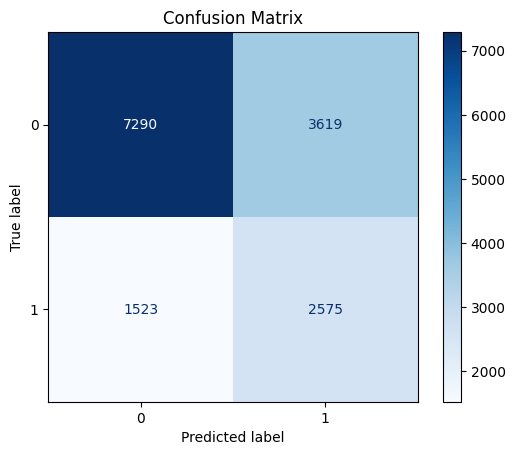

In [8]:
print(classification_report(y_te, y_pred))
#print("Hold-out ROC-AUC:", roc_auc_score(y_te, y_prob))


# === STEP 8: Confusion Matrix ===
cm = confusion_matrix(y_te, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()


In [9]:
def vendor_information_and_extra_data_cleaning(final_result_df):
    a=final_result_df.copy()
    a['vendor_name_1'] = a['vendor_name_1'].fillna('UNKNOWN')
    cols = [
            'p2o_unit_conv_denom_src_po','o2b_unit_conv_denom_src_po',
            'p2o_unit_conv_num_src_po','o2b_unit_conv_num_src_po',
            'material_no_src_po','matl_group_src_po','exchange_rate_hpd_po',
    
            'principal_purch_agrmt_item_no_src_po','principal_purch_agrmt_no_hpd_po'
        ]
    a[cols] = (a[cols].astype("string")
                         .apply(lambda s: s.str.replace(r'(?<=\d)\.0+$', '', regex=True))
                         .fillna(""))
    #a.shape
    final_result_df_2=a.copy()
    return final_result_df_2
final_result_df_2=vendor_information_and_extra_data_cleaning(final_result_df)
final_result_df_2.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0,0,1,1,None,X,X,300000.00,X,None,,6100,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362,1,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0,0,1,1,None,X,X,29734.78,X,None,,6220,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560,1,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,90326.12,0,0,AAECM6285C,0,0,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None
2,4000003551,00020,12009706,00020,BADRINATHA,2024-05-03,MSPL,0,0,1,1,None,X,X,300.00,X,None,,6220,300.00,300.00,AU,1.0,AV01,DEVELOPMENT FEE,0.0,0.0,002,0,4000003551^00020,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560,1,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,9032

In [10]:
def evidence_part_1(final_result_df_2, invoice_df=None):
    # =====================================================
    # IMPORTS (local to keep function self-contained)
    # =====================================================
    import time, logging
    from typing import Optional
    import numpy as np
    import pandas as pd

    # =====================================================
    # CONFIG
    # =====================================================
    SPLIT_WINDOW_DAYS    = 60
    MAX_LINES_PER_RULE   = 50
    CURRENCY_MUST_MATCH  = True
    EPS_ZERO_DELTA_PCT   = 0.0
    HIDE_NO_RISK_SUBSECTIONS = True

    DOC_TYPE_EXCLUDE_70 = {
        "NULL","AN","AR","MN","QC","QI","QS","RS","SC","SG","SR","SS","ST","TP","TR","UB","WK"
    }
    DOC_TYPE_EXCLUDE_6768 = {
        "NULL","AN","AR","MN","QC","QI","QS","RS","SC","SG","SR","SS","ST","TP","TR","UB","WK",
        "FO","RS1","RS2","RS3","RS4","PS1","PS2","PS3","PS4","ZSB"
    }

    # =====================================================
    # SYNONYMS & STANDARDIZATION
    # =====================================================
    COL_SYNONYMS = {
        "purch_doc_no_src_po":            ["purch_doc_no_src_po", "po_no", "purch_doc_no", "purch_doc_no_po"],
        "purch_doc_item_no_src_po":       ["purch_doc_item_no_src_po", "po_item", "item_no"],
        "purch_doc_type_hpd_po":          ["purch_doc_type_hpd_po", "purch_doc_type", "doc_type"],
        "release_indicator_hpd_po":       ["release_indicator_hpd_po", "release_indicator", "rel_ind", "rel_ind_hpd_po", "release_status_po"],
        "doc_change_date_hpd_po":         ["doc_change_date_hpd_po", "doc_change_date"],
        "purch_doc_date_hpd_po":          ["purch_doc_date_hpd_po", "purch_doc_date", "po_date"],
        "vendor_or_creditor_acct_no_hpd_po": ["vendor_or_creditor_acct_no_hpd_po", "vendor_code", "vendor_id"],
        "vendor_name_1":                  ["vendor_name_1", "vendor_name"],
        "material_no_src_po":             ["material_no_src_po", "material_code", "material"],
        "short_text_src_po":              ["short_text_src_po", "short_text", "item_desc", "description"],
        "order_uom_src_po":               ["order_uom_src_po", "uom"],
        "quantity_src_po":                ["quantity_src_po", "qty", "quantity"],
        "net_val_po_curr_src_po":         ["net_val_po_curr_src_po", "net_value", "net_val"],
        "gross_val_po_curr_src_po":       ["gross_val_po_curr_src_po", "gross_value", "gross_val"],
        "currency_hpd_po":                ["currency_hpd_po", "currency", "curr"],
        "company_code_hpd_po":            ["company_code_hpd_po", "company_code", "bukrs"],
        "plant_src_po":                   ["plant_src_po", "plant", "werk"],
        "purch_org_hpd_po":               ["purch_org_hpd_po", "purch_org", "ekorg"],
        "requester_name_src_po":          ["requester_name_src_po", "requestor_name", "requester_name"],
        "po_item_del_flag_src_po":        ["po_item_del_flag_src_po", "deletion_indicator", "del_flag"],
        "pr_no_src_po":                   ["pr_no_src_po", "pr_no", "purchase_req_no"],
        "pr_item_no_src_po":              ["pr_item_no_src_po", "pr_item", "pr_item_no", "purchase_req_item", "preq_item"],
        "matl_group_src_po":              ["matl_group_src_po", "material_group", "mat_group", "matl_group"],
        "net_price_doc_curr_src_po":      ["net_price_doc_curr_src_po", "net_unit_price", "unit_price", "price", "unit_rate"],
        "base_id_src_po":                 ["base_id_src_po", "base_id", "id_src"],
        "material_type_src_po":           ["material_type_src_po", "material_type", "mat_type", "mtart"],
        "on_release_total_value_hpd_po":  ["on_release_total_value_hpd_po", "on_release_total_value", "po_total_value", "total_po_value"],
        "doc_change_date_src_po":         ["doc_change_date_src_po", "doc_change_date_src"],
        "exchange_rate_hpd_po":           ["exchange_rate_hpd_po", "exchange_rate"],
        "record_creation_dt":             ["record_creation_dt", "vendor_record_creation_dt"],
        "tax_no_3":                       ["tax_no_3", "tax_id_3"],
    }

    INV_SYNONYMS = {
        "purch_doc_mapping_invoice":  ["purch_doc_mapping_invoice", "base_id", "base_id_src_po", "po_item_key"],
        "amt_doc_curr_src_invoice":   ["amt_doc_curr_src_invoice", "invoice_amount", "inv_amount", "amt_doc_curr"],
        "quantity_src_invoice":       ["quantity_src_invoice", "invoice_quantity", "inv_quantity", "quantity"],
        "reversal_doc_no_hpd_invoice":["reversal_doc_no_hpd_invoice", "reversal_doc_no", "reversal_doc"],
        "base_id_src_invoice":        ["base_id_src_invoice", "invoice_no", "invoice_id",
                                       "accounting_doc_no_src_invoice", "belnr", "acc_doc_no"],
    }

    def _first_present(df, names):
        m = {c.lower(): c for c in df.columns}
        for n in names:
            if n.lower() in m:
                return m[n.lower()]
        return None

    def standardize(df: pd.DataFrame) -> pd.DataFrame:
        df = df.copy()
        df.columns = [c.strip() for c in df.columns]
        for canon, variants in COL_SYNONYMS.items():
            if canon not in df.columns:
                src = _first_present(df, variants)
                if src is not None:
                    df[canon] = df[src]

        for c in ["net_price_doc_curr_src_po","net_val_po_curr_src_po",
                  "gross_val_po_curr_src_po","on_release_total_value_hpd_po",
                  "exchange_rate_hpd_po","quantity_src_po"]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        df['net_price_doc_curr_src_po_with_exchange_rate']       = df["net_price_doc_curr_src_po"] * df["exchange_rate_hpd_po"]
        df['net_val_po_curr_src_po_with_exchange_rate']          = df["net_val_po_curr_src_po"] * df["exchange_rate_hpd_po"]
        df['gross_val_po_curr_src_po_with_exchange_rate']        = df["gross_val_po_curr_src_po"] * df["exchange_rate_hpd_po"]
        df['on_release_total_value_hpd_po_with_exchange_rate']   = df["on_release_total_value_hpd_po"] * df["exchange_rate_hpd_po"]

        required = [
            "purch_doc_no_src_po","purch_doc_item_no_src_po","purch_doc_type_hpd_po",
            "release_indicator_hpd_po","doc_change_date_hpd_po","purch_doc_date_hpd_po",
            "vendor_or_creditor_acct_no_hpd_po","vendor_name_1",
            "material_no_src_po","short_text_src_po","matl_group_src_po","material_type_src_po",
            "order_uom_src_po","quantity_src_po","net_price_doc_curr_src_po",
            "net_val_po_curr_src_po","gross_val_po_curr_src_po",
            "currency_hpd_po","company_code_hpd_po","po_item_del_flag_src_po",
            "plant_src_po","purch_org_hpd_po","pr_no_src_po","pr_item_no_src_po",
            "base_id_src_po","doc_change_date_src_po",
            "on_release_total_value_hpd_po",
            "net_price_doc_curr_src_po_with_exchange_rate",
            "net_val_po_curr_src_po_with_exchange_rate",
            "gross_val_po_curr_src_po_with_exchange_rate",
            "on_release_total_value_hpd_po_with_exchange_rate",
            "risk_score","risk_level","main_risk_scenario","sub_risk_1","sub_risk_2","sub_risk_3",
            "impact_1","impact_2","impact_3","impact_4","impact_5",
            "exchange_rate_hpd_po","record_creation_dt","tax_no_3"
        ]
        for c in required:
            if c not in df.columns:
                df[c] = np.nan

        for c in ["purch_doc_date_hpd_po","doc_change_date_hpd_po","doc_change_date_src_po","record_creation_dt"]:
            if c in df.columns:
                df[c] = pd.to_datetime(df[c], errors="coerce")
        return df

    def standardize_invoice(inv: pd.DataFrame) -> pd.DataFrame:
        inv = inv.copy()
        inv.columns = [c.strip() for c in inv.columns]
        for canon, variants in INV_SYNONYMS.items():
            if canon not in inv.columns:
                src = _first_present(inv, variants)
                if src is not None:
                    inv[canon] = inv[src]
        for c in ["amt_doc_curr_src_invoice","quantity_src_invoice"]:
            if c in inv.columns:
                inv[c] = pd.to_numeric(inv[c], errors="coerce")
        for c in ["purch_doc_mapping_invoice","amt_doc_curr_src_invoice","quantity_src_invoice",
                  "reversal_doc_no_hpd_invoice","base_id_src_invoice"]:
            if c not in inv.columns:
                inv[c] = np.nan
        return inv

    # =====================================================
    # HELPERS
    # =====================================================
    def _clean(x):
        if x is None or pd.isna(x): return ""
        return str(x).strip()

    def _num(x):
        try:
            if x is None or (isinstance(x,str) and not x.strip()): return np.nan
            return float(x)
        except Exception:
            return np.nan

    def _to_date(s):
        if pd.isna(s): return pd.NaT
        return pd.to_datetime(s, errors="coerce")

    #def _best_date(row):
        #dt = _to_date(row.get("purch_doc_date_hpd_po"))
        #if pd.notna(dt):
            #return dt.normalize()
        #return pd.NaT

    

    #def _date_str(dt):
        #return dt.date().isoformat() if pd.notna(dt) else "-"
    def _best_date(row):
        # safely extract and convert to datetime
        val = row.get("purch_doc_date_hpd_po", None)
        if pd.isna(val) or val in ["", None]:
            return pd.NaT
    
        dt = pd.to_datetime(val, errors="coerce")
        if pd.isna(dt):
            return pd.NaT
        return dt.normalize()  # ensure it's a proper pandas.Timestamp


    def _date_str(dt):
        # handles both pd.Timestamp and string gracefully
        if pd.isna(dt) or dt is None or dt == "":
            return "-"
        try:
            # if string, convert to datetime
            if isinstance(dt, str):
                dt = pd.to_datetime(dt, errors="coerce")
            if pd.isna(dt):
                return "-"
            return dt.strftime("%d-%m-%Y")
        except Exception as e:
            print("⚠️ Error while formatting date:", e)
            return "-"

    def _starts_with_4(s):
        s = _clean(s)
        return s.startswith("4")

    def _is_deleted(flag):
        f = _clean(flag).upper()
        return f in {"L","X"}

    def _is_subject_skip(flag):
        return _clean(flag).upper() == "L"

    def _uom_price(row):
        return _num(row.get("net_price_doc_curr_src_po_with_exchange_rate"))

    def _delta_pct(ref_price, cmp_price):
        if pd.isna(ref_price) or ref_price == 0 or pd.isna(cmp_price):
            return np.nan
        return 100.0 * (ref_price - cmp_price) / abs(ref_price)

    def _po_total_value(df, subject_row):
        po  = _clean(subject_row.get("purch_doc_no_src_po"))
        cur = "INR"
        if not po:
            tv = _num(subject_row.get("on_release_total_value_hpd_po_with_exchange_rate"))
            return cur, (None if pd.isna(tv) else tv)
        df_po = df[df["purch_doc_no_src_po"].astype(str).str.strip() == po]
        total_net = pd.to_numeric(df_po["net_val_po_curr_src_po_with_exchange_rate"], errors="coerce").sum()
        if total_net and not pd.isna(total_net) and total_net > 0:
            return cur, total_net
        tv = _num(subject_row.get("on_release_total_value_hpd_po_with_exchange_rate"))
        return cur, (None if pd.isna(tv) else tv)

    def _opt_join(*vals):
        got = [str(v).strip() for v in vals if v is not None and str(v).strip() and str(v).strip().lower() not in {"none","nan"}]
        return ", ".join(got)

    # =====================================================
    # FILTERS + COMPARATORS (existing 67/68/70/72)
    # =====================================================
    def _released_only(df):
        return df[df["release_indicator_hpd_po"].astype(str).str.upper() == "R"].copy()

    def _base_filter_common(df):
        out = _released_only(df)
        out = out[out["material_no_src_po"].astype(str).str.strip() != ""]
        out = out[~out["po_item_del_flag_src_po"].apply(_is_deleted)]
        out = out[~out["plant_src_po"].apply(_starts_with_4)]
        return out

    def _filter_for_67(df):
        out = _base_filter_common(df)
        out = out[~out["purch_doc_type_hpd_po"].isin(DOC_TYPE_EXCLUDE_6768)]
        return out

    def _filter_for_68(df):
        out = _base_filter_common(df)
        out = out[~out["purch_doc_type_hpd_po"].isin(DOC_TYPE_EXCLUDE_6768)]
        return out

    def _filter_for_70(df):
        out = _released_only(df)
        out = out[~out["purch_doc_type_hpd_po"].isin(DOC_TYPE_EXCLUDE_70)]
        out = out[~out["po_item_del_flag_src_po"].apply(_is_deleted)]
        out = out[~out["plant_src_po"].apply(_starts_with_4)]
        gv = pd.to_numeric(out["gross_val_po_curr_src_po_with_exchange_rate"], errors="coerce")
        nv = pd.to_numeric(out["net_val_po_curr_src_po_with_exchange_rate"], errors="coerce")
        out = out[gv.fillna(nv).fillna(0) >= 0.0]
        return out

    def _norm_keys(df):
        b = df.copy()
        for c in [
            "vendor_or_creditor_acct_no_hpd_po","company_code_hpd_po","currency_hpd_po",
            "material_no_src_po","short_text_src_po","purch_doc_no_src_po","purch_doc_item_no_src_po",
            "pr_no_src_po","pr_item_no_src_po","base_id_src_po"
        ]:
            if c in b.columns:
                b[c] = b[c].astype(str).str.strip()
        return b

    def comps_67(subject, df) -> pd.DataFrame:
        base = _filter_for_67(df); b = _norm_keys(base)
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        mat    = _clean(subject.get("material_no_src_po"))
        if not vendor or not mat: return pd.DataFrame()
        cand = b[(b["vendor_or_creditor_acct_no_hpd_po"] == vendor) & (b["material_no_src_po"] == mat)].copy()
        cand = cand[~((cand["purch_doc_no_src_po"] == _clean(subject["purch_doc_no_src_po"])) &
                      (cand["purch_doc_item_no_src_po"] == _clean(subject["purch_doc_item_no_src_po"])))]
        cand["__date"]  = cand.apply(_best_date, axis=1)
        cand["__price"] = pd.to_numeric(cand['net_price_doc_curr_src_po_with_exchange_rate'], errors="coerce")
        cand["__delta_pct"] = cand["__price"].apply(lambda up: _delta_pct(_uom_price(subject), up))
        cand = cand.dropna(subset=["__price"])
        cand = cand[cand["__delta_pct"] >EPS_ZERO_DELTA_PCT]
        cand = cand.sort_values(by=["__delta_pct"], ascending=False)
        return cand

    def comps_68(subject, df) -> pd.DataFrame:
        base = _filter_for_68(df); b = _norm_keys(base)
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        mat    = _clean(subject.get("material_no_src_po"))
        if not mat: return pd.DataFrame()
        cond = (b["material_no_src_po"] == mat)
        if vendor: cond = cond & (b["vendor_or_creditor_acct_no_hpd_po"] != vendor)
        cand = b[cond].copy()
        cand = cand[~((cand["purch_doc_no_src_po"] == _clean(subject["purch_doc_no_src_po"])) &
                      (cand["purch_doc_item_no_src_po"] == _clean(subject["purch_doc_item_no_src_po"])))]
        cand["__date"]  = cand.apply(_best_date, axis=1)
        cand["__price"] = pd.to_numeric(cand['net_price_doc_curr_src_po_with_exchange_rate'], errors="coerce")
        cand["__delta_pct"] = cand["__price"].apply(lambda up: _delta_pct(_uom_price(subject), up))
        cand = cand.dropna(subset=["__price"])
        cand = cand[cand["__delta_pct"] >EPS_ZERO_DELTA_PCT]
        cand = cand.sort_values(by=["__delta_pct"], ascending=False)
        return cand

    def comps_70(subject, df) -> pd.DataFrame:
        base = _filter_for_70(df); b = _norm_keys(base)
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        cc     = _clean(subject.get("company_code_hpd_po"))
        mat    = _clean(subject.get("material_no_src_po"))
        st     = _clean(subject.get("short_text_src_po")).lower()
        d0     = _best_date(subject)
        if not (vendor and cc and pd.notna(d0)): return pd.DataFrame()
        cond = ((b["vendor_or_creditor_acct_no_hpd_po"] == vendor) & (b["company_code_hpd_po"] == cc))
        if mat:
            cond = cond & (b["material_no_src_po"] == mat)
        else:
            cond = cond & (b["short_text_src_po"].str.lower() == st)
        cand = b[cond].copy()
        cand = cand[~((cand["purch_doc_no_src_po"] == _clean(subject["purch_doc_no_src_po"])) &
                      (cand["purch_doc_item_no_src_po"] == _clean(subject["purch_doc_item_no_src_po"])))]
        cand["__date"] = pd.to_datetime(cand["purch_doc_date_hpd_po"], errors="coerce")
        m = cand["__date"].isna()
        cand.loc[m, "__date"] = pd.to_datetime(cand.loc[m, "doc_change_date_hpd_po"], errors="coerce")
        m = cand["__date"].isna()
        cand.loc[m, "__date"] = pd.to_datetime(cand.loc[m, "doc_change_date_src_po"], errors="coerce")
        cand = cand.dropna(subset=["__date"])
        lo, hi = d0 - pd.Timedelta(days=SPLIT_WINDOW_DAYS), d0 + pd.Timedelta(days=SPLIT_WINDOW_DAYS)
        cand = cand[(cand["__date"] >= lo) & (cand["__date"] <= hi)]
        cand["__price"] = pd.to_numeric(cand['net_price_doc_curr_src_po_with_exchange_rate'], errors="coerce")
        cand["__delta_pct"] = cand["__price"].apply(lambda up: _delta_pct(_uom_price(subject), up))
        cand = cand.dropna(subset=["__price"])
        cand = cand.sort_values(by=["__date"], ascending=True)
        return cand

    def comps_72(subject, df, strict_pr_item: bool = True) -> pd.DataFrame:
        d = _released_only(standardize(df)); b = _norm_keys(d)
        pr   = _clean(subject.get("pr_no_src_po"))
        prit = _clean(subject.get("pr_item_no_src_po"))
        if not pr: return pd.DataFrame()
        subset = b[(b["pr_no_src_po"] == pr) & (b["pr_item_no_src_po"] == prit)] if strict_pr_item else b[(b["pr_no_src_po"] == pr)]
        subset = subset[~((subset["purch_doc_no_src_po"] == _clean(subject["purch_doc_no_src_po"])) &
                          (subset["purch_doc_item_no_src_po"] == _clean(subject["purch_doc_item_no_src_po"])))]
        subset = subset.copy()
        subset["__date"]  = subset.apply(_best_date, axis=1)
        subset["__price"] = pd.to_numeric(subset['net_price_doc_curr_src_po_with_exchange_rate'], errors="coerce")
        subset["__delta_pct"] = subset["__price"].apply(lambda up: _delta_pct(_uom_price(subject), up))
        subset = subset.dropna(subset=["__price"])
        subset = subset.sort_values(by=["__date"], ascending=True)
        return subset

    # =====================================================
    # INVOICE>PO PRECOMPUTE (Amount & Quantity split)
    # =====================================================
    inv_std = None
    PRE_MAP = {}

    def _precompute_invoice_vs_po_flags(df_std: pd.DataFrame, inv_std_: pd.DataFrame) -> pd.DataFrame:
        """
        Gate:
          - PO rows: release_indicator_hpd_po == 'R' AND po_item_del_flag_src_po is NaN
          - INV rows: reversal_doc_no_hpd_invoice is NaN
        Aggregation:
          - group by base_id_src_po / purch_doc_mapping_invoice -> 'base_id'
          - inv totals: sum(amt_doc_curr_src_invoice), sum(quantity_src_invoice)
          - po refs: max(net_val_po_curr_src_po), max(quantity_src_po)
        Tolerances:
          - Amount: round(2); inv_total_amt > po_val_ref + 0.01
          - Quantity: round(6); inv_total_qty > po_qty_ref + 1e-9
        """
        if inv_std_ is None or df_std is None or df_std.empty:
            return pd.DataFrame(columns=[
                "base_id","invoice_amt_gt_po_flag","invoice_qty_gt_po_flag",
                "inv_total_amt","inv_total_qty","po_val_ref","po_qty_ref","currency",
                "amt_excess","qty_excess"
            ])

        # ---- PO gate (R & not deleted) ----
        d = df_std.copy()
        d["release_indicator_hpd_po"] = d["release_indicator_hpd_po"].astype(str).str.upper()
        po_gate = d[(d["release_indicator_hpd_po"] == "R") & (d["po_item_del_flag_src_po"].isna())].copy()
        po_gate["net_val_po_curr_src_po"] = pd.to_numeric(po_gate["net_val_po_curr_src_po"], errors="coerce")
        po_gate["quantity_src_po"]        = pd.to_numeric(po_gate["quantity_src_po"], errors="coerce")

        po_refs = (po_gate.groupby("base_id_src_po", dropna=False)
                   .agg(po_val_ref=("net_val_po_curr_src_po","max"),
                        po_qty_ref=("quantity_src_po","max"),
                        currency=("currency_hpd_po", lambda s: next((str(x) for x in s if pd.notna(x)), "INR")))
                   .reset_index().rename(columns={"base_id_src_po":"base_id"}))

        # ---- INV gate (not reversed) ----
        inv_gate = inv_std_[inv_std_["reversal_doc_no_hpd_invoice"].isna()].copy()
        inv_gate["amt_doc_curr_src_invoice"] = pd.to_numeric(inv_gate["amt_doc_curr_src_invoice"], errors="coerce")
        inv_gate["quantity_src_invoice"]     = pd.to_numeric(inv_gate["quantity_src_invoice"], errors="coerce")

        inv_grp = (inv_gate.groupby("purch_doc_mapping_invoice", dropna=False)
                   .agg(inv_total_amt=("amt_doc_curr_src_invoice","sum"),
                        inv_total_qty=("quantity_src_invoice","sum"))
                   .reset_index().rename(columns={"purch_doc_mapping_invoice":"base_id"}))

        # ---- Merge & compare with tolerances ----
        m = po_refs.merge(inv_grp, on="base_id", how="left")

        m["inv_total_amt"] = m["inv_total_amt"].round(2)
        m["po_val_ref"]    = m["po_val_ref"].round(2)
        m["inv_total_qty"] = m["inv_total_qty"].round(6)
        m["po_qty_ref"]    = m["po_qty_ref"].round(6)

        AMT_ATOL = 0.01
        QTY_ATOL = 1e-9

        m["invoice_amt_gt_po_flag"] = (
            m["inv_total_amt"].notna() & m["po_val_ref"].notna() &
            (m["inv_total_amt"] > (m["po_val_ref"] + AMT_ATOL))
        ).astype(int)

        m["invoice_qty_gt_po_flag"] = (
            m["inv_total_qty"].notna() & m["po_qty_ref"].notna() &
            (m["inv_total_qty"] > (m["po_qty_ref"] + QTY_ATOL))
        ).astype(int)

        # explicit differences
        m["amt_excess"] = (m["inv_total_amt"] - m["po_val_ref"]).round(2)
        m["qty_excess"] = (m["inv_total_qty"] - m["po_qty_ref"]).round(6)

        return m

    # =====================================================
    # RENDER HELPERS
    # =====================================================
    def _fmt_inr(val, cur):
        if val is None or pd.isna(val): return ""
        try: return f"{cur} {float(val):,.2f}".strip()
        except Exception: return f"{cur} {val}"

    def _fmt_pct(p):
        if pd.isna(p): return ""
        return f"{p:+.1f}%"

    def _qty_uom_price(row):
        qty = pd.to_numeric(row.get("quantity_src_po"), errors="coerce")
        uom = _clean(row.get("order_uom_src_po"))
        cur = "INR"
        up  = _uom_price(row)
        def _fmt_qty(q):
            if pd.isna(q): return ""
            s = f"{float(q):.3f}".rstrip("0").rstrip(".")
            return s
        left  = " ".join([p for p in (_fmt_qty(qty), uom) if p])
        right = "" if pd.isna(up) else f"{cur} {float(up):,.2f}".strip()
        if left and right: return f"{left} @ {right}"
        if left:           return left
        if right:          return right
        return ""

    def _mk_markdown_table_from_df(df: pd.DataFrame, title: str):
        if df is None or len(df) == 0:
            if HIDE_NO_RISK_SUBSECTIONS: return None
            return f"**{title}**\n\nNo Risk\n"
        md = [f"**{title}**", ""]
        md.append("| " + " | ".join(df.columns) + " |")
        md.append("|" + "|".join(["---"] * len(df.columns)) + "|")
        for _, r in df.iterrows():
            md.append("| " + " | ".join("" if pd.isna(x) else str(x) for x in r.values) + " |")
        md.append("")
        return "\n".join(md)

    def _subject_key_table(s, df_full):
        cur = "INR"
        po   = _clean(s.get("purch_doc_no_src_po"))
        it   = _clean(s.get("purch_doc_item_no_src_po"))
        prn  = _clean(s.get("pr_no_src_po"))
        pri  = _clean(s.get("pr_item_no_src_po"))
        rel  = _clean(s.get("release_indicator_hpd_po"))
        ven  = _clean(s.get("vendor_or_creditor_acct_no_hpd_po"))
        venm = _clean(s.get("vendor_name_1"))
        mat  = _clean(s.get("material_no_src_po"))
        mtp  = _clean(s.get("material_type_src_po"))
        txt  = _clean(s.get("short_text_src_po"))
        plant= _clean(s.get("plant_src_po"))
        org  = _clean(s.get("purch_org_hpd_po"))
        req  = _clean(s.get("requester_name_src_po"))
        pdt = _date_str(_best_date(s))
        delF = _clean(s.get("po_item_del_flag_src_po"))

        qty_price = _qty_uom_price(s)
        netv   = pd.to_numeric(s.get("net_val_po_curr_src_po_with_exchange_rate"), errors="coerce")
        grossv = pd.to_numeric(s.get("gross_val_po_curr_src_po_with_exchange_rate"), errors="coerce")
        cur_tv, total_po_val = _po_total_value(df_full, s)

        rows = [
            ("PO / Item & PR Ref",      f"{po} / {it} & PR {prn} / {pri}".strip()),
            ("Release Status",          rel),
            ("Vendor no - Name",        f"{ven} – {venm}".strip(" –")),
            ("Material – Text, Type",   f"{mat} — {txt}, Type {mtp}".strip(" ,")),
            ("Plant / Org",             f"{plant} / {org}".strip(" /")),
            ("Requester",               req),
            ("Purchase Date",           pdt),
            ("Quantity / Unit & Unit Price", qty_price),
            ("Net / Gross Value",       _fmt_inr(netv if not pd.isna(netv) else grossv, cur)),
            ("Total PO Value",          "-" if total_po_val is None else _fmt_inr(total_po_val, cur_tv)),
            ("Deletion Indicator",      "(blank)" if not delF else delF),
        ]
        out = ["| Field | Value |", "|---|---|"]
        out += [f"| {k} | {v} |" for k, v in rows]
        return "\n".join(out)

    def _variance_cols(comps_df, subject_row):
        cur_up = _uom_price(subject_row)
        qty = pd.to_numeric(subject_row.get("quantity_src_po"), errors="coerce")
        df = comps_df.copy()
        df["Δ vs Current"] = df["__delta_pct"].apply(_fmt_pct)
        df["Variance Value/Unit"] = cur_up - df["__price"]
        df["Variance Value"] = np.where(pd.notna(qty), df["Variance Value/Unit"] * qty, np.nan)
        return df

    def _mk_rule_table(header_title, comps_df, subject_row):
        if comps_df is None or len(comps_df) == 0:
            if HIDE_NO_RISK_SUBSECTIONS: return None
            return f"**{header_title}**\n\nNo Risk\n"
        cur = "INR"
        df = _variance_cols(comps_df, subject_row)
        disp = pd.DataFrame({
            "PO → Item": df["purch_doc_no_src_po"].astype(str).str.strip() + "/" + df["purch_doc_item_no_src_po"].astype(str).str.strip(),
            "Vendor": df["vendor_or_creditor_acct_no_hpd_po"].astype(str).str.strip(),
            "Price/Unit": df["__price"].apply(lambda v: _fmt_inr(v, cur)).astype(str),
            "Qty": df.get("quantity_src_po", pd.Series(index=df.index)).astype(str).replace("nan",""),
            "Δ vs Current": df["Δ vs Current"].fillna(""),
            "Variance Value/Unit": df["Variance Value/Unit"].apply(lambda v: "" if pd.isna(v) else f"{v:,.2f}").astype(str),
            "Variance Value": df["Variance Value"].apply(lambda v: "" if pd.isna(v) else f"{v:,.2f}").astype(str),
            "Date": df["__date"].apply(_date_str),
            "Material": df["material_no_src_po"].astype(str).str.strip(),
            "Text": df["short_text_src_po"].astype(str).str.strip(),
            "PR": df["pr_no_src_po"].astype(str).str.strip() + "/" + df["pr_item_no_src_po"].astype(str).str.strip(),
            "Deletion Indicator": df["po_item_del_flag_src_po"].astype(str).str.strip().replace({"nan": ""}),
        })
        md = [f"**{header_title}**", ""]
        md.append("| " + " | ".join(disp.columns) + " |")
        md.append("|" + "|".join(["---"] * len(disp.columns)) + "|")
        for _, r in disp.iterrows():
            md.append("| " + " | ".join(r.values) + " |")
        md.append("")
        return "\n".join(md)

    # ---------- E: Invoice > PO (split into amount vs quantity) ----------
    def ev_invoice_more_than_po(subject, df_full) -> str | None:
        """
        E: Invoice > PO sub-rules:
           - E.Amt: Invoice Amount > PO Value (tol ₹0.01)
           - E.Qty: Invoice Qty   > PO Qty   (tol 1e-9)
        Gate: PO released & not deleted; invoices not reversed.
        Shows: contributing invoice IDs per subtype and differences.
        """
        base_id = _clean(subject.get("base_id_src_po"))
        if not base_id or base_id not in PRE_MAP:
            return None

        row = PRE_MAP[base_id]
        cur = row.get("currency") or "INR"
        inv_total_amt = row.get("inv_total_amt")
        inv_total_qty = row.get("inv_total_qty")
        po_val_ref    = row.get("po_val_ref")
        po_qty_ref    = row.get("po_qty_ref")
        flag_amt      = int(row.get("invoice_amt_gt_po_flag", 0))
        flag_qty      = int(row.get("invoice_qty_gt_po_flag", 0))
        flag_any      = int(bool(flag_amt or flag_qty))
        amt_excess    = row.get("amt_excess")
        qty_excess    = row.get("qty_excess")

        # NEW: if neither amount nor quantity breaches, hide Rule E entirely
        if flag_any == 0:
            return None

        # Contributing invoices (gated: not reversed) – raw first (for ID lists)
        cond = (inv_std["purch_doc_mapping_invoice"].astype(str).str.strip() == base_id) & (inv_std["reversal_doc_no_hpd_invoice"].isna())
        lines_raw = (inv_std[cond]
                     .groupby("base_id_src_invoice", dropna=True)
                     .agg(Amount=("amt_doc_curr_src_invoice","sum"),
                          Quantity=("quantity_src_invoice","sum"))
                     .reset_index())

        # ID lists per metric (mention IDs when that subtype breaches)
        inv_ids_amt = lines_raw.loc[lines_raw["Amount"]   > 0, "base_id_src_invoice"].astype(str).tolist()
        inv_ids_qty = lines_raw.loc[lines_raw["Quantity"] > 0, "base_id_src_invoice"].astype(str).tolist()

        # Pretty display table
        lines = lines_raw.copy()
        inv_lines_disp = None
        if len(lines):
            lines["Amount"]   = lines["Amount"].apply(lambda v: _fmt_inr(v, cur) if pd.notna(v) else "")
            lines["Quantity"] = lines["Quantity"].apply(lambda v: "" if pd.isna(v) else f"{float(v):,.6f}".rstrip("0").rstrip("."))
            lines.rename(columns={"base_id_src_invoice":"Invoice ID"}, inplace=True)
            inv_lines_disp = _mk_markdown_table_from_df(lines[["Invoice ID","Amount","Quantity"]],
                                                        "E.1 Contributing Invoices (Gated)")

        # Group totals (with rounded differences already computed)
        disp = pd.DataFrame([
            ["Amount (Invoice Total)", _fmt_inr(inv_total_amt, cur),
             _fmt_inr(po_val_ref, cur),
             ("" if (pd.isna(amt_excess)) else _fmt_inr(amt_excess, cur)),
             ("YES" if flag_amt else "NO")],
            ["Quantity (Invoice Total)",
             ("" if pd.isna(inv_total_qty) else f"{inv_total_qty:,.6f}".rstrip("0").rstrip(".")),
             ("" if pd.isna(po_qty_ref) else f"{po_qty_ref:,.6f}".rstrip("0").rstrip(".")),
             ("" if pd.isna(qty_excess) else f"{qty_excess:,.6f}".rstrip("0").rstrip(".")),
             ("YES" if flag_qty else "NO")],
        ], columns=["Metric","Invoice","PO Ref","Excess","Breach?"])

        group_tbl = _mk_markdown_table_from_df(
            disp, f"E.2 Invoice vs PO — Group Totals (E.Amt={flag_amt}, E.Qty={flag_qty}, E.Any={flag_any})"
        )

        # Notes listing invoice IDs per subtype that breached
        notes = []
        if flag_amt:
            notes.append("**E.Amt – Invoices (IDs):** " + (", ".join(inv_ids_amt) if inv_ids_amt else "(none)"))
        if flag_qty:
            notes.append("**E.Qty – Invoices (IDs):** " + (", ".join(inv_ids_qty) if inv_ids_qty else "(none)"))
        notes_block = "\n\n".join(notes) if notes else None

        return "\n\n".join([b for b in [inv_lines_disp, group_tbl] if b]) #notes_block

    # ---------- F–I ----------
    def ev_blocked_vendor(subject) -> str | None:
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        vendor_name = _clean(subject.get("vendor_name_1"))
        flags = {
            "Central Deletion Flag": _clean(subject.get("central_deletion_flag")),
            "Central Purchase Block Flag": _clean(subject.get("central_purch_blk_flag")),
            "Central Posting Block Flag": _clean(subject.get("central_posting_blk_flag")),
        }
        any_x = any(v.upper()=="X" for v in flags.values())
        if not any_x:
            return None
        disp = pd.DataFrame(
            [{"Vendor": vendor, "Vendor Name": vendor_name, "Flag": k, "Value": ("X" if v.upper()=="X" else (v or ""))}
             for k, v in flags.items()]
        )
        return _mk_markdown_table_from_df(disp, "F. PO to Blocked Vendor — Block Indicators")

    def ev_new_vendor_gt_tolerance(subject) -> str | None:
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        vendor_name = _clean(subject.get("vendor_name_1"))
        po_dt  = pd.to_datetime(subject.get("purch_doc_date_hpd_po"), errors="coerce")
        rec_dt = pd.to_datetime(subject.get("record_creation_dt"), errors="coerce")
        po_val_inr = _num(subject.get("on_release_total_value_hpd_po_with_exchange_rate"))
        within_30  = (pd.notna(po_dt) and pd.notna(rec_dt) and abs((po_dt - rec_dt).days) <= 30)
        ge_1cr     = (pd.notna(po_val_inr) and po_val_inr >= 1e7)
        if not (within_30 and ge_1cr):
            return None
        disp = pd.DataFrame([{
            "Vendor": vendor,
            "Vendor Name": vendor_name,
            "Vendor Creation Date": _date_str(rec_dt),
            "PO Date": _date_str(po_dt),
            "Δ Days": (abs((po_dt - rec_dt).days) if (pd.notna(po_dt) and pd.notna(rec_dt)) else ""),
            "PO Value": _fmt_inr(po_val_inr, "INR"),
            "Checks": "≤ 30 days & ≥ 1 Cr"
        }])
        return _mk_markdown_table_from_df(disp, "G. PO to New Vendor > Tolerance (≤30 days & ≥ ₹1 Cr)")

    def _extract_pan_from_taxno3(val):
        s = _clean(val).upper()
        if not s: return None
        cand = s[2:-3] if len(s) > 5 else ""
        if len(cand) != 10 or not cand.isalnum():
            return None
        return cand

    def ev_pan4P_ge_1cr(subject) -> str | None:
        vendor = _clean(subject.get("vendor_or_creditor_acct_no_hpd_po"))
        vendor_name = _clean(subject.get("vendor_name_1"))
        pan = subject.get("pan_extracted")
        if pd.isna(pan) or not _clean(pan):
            pan = _extract_pan_from_taxno3(subject.get("tax_no_3"))
        po_val_inr = _num(subject.get("on_release_total_value_hpd_po_with_exchange_rate"))
        cond = (pan is not None) and (len(pan)==10) and (pan[3]=="P") and (pd.notna(po_val_inr) and po_val_inr>=1e7)
        if not cond:
            return None
        disp = pd.DataFrame([{
            "Vendor": vendor,
            "Vendor Name": vendor_name,
            "Original Tax No. 3": _clean(subject.get("tax_no_3")),
            "Extracted PAN": pan,
            "4th Char": pan[3],
            "PO Value": _fmt_inr(po_val_inr, "INR"),
            "Checks": "4th = 'P' & ≥ 1 Cr"
        }])
        return _mk_markdown_table_from_df(disp, "H. PAN 4th Char 'P' & Amount ≥ ₹1 Cr")

    def ev_missing_tax_id(subject) -> str | None:
        if pd.isna(subject.get("tax_no_3")) or _clean(subject.get("tax_no_3"))=="":
            disp = pd.DataFrame([{
                "Vendor": _clean(subject.get("vendor_or_creditor_acct_no_hpd_po")),
                "Vendor Name": _clean(subject.get("vendor_name_1")),
                "Tax No. 3": "(missing)"
            }])
            return _mk_markdown_table_from_df(disp, "I. Missing Tax ID (KYC)")
        return None

    # =====================================================
    # VERIFY & RENDER
    # =====================================================
    def verify_transaction_all(df_std: pd.DataFrame, po_no=None, po_item=None, base_id=None, idx=None,
                               strict_pr_item_72: bool = True):
        subject = select_subject_row(df_std, po_no=po_no, po_item=po_item, base_id=base_id, idx=idx)

        skip_reason = "Subject has deletion indicator 'L'." if _is_subject_skip(subject.get("po_item_del_flag_src_po")) else None
        if skip_reason:
            empty = pd.DataFrame()
            return {
                "Key Description": subject,
                "skip_reason": skip_reason,
                "rule_67": {"table": empty},
                "rule_68": {"table": empty},
                "rule_70": {"table": empty},
                "rule_72": {"table": empty},
                "rule_E": None, "rule_F": None, "rule_G": None, "rule_H": None, "rule_I": None,
                "df_full_std": df_std,
            }

        c67 = comps_67(subject, df_std)
        c68 = comps_68(subject, df_std)
        c70 = comps_70(subject, df_std)
        c72 = comps_72(subject, df_std, strict_pr_item=strict_pr_item_72)

        eE = ev_invoice_more_than_po(subject, df_std)
        eF = ev_blocked_vendor(subject)
        eG = ev_new_vendor_gt_tolerance(subject)
        eH = ev_pan4P_ge_1cr(subject)
        eI = ev_missing_tax_id(subject)

        return {
            "Key Description": subject,
            "skip_reason": None,
            "rule_67": {"table": c67},
            "rule_68": {"table": c68},
            "rule_70": {"table": c70},
            "rule_72": {"table": c72},
            "rule_E": eE, "rule_F": eF, "rule_G": eG, "rule_H": eH, "rule_I": eI,
            "df_full_std": df_std,
        }

    def _header_share(row, df):
        cur='INR'
        line_val = _num(row.get("net_val_po_curr_src_po_with_exchange_rate"))
        if pd.isna(line_val):
            line_val = _num(row.get("gross_val_po_curr_src_po_with_exchange_rate"))
        po = _clean(row.get("purch_doc_no_src_po"))
        if not po or pd.isna(line_val):
            return cur, line_val, None
        header_sum = pd.to_numeric(df[df["purch_doc_no_src_po"].astype(str) == po]["net_val_po_curr_src_po_with_exchange_rate"], errors="coerce").sum()
        if not header_sum or header_sum == 0:
            return cur, line_val, None
        return cur, line_val, round(100.0 * line_val / header_sum, 2)

    def _risk_drivers_block(res, subject_row):
        drivers = []
        if len(res["rule_67"]["table"]) > 0: drivers.append("Price variance within same vendor.")
        if len(res["rule_68"]["table"]) > 0: drivers.append("Cross-vendor price variance.")
        if len(res["rule_70"]["table"]) > 0: drivers.append("Split POs (±60 days, same vendor/material).")
        if len(res["rule_72"]["table"]) > 0: drivers.append("Split POs PR-based (same PR line).")
        if res.get("rule_E"): drivers.append("Invoice amount or quantity exceeds PO.")
        if res.get("rule_F"): drivers.append("PO placed to blocked vendor.")
        if res.get("rule_G"): drivers.append("New vendor + high-value PO (≤30 days & ≥ ₹1 Cr).")
        if res.get("rule_H"): drivers.append("PAN 4th char = 'P' with amount ≥ ₹1 Cr.")
        if res.get("rule_I"): drivers.append("Vendor missing KYC (Tax ID).")
        return drivers if drivers else ["No Risk"]

    def render_all_docstyle(result_dict, df_full=None):
        s = result_dict["Key Description"]
        if df_full is None:
            df_full = result_dict.get("df_full_std", pd.DataFrame([s]))

        # 1. Context & Trigger
        score = _num(s.get("risk_score"))
        score_s = "-" if pd.isna(score) else f"{score:.2f}"
        risk_level = _clean(s.get("risk_level")) or "No Risk"
        main_scenario = _clean(s.get("main_risk_scenario")) or "No Risk"
        sub1 = _clean(s.get("sub_risk_1")); sub2 = _clean(s.get("sub_risk_2")); sub3 = _clean(s.get("sub_risk_3"))
        subs = _opt_join(sub1, sub2, sub3)
        sec1 = [
            "**1. Context & Trigger**",
            f"Sara Risk Score: {score_s} → {risk_level}",
            f"Risk Scenario: {main_scenario}" + (f" → **Sub-risk**: {subs}" if subs else ""),
            ""
        ]

        # 2. Key Description
        sec2 = ["**2. Key Description (PO Details)**", _subject_key_table(s, df_full), ""]

        # 3. Business Impact
        cur_s, line_val, _share = _header_share(s, df_full)
        cur_tv, total_po_val = _po_total_value(df_full, s)
        flagged = _fmt_inr(line_val, cur_s)
        total   = "-" if total_po_val is None else _fmt_inr(total_po_val, cur_tv)
        impacts = _opt_join(_clean(s.get("impact_1")), _clean(s.get("impact_2")), _clean(s.get("impact_3")), _clean(s.get("impact_4")), _clean(s.get("impact_5")))
        sec3 = ["**3. Business Impact**",
                f"Flagged Value: {flagged} out of PO total {total}.",
                f"Impact Areas: {impacts}." if impacts else "",
                ""]

        # 4. Risk Drivers
        drivers = _risk_drivers_block(result_dict, s)
        sec4 = ["**4. Risk Drivers**"] + [d for d in drivers if d] + [""]

        # 5. Evidence Blocks (A–D existing, E split, F–I existing)
        c67 = result_dict["rule_67"]["table"]
        c68 = result_dict["rule_68"]["table"]
        c70 = result_dict["rule_70"]["table"]
        c72 = result_dict["rule_72"]["table"]
        blocks = [
            _mk_rule_table("A. Price Variance — Same Vendor & Material (vs current unit price)", c67, s),
            _mk_rule_table("B. Price Variance — Cross Vendor (Same Material)", c68, s),
            _mk_rule_table(f"C. Split PO Activity (±{SPLIT_WINDOW_DAYS} Days, Same Vendor & Material)", c70, s),
            _mk_rule_table("D. Split PO PR-based (Same PR Line)", c72, s),
            result_dict.get("rule_E"),
            result_dict.get("rule_F"),
            result_dict.get("rule_G"),
            result_dict.get("rule_H"),
            result_dict.get("rule_I"),
        ]
        blocks = [b for b in blocks if b]

        sec5 = ["**5. Compared Transactions**", "No Risk", ""]
        if blocks:
            sec5 = ["**5. Compared Transactions**", *blocks]

        return "\n".join(sec1 + sec2 + sec3 + sec4 + sec5)

    # =====================================================
    # APPLY TO EACH ROW
    # =====================================================
    def select_subject_row(df, po_no=None, po_item=None, base_id=None, idx=None):
        d = standardize(df)
        if idx is not None: return d.iloc[int(idx)]
        if base_id:
            m = d[d["base_id_src_po"].astype(str).str.strip() == _clean(base_id)]
            if len(m): return m.iloc[0]
        if po_no and po_item:
            m = d[(d["purch_doc_no_src_po"].astype(str).str.strip()==_clean(po_no)) &
                  (d["purch_doc_item_no_src_po"].astype(str).str.strip()==_clean(po_item))]
            if len(m): return m.iloc[0]
        raise ValueError("Subject not found. Provide (po_no & po_item) or base_id or idx.")

    def build_word_style_explanations(df_std: pd.DataFrame,dest_col: str = "llm_explanation",progress_every: int = 200,use_tqdm: bool = True,logger: Optional[logging.Logger] = None,):
        n = len(df_std)
        out = []

        pbar = None
        if use_tqdm:
            try:
                from tqdm import tqdm as _tqdm
                pbar = _tqdm(total=n, desc="Building evidence", unit="rows")
            except Exception:
                pbar = None

        start = time.perf_counter()
        last_tick = start
        last_count = 0

        for i, (_, row) in enumerate(df_std.iterrows(), 1):
            try:
                res = verify_transaction_all(
                    df_std,
                    po_no=str(row.get("purch_doc_no_src_po", "")).strip(),
                    po_item=str(row.get("purch_doc_item_no_src_po", "")).strip(),
                    strict_pr_item_72=True
                )
                out.append(render_all_docstyle(res, df_full=df_std))
            except Exception as e:
                out.append(f"ERROR for {row.get('purch_doc_no_src_po')}/{row.get('purch_doc_item_no_src_po')}: {e}")

            if pbar:
                pbar.update(1)

            if progress_every and (i % progress_every == 0 or i == n):
                now = time.perf_counter()
                span = now - last_tick
                total_span = now - start
                delta_rows = i - last_count
                rps = (delta_rows / span) if span > 0 else float("inf")
                total_rps = (i / total_span) if total_span > 0 else float("inf")

                msg = (f"[evidence] processed {i:,}/{n:,} rows | "
                       f"chunk {delta_rows} rows in {span:.2f}s ({rps:.1f} rows/s) | "
                       f"total {total_span:.2f}s ({total_rps:.1f} rows/s)")
                if logger:
                    logger.info(msg)
                else:
                    print(msg)

                last_tick = now
                last_count = i

        if pbar:
            pbar.close()

        total_sec = time.perf_counter() - start
        summary = f"[evidence] done: {n:,} rows in {total_sec:.2f}s ({(n/total_sec if total_sec>0 else 0):.1f} rows/s)"
        if logger:
            logger.info(summary)
        else:
            print(summary)

        df_std[dest_col] = out
        return df_std

    # =====================================================
    # MAIN
    # =====================================================
    df_full = final_result_df_2.copy()
    df_std  = standardize(df_full)

    # Standardize & precompute invoice>PO flags (amount & qty) once
    if invoice_df is not None and len(invoice_df) > 0:
        inv_std = standardize_invoice(invoice_df)  # used by E block

        pre = _precompute_invoice_vs_po_flags(df_std, inv_std)
        if not pre.empty:
            # For evidence lookup
            PRE_MAP = pre.set_index("base_id").to_dict(orient="index")

            # Attach flags + differences onto output rows
            df_std = df_std.merge(
                pre[["base_id","invoice_amt_gt_po_flag","invoice_qty_gt_po_flag","amt_excess","qty_excess",
                     "inv_total_amt","inv_total_qty","po_val_ref","po_qty_ref"]],
                left_on="base_id_src_po", right_on="base_id", how="left"
            )

            # Rename merged cols to clearer names for downstream use if needed
            df_std.rename(columns={
                "amt_excess": "invoice_amt_excess",
                "qty_excess": "invoice_qty_excess"
            }, inplace=True)

            # Clean types
            for c in ["invoice_amt_gt_po_flag","invoice_qty_gt_po_flag"]:
                if c in df_std.columns:
                    df_std[c] = df_std[c].fillna(0).astype(int)
            df_std["invoice_more_than_po_flag"] = df_std[["invoice_amt_gt_po_flag","invoice_qty_gt_po_flag"]].max(axis=1).astype(int)

    # build explanations
    df_std = build_word_style_explanations(df_std, progress_every=100, use_tqdm=True)
    return df_std

# Example:
df_with_explanations = evidence_part_1(final_result_df_2, invoice_df=df_final_invoice)


Building evidence:   1%|          | 100/15007 [00:57<2:29:17,  1.66rows/s]

[evidence] processed 100/15,007 rows | chunk 100 rows in 57.56s (1.7 rows/s) | total 57.56s (1.7 rows/s)


Building evidence:   1%|▏         | 200/15007 [01:56<2:22:02,  1.74rows/s]

[evidence] processed 200/15,007 rows | chunk 100 rows in 58.76s (1.7 rows/s) | total 116.32s (1.7 rows/s)


Building evidence:   2%|▏         | 300/15007 [02:55<2:23:09,  1.71rows/s]

[evidence] processed 300/15,007 rows | chunk 100 rows in 58.89s (1.7 rows/s) | total 175.20s (1.7 rows/s)


Building evidence:   3%|▎         | 400/15007 [03:53<2:22:09,  1.71rows/s]

[evidence] processed 400/15,007 rows | chunk 100 rows in 58.59s (1.7 rows/s) | total 233.79s (1.7 rows/s)


Building evidence:   3%|▎         | 500/15007 [04:54<2:26:20,  1.65rows/s]

[evidence] processed 500/15,007 rows | chunk 100 rows in 60.28s (1.7 rows/s) | total 294.07s (1.7 rows/s)


Building evidence:   4%|▍         | 600/15007 [05:53<2:23:56,  1.67rows/s]

[evidence] processed 600/15,007 rows | chunk 100 rows in 58.97s (1.7 rows/s) | total 353.04s (1.7 rows/s)


Building evidence:   5%|▍         | 700/15007 [06:50<2:13:53,  1.78rows/s]

[evidence] processed 700/15,007 rows | chunk 100 rows in 56.96s (1.8 rows/s) | total 410.00s (1.7 rows/s)


Building evidence:   5%|▌         | 800/15007 [07:41<2:12:21,  1.79rows/s]

[evidence] processed 800/15,007 rows | chunk 100 rows in 51.68s (1.9 rows/s) | total 461.68s (1.7 rows/s)


Building evidence:   6%|▌         | 900/15007 [08:40<2:18:07,  1.70rows/s]

[evidence] processed 900/15,007 rows | chunk 100 rows in 58.68s (1.7 rows/s) | total 520.36s (1.7 rows/s)


Building evidence:   7%|▋         | 1000/15007 [09:37<2:16:33,  1.71rows/s]

[evidence] processed 1,000/15,007 rows | chunk 100 rows in 57.14s (1.8 rows/s) | total 577.50s (1.7 rows/s)


Building evidence:   7%|▋         | 1100/15007 [10:36<2:15:08,  1.72rows/s]

[evidence] processed 1,100/15,007 rows | chunk 100 rows in 59.43s (1.7 rows/s) | total 636.93s (1.7 rows/s)


Building evidence:   8%|▊         | 1200/15007 [11:34<2:17:10,  1.68rows/s]

[evidence] processed 1,200/15,007 rows | chunk 100 rows in 57.95s (1.7 rows/s) | total 694.89s (1.7 rows/s)


Building evidence:   9%|▊         | 1300/15007 [12:30<2:11:13,  1.74rows/s]

[evidence] processed 1,300/15,007 rows | chunk 100 rows in 56.08s (1.8 rows/s) | total 750.97s (1.7 rows/s)


Building evidence:   9%|▉         | 1400/15007 [13:30<2:12:27,  1.71rows/s]

[evidence] processed 1,400/15,007 rows | chunk 100 rows in 59.55s (1.7 rows/s) | total 810.52s (1.7 rows/s)


Building evidence:  10%|▉         | 1500/15007 [14:27<2:15:44,  1.66rows/s]

[evidence] processed 1,500/15,007 rows | chunk 100 rows in 57.32s (1.7 rows/s) | total 867.83s (1.7 rows/s)


Building evidence:  11%|█         | 1600/15007 [15:27<2:10:59,  1.71rows/s]

[evidence] processed 1,600/15,007 rows | chunk 100 rows in 60.10s (1.7 rows/s) | total 927.94s (1.7 rows/s)


Building evidence:  11%|█▏        | 1700/15007 [16:25<2:08:48,  1.72rows/s]

[evidence] processed 1,700/15,007 rows | chunk 100 rows in 57.71s (1.7 rows/s) | total 985.65s (1.7 rows/s)


Building evidence:  12%|█▏        | 1800/15007 [17:24<2:14:33,  1.64rows/s]

[evidence] processed 1,800/15,007 rows | chunk 100 rows in 58.35s (1.7 rows/s) | total 1044.00s (1.7 rows/s)


Building evidence:  13%|█▎        | 1900/15007 [18:23<2:07:10,  1.72rows/s]

[evidence] processed 1,900/15,007 rows | chunk 100 rows in 59.21s (1.7 rows/s) | total 1103.21s (1.7 rows/s)


Building evidence:  13%|█▎        | 2000/15007 [19:22<2:06:35,  1.71rows/s]

[evidence] processed 2,000/15,007 rows | chunk 100 rows in 59.34s (1.7 rows/s) | total 1162.55s (1.7 rows/s)


Building evidence:  14%|█▍        | 2100/15007 [20:22<2:10:22,  1.65rows/s]

[evidence] processed 2,100/15,007 rows | chunk 100 rows in 59.61s (1.7 rows/s) | total 1222.16s (1.7 rows/s)


Building evidence:  15%|█▍        | 2200/15007 [21:25<2:16:28,  1.56rows/s]

[evidence] processed 2,200/15,007 rows | chunk 100 rows in 63.31s (1.6 rows/s) | total 1285.46s (1.7 rows/s)


Building evidence:  15%|█▌        | 2300/15007 [22:22<2:04:16,  1.70rows/s]

[evidence] processed 2,300/15,007 rows | chunk 100 rows in 57.33s (1.7 rows/s) | total 1342.80s (1.7 rows/s)


Building evidence:  16%|█▌        | 2400/15007 [23:21<2:02:44,  1.71rows/s]

[evidence] processed 2,400/15,007 rows | chunk 100 rows in 58.89s (1.7 rows/s) | total 1401.69s (1.7 rows/s)


Building evidence:  17%|█▋        | 2501/15007 [24:20<1:16:41,  2.72rows/s]

[evidence] processed 2,500/15,007 rows | chunk 100 rows in 59.13s (1.7 rows/s) | total 1460.82s (1.7 rows/s)


Building evidence:  17%|█▋        | 2600/15007 [25:19<2:13:51,  1.54rows/s]

[evidence] processed 2,600/15,007 rows | chunk 100 rows in 58.71s (1.7 rows/s) | total 1519.53s (1.7 rows/s)


Building evidence:  18%|█▊        | 2700/15007 [26:19<2:00:46,  1.70rows/s]

[evidence] processed 2,700/15,007 rows | chunk 100 rows in 59.95s (1.7 rows/s) | total 1579.49s (1.7 rows/s)


Building evidence:  19%|█▊        | 2800/15007 [27:18<2:01:36,  1.67rows/s]

[evidence] processed 2,800/15,007 rows | chunk 100 rows in 58.51s (1.7 rows/s) | total 1638.00s (1.7 rows/s)


Building evidence:  19%|█▉        | 2900/15007 [28:17<1:57:48,  1.71rows/s]

[evidence] processed 2,900/15,007 rows | chunk 100 rows in 59.55s (1.7 rows/s) | total 1697.55s (1.7 rows/s)


Building evidence:  20%|█▉        | 3000/15007 [29:20<2:22:49,  1.40rows/s]

[evidence] processed 3,000/15,007 rows | chunk 100 rows in 62.50s (1.6 rows/s) | total 1760.04s (1.7 rows/s)


Building evidence:  21%|██        | 3100/15007 [30:21<1:57:37,  1.69rows/s]

[evidence] processed 3,100/15,007 rows | chunk 100 rows in 61.57s (1.6 rows/s) | total 1821.62s (1.7 rows/s)


Building evidence:  21%|██▏       | 3200/15007 [31:24<1:57:47,  1.67rows/s]

[evidence] processed 3,200/15,007 rows | chunk 100 rows in 62.48s (1.6 rows/s) | total 1884.10s (1.7 rows/s)


Building evidence:  22%|██▏       | 3300/15007 [32:25<2:08:57,  1.51rows/s]

[evidence] processed 3,300/15,007 rows | chunk 100 rows in 61.63s (1.6 rows/s) | total 1945.73s (1.7 rows/s)


Building evidence:  23%|██▎       | 3400/15007 [33:26<1:51:38,  1.73rows/s]

[evidence] processed 3,400/15,007 rows | chunk 100 rows in 61.15s (1.6 rows/s) | total 2006.87s (1.7 rows/s)


Building evidence:  23%|██▎       | 3500/15007 [34:28<2:03:37,  1.55rows/s]

[evidence] processed 3,500/15,007 rows | chunk 100 rows in 61.94s (1.6 rows/s) | total 2068.81s (1.7 rows/s)


Building evidence:  24%|██▍       | 3600/15007 [35:30<1:54:13,  1.66rows/s]

[evidence] processed 3,600/15,007 rows | chunk 100 rows in 61.20s (1.6 rows/s) | total 2130.02s (1.7 rows/s)


Building evidence:  25%|██▍       | 3700/15007 [36:31<1:55:00,  1.64rows/s]

[evidence] processed 3,700/15,007 rows | chunk 100 rows in 61.64s (1.6 rows/s) | total 2191.66s (1.7 rows/s)


Building evidence:  25%|██▌       | 3800/15007 [37:32<1:50:16,  1.69rows/s]

[evidence] processed 3,800/15,007 rows | chunk 100 rows in 60.55s (1.7 rows/s) | total 2252.21s (1.7 rows/s)


Building evidence:  26%|██▌       | 3900/15007 [38:34<1:53:59,  1.62rows/s]

[evidence] processed 3,900/15,007 rows | chunk 100 rows in 61.88s (1.6 rows/s) | total 2314.09s (1.7 rows/s)


Building evidence:  27%|██▋       | 4000/15007 [39:35<1:50:45,  1.66rows/s]

[evidence] processed 4,000/15,007 rows | chunk 100 rows in 61.46s (1.6 rows/s) | total 2375.55s (1.7 rows/s)


Building evidence:  27%|██▋       | 4100/15007 [40:35<1:56:05,  1.57rows/s]

[evidence] processed 4,100/15,007 rows | chunk 100 rows in 60.28s (1.7 rows/s) | total 2435.84s (1.7 rows/s)


Building evidence:  28%|██▊       | 4200/15007 [41:38<1:47:57,  1.67rows/s]

[evidence] processed 4,200/15,007 rows | chunk 100 rows in 62.72s (1.6 rows/s) | total 2498.56s (1.7 rows/s)


Building evidence:  29%|██▊       | 4300/15007 [42:39<1:46:31,  1.68rows/s]

[evidence] processed 4,300/15,007 rows | chunk 100 rows in 60.56s (1.7 rows/s) | total 2559.12s (1.7 rows/s)


Building evidence:  29%|██▉       | 4400/15007 [43:36<1:45:47,  1.67rows/s]

[evidence] processed 4,400/15,007 rows | chunk 100 rows in 57.55s (1.7 rows/s) | total 2616.67s (1.7 rows/s)


Building evidence:  30%|██▉       | 4500/15007 [44:36<1:47:41,  1.63rows/s]

[evidence] processed 4,500/15,007 rows | chunk 100 rows in 59.79s (1.7 rows/s) | total 2676.46s (1.7 rows/s)


Building evidence:  31%|███       | 4600/15007 [45:34<1:27:32,  1.98rows/s]

[evidence] processed 4,600/15,007 rows | chunk 100 rows in 58.47s (1.7 rows/s) | total 2734.94s (1.7 rows/s)


Building evidence:  31%|███▏      | 4700/15007 [46:36<1:48:35,  1.58rows/s]

[evidence] processed 4,700/15,007 rows | chunk 100 rows in 61.08s (1.6 rows/s) | total 2796.01s (1.7 rows/s)


Building evidence:  32%|███▏      | 4800/15007 [47:36<1:40:59,  1.68rows/s]

[evidence] processed 4,800/15,007 rows | chunk 100 rows in 60.21s (1.7 rows/s) | total 2856.22s (1.7 rows/s)


Building evidence:  33%|███▎      | 4900/15007 [48:36<1:43:24,  1.63rows/s]

[evidence] processed 4,900/15,007 rows | chunk 100 rows in 60.37s (1.7 rows/s) | total 2916.59s (1.7 rows/s)


Building evidence:  33%|███▎      | 5000/15007 [49:36<1:38:23,  1.70rows/s]

[evidence] processed 5,000/15,007 rows | chunk 100 rows in 60.10s (1.7 rows/s) | total 2976.68s (1.7 rows/s)


Building evidence:  34%|███▍      | 5100/15007 [50:35<1:35:43,  1.72rows/s]

[evidence] processed 5,100/15,007 rows | chunk 100 rows in 58.97s (1.7 rows/s) | total 3035.66s (1.7 rows/s)


Building evidence:  35%|███▍      | 5200/15007 [51:37<1:53:58,  1.43rows/s]

[evidence] processed 5,200/15,007 rows | chunk 100 rows in 62.08s (1.6 rows/s) | total 3097.74s (1.7 rows/s)


Building evidence:  35%|███▌      | 5300/15007 [52:41<1:51:54,  1.45rows/s]

[evidence] processed 5,300/15,007 rows | chunk 100 rows in 64.02s (1.6 rows/s) | total 3161.76s (1.7 rows/s)


Building evidence:  36%|███▌      | 5400/15007 [53:47<1:47:09,  1.49rows/s]

[evidence] processed 5,400/15,007 rows | chunk 100 rows in 65.58s (1.5 rows/s) | total 3227.34s (1.7 rows/s)


Building evidence:  37%|███▋      | 5502/15007 [54:46<40:46,  3.89rows/s]  

[evidence] processed 5,500/15,007 rows | chunk 100 rows in 59.15s (1.7 rows/s) | total 3286.49s (1.7 rows/s)


Building evidence:  37%|███▋      | 5600/15007 [55:52<1:47:22,  1.46rows/s]

[evidence] processed 5,600/15,007 rows | chunk 100 rows in 66.14s (1.5 rows/s) | total 3352.63s (1.7 rows/s)


Building evidence:  38%|███▊      | 5700/15007 [56:57<1:44:37,  1.48rows/s]

[evidence] processed 5,700/15,007 rows | chunk 100 rows in 64.57s (1.5 rows/s) | total 3417.20s (1.7 rows/s)


Building evidence:  39%|███▊      | 5800/15007 [58:03<1:35:57,  1.60rows/s]

[evidence] processed 5,800/15,007 rows | chunk 100 rows in 66.31s (1.5 rows/s) | total 3483.51s (1.7 rows/s)


Building evidence:  39%|███▉      | 5900/15007 [59:05<1:31:49,  1.65rows/s]

[evidence] processed 5,900/15,007 rows | chunk 100 rows in 62.23s (1.6 rows/s) | total 3545.74s (1.7 rows/s)


Building evidence:  40%|███▉      | 6002/15007 [1:00:06<39:44,  3.78rows/s]  

[evidence] processed 6,000/15,007 rows | chunk 100 rows in 60.17s (1.7 rows/s) | total 3605.92s (1.7 rows/s)


Building evidence:  41%|████      | 6100/15007 [1:01:03<1:28:55,  1.67rows/s]

[evidence] processed 6,100/15,007 rows | chunk 100 rows in 57.61s (1.7 rows/s) | total 3663.53s (1.7 rows/s)


Building evidence:  41%|████▏     | 6200/15007 [1:02:01<1:27:17,  1.68rows/s]

[evidence] processed 6,200/15,007 rows | chunk 100 rows in 58.30s (1.7 rows/s) | total 3721.83s (1.7 rows/s)


Building evidence:  42%|████▏     | 6300/15007 [1:02:46<1:02:53,  2.31rows/s]

[evidence] processed 6,300/15,007 rows | chunk 100 rows in 44.89s (2.2 rows/s) | total 3766.72s (1.7 rows/s)


Building evidence:  43%|████▎     | 6401/15007 [1:03:34<12:02, 11.91rows/s]  

[evidence] processed 6,400/15,007 rows | chunk 100 rows in 47.35s (2.1 rows/s) | total 3814.07s (1.7 rows/s)


Building evidence:  43%|████▎     | 6500/15007 [1:04:25<1:23:26,  1.70rows/s]

[evidence] processed 6,500/15,007 rows | chunk 100 rows in 51.68s (1.9 rows/s) | total 3865.75s (1.7 rows/s)


Building evidence:  44%|████▍     | 6600/15007 [1:05:07<1:25:07,  1.65rows/s]

[evidence] processed 6,600/15,007 rows | chunk 100 rows in 41.37s (2.4 rows/s) | total 3907.11s (1.7 rows/s)


Building evidence:  45%|████▍     | 6700/15007 [1:06:05<1:22:06,  1.69rows/s]

[evidence] processed 6,700/15,007 rows | chunk 100 rows in 58.05s (1.7 rows/s) | total 3965.16s (1.7 rows/s)


Building evidence:  45%|████▌     | 6800/15007 [1:07:02<1:23:06,  1.65rows/s]

[evidence] processed 6,800/15,007 rows | chunk 100 rows in 57.78s (1.7 rows/s) | total 4022.94s (1.7 rows/s)


Building evidence:  46%|████▌     | 6900/15007 [1:08:01<1:19:59,  1.69rows/s]

[evidence] processed 6,900/15,007 rows | chunk 100 rows in 58.65s (1.7 rows/s) | total 4081.59s (1.7 rows/s)


Building evidence:  47%|████▋     | 7000/15007 [1:08:59<1:19:43,  1.67rows/s]

[evidence] processed 7,000/15,007 rows | chunk 100 rows in 58.34s (1.7 rows/s) | total 4139.93s (1.7 rows/s)


Building evidence:  47%|████▋     | 7100/15007 [1:09:55<1:21:04,  1.63rows/s]

[evidence] processed 7,100/15,007 rows | chunk 100 rows in 55.92s (1.8 rows/s) | total 4195.85s (1.7 rows/s)


Building evidence:  48%|████▊     | 7200/15007 [1:10:57<1:16:55,  1.69rows/s]

[evidence] processed 7,200/15,007 rows | chunk 100 rows in 61.33s (1.6 rows/s) | total 4257.18s (1.7 rows/s)


Building evidence:  49%|████▊     | 7300/15007 [1:11:57<1:15:30,  1.70rows/s]

[evidence] processed 7,300/15,007 rows | chunk 100 rows in 60.05s (1.7 rows/s) | total 4317.23s (1.7 rows/s)


Building evidence:  49%|████▉     | 7400/15007 [1:12:56<1:18:23,  1.62rows/s]

[evidence] processed 7,400/15,007 rows | chunk 100 rows in 58.98s (1.7 rows/s) | total 4376.21s (1.7 rows/s)


Building evidence:  50%|████▉     | 7500/15007 [1:13:56<1:17:51,  1.61rows/s]

[evidence] processed 7,500/15,007 rows | chunk 100 rows in 60.49s (1.7 rows/s) | total 4436.70s (1.7 rows/s)


Building evidence:  51%|█████     | 7600/15007 [1:14:57<1:15:03,  1.64rows/s]

[evidence] processed 7,600/15,007 rows | chunk 100 rows in 60.64s (1.6 rows/s) | total 4497.34s (1.7 rows/s)


Building evidence:  51%|█████▏    | 7700/15007 [1:15:55<42:44,  2.85rows/s]  

[evidence] processed 7,700/15,007 rows | chunk 100 rows in 57.74s (1.7 rows/s) | total 4555.08s (1.7 rows/s)


Building evidence:  52%|█████▏    | 7800/15007 [1:16:55<1:13:40,  1.63rows/s]

[evidence] processed 7,800/15,007 rows | chunk 100 rows in 60.15s (1.7 rows/s) | total 4615.23s (1.7 rows/s)


Building evidence:  53%|█████▎    | 7900/15007 [1:17:52<1:14:02,  1.60rows/s]

[evidence] processed 7,900/15,007 rows | chunk 100 rows in 57.48s (1.7 rows/s) | total 4672.71s (1.7 rows/s)


Building evidence:  53%|█████▎    | 8000/15007 [1:18:55<1:17:33,  1.51rows/s]

[evidence] processed 8,000/15,007 rows | chunk 100 rows in 62.90s (1.6 rows/s) | total 4735.61s (1.7 rows/s)


Building evidence:  54%|█████▍    | 8100/15007 [1:19:58<1:14:32,  1.54rows/s]

[evidence] processed 8,100/15,007 rows | chunk 100 rows in 62.67s (1.6 rows/s) | total 4798.28s (1.7 rows/s)


Building evidence:  55%|█████▍    | 8200/15007 [1:21:03<1:14:32,  1.52rows/s]

[evidence] processed 8,200/15,007 rows | chunk 100 rows in 65.27s (1.5 rows/s) | total 4863.55s (1.7 rows/s)


Building evidence:  55%|█████▌    | 8300/15007 [1:22:09<1:15:04,  1.49rows/s]

[evidence] processed 8,300/15,007 rows | chunk 100 rows in 66.05s (1.5 rows/s) | total 4929.60s (1.7 rows/s)


Building evidence:  56%|█████▌    | 8400/15007 [1:23:17<1:13:15,  1.50rows/s]

[evidence] processed 8,400/15,007 rows | chunk 100 rows in 67.47s (1.5 rows/s) | total 4997.08s (1.7 rows/s)


Building evidence:  57%|█████▋    | 8500/15007 [1:24:23<1:11:08,  1.52rows/s]

[evidence] processed 8,500/15,007 rows | chunk 100 rows in 66.20s (1.5 rows/s) | total 5063.28s (1.7 rows/s)


Building evidence:  57%|█████▋    | 8600/15007 [1:25:27<1:11:27,  1.49rows/s]

[evidence] processed 8,600/15,007 rows | chunk 100 rows in 63.70s (1.6 rows/s) | total 5126.98s (1.7 rows/s)


Building evidence:  58%|█████▊    | 8700/15007 [1:26:29<50:11,  2.09rows/s]  

[evidence] processed 8,700/15,007 rows | chunk 100 rows in 62.16s (1.6 rows/s) | total 5189.14s (1.7 rows/s)


Building evidence:  59%|█████▊    | 8800/15007 [1:27:35<1:06:58,  1.54rows/s]

[evidence] processed 8,800/15,007 rows | chunk 100 rows in 66.30s (1.5 rows/s) | total 5255.44s (1.7 rows/s)


Building evidence:  59%|█████▉    | 8900/15007 [1:28:40<1:05:33,  1.55rows/s]

[evidence] processed 8,900/15,007 rows | chunk 100 rows in 65.04s (1.5 rows/s) | total 5320.48s (1.7 rows/s)


Building evidence:  60%|█████▉    | 9001/15007 [1:29:43<26:50,  3.73rows/s]  

[evidence] processed 9,000/15,007 rows | chunk 100 rows in 63.00s (1.6 rows/s) | total 5383.48s (1.7 rows/s)


Building evidence:  61%|██████    | 9100/15007 [1:30:43<1:07:15,  1.46rows/s]

[evidence] processed 9,100/15,007 rows | chunk 100 rows in 59.94s (1.7 rows/s) | total 5443.42s (1.7 rows/s)


Building evidence:  61%|██████▏   | 9200/15007 [1:31:47<1:01:34,  1.57rows/s]

[evidence] processed 9,200/15,007 rows | chunk 100 rows in 64.13s (1.6 rows/s) | total 5507.55s (1.7 rows/s)


Building evidence:  62%|██████▏   | 9300/15007 [1:32:53<1:04:09,  1.48rows/s]

[evidence] processed 9,300/15,007 rows | chunk 100 rows in 66.27s (1.5 rows/s) | total 5573.82s (1.7 rows/s)


Building evidence:  63%|██████▎   | 9400/15007 [1:33:58<1:02:29,  1.50rows/s]

[evidence] processed 9,400/15,007 rows | chunk 100 rows in 64.52s (1.5 rows/s) | total 5638.35s (1.7 rows/s)


Building evidence:  63%|██████▎   | 9500/15007 [1:35:04<1:03:32,  1.44rows/s]

[evidence] processed 9,500/15,007 rows | chunk 100 rows in 66.24s (1.5 rows/s) | total 5704.59s (1.7 rows/s)


Building evidence:  64%|██████▍   | 9600/15007 [1:36:10<59:45,  1.51rows/s]  

[evidence] processed 9,600/15,007 rows | chunk 100 rows in 65.69s (1.5 rows/s) | total 5770.28s (1.7 rows/s)


Building evidence:  65%|██████▍   | 9700/15007 [1:37:16<59:26,  1.49rows/s]  

[evidence] processed 9,700/15,007 rows | chunk 100 rows in 65.88s (1.5 rows/s) | total 5836.16s (1.7 rows/s)


Building evidence:  65%|██████▌   | 9800/15007 [1:38:23<57:29,  1.51rows/s]  

[evidence] processed 9,800/15,007 rows | chunk 100 rows in 67.13s (1.5 rows/s) | total 5903.29s (1.7 rows/s)


Building evidence:  66%|██████▌   | 9900/15007 [1:39:29<55:12,  1.54rows/s]  

[evidence] processed 9,900/15,007 rows | chunk 100 rows in 66.50s (1.5 rows/s) | total 5969.78s (1.7 rows/s)


Building evidence:  67%|██████▋   | 10000/15007 [1:40:35<57:27,  1.45rows/s] 

[evidence] processed 10,000/15,007 rows | chunk 100 rows in 65.60s (1.5 rows/s) | total 6035.39s (1.7 rows/s)


Building evidence:  67%|██████▋   | 10100/15007 [1:41:41<51:52,  1.58rows/s]

[evidence] processed 10,100/15,007 rows | chunk 100 rows in 66.02s (1.5 rows/s) | total 6101.41s (1.7 rows/s)


Building evidence:  68%|██████▊   | 10200/15007 [1:42:48<55:57,  1.43rows/s]

[evidence] processed 10,200/15,007 rows | chunk 100 rows in 66.80s (1.5 rows/s) | total 6168.21s (1.7 rows/s)


Building evidence:  69%|██████▊   | 10300/15007 [1:43:54<52:29,  1.49rows/s]  

[evidence] processed 10,300/15,007 rows | chunk 100 rows in 66.67s (1.5 rows/s) | total 6234.88s (1.7 rows/s)


Building evidence:  69%|██████▉   | 10400/15007 [1:45:00<52:36,  1.46rows/s]

[evidence] processed 10,400/15,007 rows | chunk 100 rows in 65.50s (1.5 rows/s) | total 6300.37s (1.7 rows/s)


Building evidence:  70%|██████▉   | 10500/15007 [1:46:06<50:13,  1.50rows/s]

[evidence] processed 10,500/15,007 rows | chunk 100 rows in 66.22s (1.5 rows/s) | total 6366.59s (1.6 rows/s)


Building evidence:  71%|███████   | 10600/15007 [1:47:13<48:41,  1.51rows/s]

[evidence] processed 10,600/15,007 rows | chunk 100 rows in 66.39s (1.5 rows/s) | total 6432.99s (1.6 rows/s)


Building evidence:  71%|███████▏  | 10700/15007 [1:48:14<45:00,  1.60rows/s]

[evidence] processed 10,700/15,007 rows | chunk 100 rows in 61.77s (1.6 rows/s) | total 6494.76s (1.6 rows/s)


Building evidence:  72%|███████▏  | 10800/15007 [1:49:15<41:46,  1.68rows/s]

[evidence] processed 10,800/15,007 rows | chunk 100 rows in 60.31s (1.7 rows/s) | total 6555.07s (1.6 rows/s)


Building evidence:  73%|███████▎  | 10900/15007 [1:50:15<42:59,  1.59rows/s]

[evidence] processed 10,900/15,007 rows | chunk 100 rows in 60.35s (1.7 rows/s) | total 6615.41s (1.6 rows/s)


Building evidence:  73%|███████▎  | 11000/15007 [1:51:14<41:12,  1.62rows/s]

[evidence] processed 11,000/15,007 rows | chunk 100 rows in 58.59s (1.7 rows/s) | total 6674.01s (1.6 rows/s)


Building evidence:  74%|███████▍  | 11100/15007 [1:52:15<38:53,  1.67rows/s]

[evidence] processed 11,100/15,007 rows | chunk 100 rows in 61.15s (1.6 rows/s) | total 6735.16s (1.6 rows/s)


Building evidence:  75%|███████▍  | 11200/15007 [1:53:15<37:05,  1.71rows/s]

[evidence] processed 11,200/15,007 rows | chunk 100 rows in 60.38s (1.7 rows/s) | total 6795.54s (1.6 rows/s)


Building evidence:  75%|███████▌  | 11300/15007 [1:54:12<37:31,  1.65rows/s]

[evidence] processed 11,300/15,007 rows | chunk 100 rows in 56.49s (1.8 rows/s) | total 6852.04s (1.6 rows/s)


Building evidence:  76%|███████▌  | 11400/15007 [1:55:06<35:45,  1.68rows/s]

[evidence] processed 11,400/15,007 rows | chunk 100 rows in 54.55s (1.8 rows/s) | total 6906.58s (1.7 rows/s)


Building evidence:  77%|███████▋  | 11500/15007 [1:56:00<35:33,  1.64rows/s]

[evidence] processed 11,500/15,007 rows | chunk 100 rows in 53.87s (1.9 rows/s) | total 6960.45s (1.7 rows/s)


Building evidence:  77%|███████▋  | 11600/15007 [1:56:53<05:54,  9.62rows/s]

[evidence] processed 11,600/15,007 rows | chunk 100 rows in 53.43s (1.9 rows/s) | total 7013.88s (1.7 rows/s)


Building evidence:  78%|███████▊  | 11700/15007 [1:57:48<36:17,  1.52rows/s]

[evidence] processed 11,700/15,007 rows | chunk 100 rows in 54.14s (1.8 rows/s) | total 7068.02s (1.7 rows/s)


Building evidence:  79%|███████▊  | 11800/15007 [1:58:50<34:23,  1.55rows/s]

[evidence] processed 11,800/15,007 rows | chunk 100 rows in 61.99s (1.6 rows/s) | total 7130.01s (1.7 rows/s)


Building evidence:  79%|███████▉  | 11900/15007 [1:59:52<34:42,  1.49rows/s]

[evidence] processed 11,900/15,007 rows | chunk 100 rows in 62.32s (1.6 rows/s) | total 7192.33s (1.7 rows/s)


Building evidence:  80%|███████▉  | 12000/15007 [2:00:52<32:35,  1.54rows/s]

[evidence] processed 12,000/15,007 rows | chunk 100 rows in 60.14s (1.7 rows/s) | total 7252.47s (1.7 rows/s)


Building evidence:  81%|████████  | 12100/15007 [2:01:58<32:07,  1.51rows/s]

[evidence] processed 12,100/15,007 rows | chunk 100 rows in 65.91s (1.5 rows/s) | total 7318.39s (1.7 rows/s)


Building evidence:  81%|████████▏ | 12200/15007 [2:03:03<30:08,  1.55rows/s]

[evidence] processed 12,200/15,007 rows | chunk 100 rows in 65.29s (1.5 rows/s) | total 7383.68s (1.7 rows/s)


Building evidence:  82%|████████▏ | 12300/15007 [2:04:06<29:38,  1.52rows/s]

[evidence] processed 12,300/15,007 rows | chunk 100 rows in 63.08s (1.6 rows/s) | total 7446.75s (1.7 rows/s)


Building evidence:  83%|████████▎ | 12400/15007 [2:05:10<27:24,  1.59rows/s]

[evidence] processed 12,400/15,007 rows | chunk 100 rows in 64.00s (1.6 rows/s) | total 7510.75s (1.7 rows/s)


Building evidence:  83%|████████▎ | 12500/15007 [2:06:15<27:06,  1.54rows/s]

[evidence] processed 12,500/15,007 rows | chunk 100 rows in 65.11s (1.5 rows/s) | total 7575.86s (1.6 rows/s)


Building evidence:  84%|████████▍ | 12600/15007 [2:07:18<25:53,  1.55rows/s]

[evidence] processed 12,600/15,007 rows | chunk 100 rows in 62.28s (1.6 rows/s) | total 7638.14s (1.6 rows/s)


Building evidence:  85%|████████▍ | 12700/15007 [2:08:22<25:29,  1.51rows/s]

[evidence] processed 12,700/15,007 rows | chunk 100 rows in 64.27s (1.6 rows/s) | total 7702.40s (1.6 rows/s)


Building evidence:  85%|████████▌ | 12800/15007 [2:09:26<24:15,  1.52rows/s]

[evidence] processed 12,800/15,007 rows | chunk 100 rows in 64.25s (1.6 rows/s) | total 7766.66s (1.6 rows/s)


Building evidence:  86%|████████▌ | 12900/15007 [2:10:32<22:54,  1.53rows/s]

[evidence] processed 12,900/15,007 rows | chunk 100 rows in 65.50s (1.5 rows/s) | total 7832.16s (1.6 rows/s)


Building evidence:  87%|████████▋ | 13000/15007 [2:11:36<21:27,  1.56rows/s]

[evidence] processed 13,000/15,007 rows | chunk 100 rows in 64.25s (1.6 rows/s) | total 7896.41s (1.6 rows/s)


Building evidence:  87%|████████▋ | 13100/15007 [2:12:41<20:48,  1.53rows/s]

[evidence] processed 13,100/15,007 rows | chunk 100 rows in 65.10s (1.5 rows/s) | total 7961.50s (1.6 rows/s)


Building evidence:  88%|████████▊ | 13200/15007 [2:13:43<15:23,  1.96rows/s]

[evidence] processed 13,200/15,007 rows | chunk 100 rows in 61.69s (1.6 rows/s) | total 8023.19s (1.6 rows/s)


Building evidence:  89%|████████▊ | 13300/15007 [2:14:47<19:40,  1.45rows/s]

[evidence] processed 13,300/15,007 rows | chunk 100 rows in 64.71s (1.5 rows/s) | total 8087.90s (1.6 rows/s)


Building evidence:  89%|████████▉ | 13400/15007 [2:15:40<15:14,  1.76rows/s]

[evidence] processed 13,400/15,007 rows | chunk 100 rows in 52.35s (1.9 rows/s) | total 8140.25s (1.6 rows/s)


Building evidence:  90%|████████▉ | 13500/15007 [2:16:44<16:09,  1.55rows/s]

[evidence] processed 13,500/15,007 rows | chunk 100 rows in 64.22s (1.6 rows/s) | total 8204.47s (1.6 rows/s)


Building evidence:  91%|█████████ | 13600/15007 [2:17:47<13:19,  1.76rows/s]

[evidence] processed 13,600/15,007 rows | chunk 100 rows in 63.33s (1.6 rows/s) | total 8267.81s (1.6 rows/s)


Building evidence:  91%|█████████▏| 13700/15007 [2:18:46<15:04,  1.44rows/s]

[evidence] processed 13,700/15,007 rows | chunk 100 rows in 59.16s (1.7 rows/s) | total 8326.96s (1.6 rows/s)


Building evidence:  92%|█████████▏| 13800/15007 [2:19:51<12:59,  1.55rows/s]

[evidence] processed 13,800/15,007 rows | chunk 100 rows in 64.32s (1.6 rows/s) | total 8391.29s (1.6 rows/s)


Building evidence:  93%|█████████▎| 13902/15007 [2:20:52<03:57,  4.66rows/s]

[evidence] processed 13,900/15,007 rows | chunk 100 rows in 61.10s (1.6 rows/s) | total 8452.38s (1.6 rows/s)


Building evidence:  93%|█████████▎| 14000/15007 [2:21:53<09:12,  1.82rows/s]

[evidence] processed 14,000/15,007 rows | chunk 100 rows in 61.45s (1.6 rows/s) | total 8513.84s (1.6 rows/s)


Building evidence:  94%|█████████▍| 14100/15007 [2:22:57<09:52,  1.53rows/s]

[evidence] processed 14,100/15,007 rows | chunk 100 rows in 63.38s (1.6 rows/s) | total 8577.22s (1.6 rows/s)


Building evidence:  95%|█████████▍| 14200/15007 [2:24:03<08:58,  1.50rows/s]

[evidence] processed 14,200/15,007 rows | chunk 100 rows in 66.37s (1.5 rows/s) | total 8643.59s (1.6 rows/s)


Building evidence:  95%|█████████▌| 14300/15007 [2:25:05<07:35,  1.55rows/s]

[evidence] processed 14,300/15,007 rows | chunk 100 rows in 62.37s (1.6 rows/s) | total 8705.95s (1.6 rows/s)


Building evidence:  96%|█████████▌| 14400/15007 [2:26:10<06:50,  1.48rows/s]

[evidence] processed 14,400/15,007 rows | chunk 100 rows in 64.59s (1.5 rows/s) | total 8770.54s (1.6 rows/s)


Building evidence:  97%|█████████▋| 14500/15007 [2:27:17<05:43,  1.48rows/s]

[evidence] processed 14,500/15,007 rows | chunk 100 rows in 66.47s (1.5 rows/s) | total 8837.01s (1.6 rows/s)


Building evidence:  97%|█████████▋| 14600/15007 [2:28:22<04:33,  1.49rows/s]

[evidence] processed 14,600/15,007 rows | chunk 100 rows in 65.49s (1.5 rows/s) | total 8902.51s (1.6 rows/s)


Building evidence:  98%|█████████▊| 14700/15007 [2:29:28<03:19,  1.54rows/s]

[evidence] processed 14,700/15,007 rows | chunk 100 rows in 66.43s (1.5 rows/s) | total 8968.93s (1.6 rows/s)


Building evidence:  99%|█████████▊| 14800/15007 [2:30:35<02:21,  1.46rows/s]

[evidence] processed 14,800/15,007 rows | chunk 100 rows in 66.48s (1.5 rows/s) | total 9035.42s (1.6 rows/s)


Building evidence:  99%|█████████▉| 14900/15007 [2:31:42<01:11,  1.49rows/s]

[evidence] processed 14,900/15,007 rows | chunk 100 rows in 66.62s (1.5 rows/s) | total 9102.04s (1.6 rows/s)


Building evidence: 100%|█████████▉| 15000/15007 [2:32:48<00:04,  1.50rows/s]

[evidence] processed 15,000/15,007 rows | chunk 100 rows in 66.73s (1.5 rows/s) | total 9168.77s (1.6 rows/s)


Building evidence: 100%|██████████| 15007/15007 [2:32:53<00:00,  1.64rows/s]

[evidence] processed 15,007/15,007 rows | chunk 7 rows in 4.84s (1.4 rows/s) | total 9173.61s (1.6 rows/s)
[evidence] done: 15,007 rows in 9173.61s (1.6 rows/s)


In [11]:
df_final_invoice.head()

,accounting_doc_no_src_invoice,doc_line_item_no_src_invoice,purch_doc_no_src_invoice,purch_doc_item_no_src_invoice,amt_doc_curr_src_invoice,central_contract_item_no_src_invoice,company_code_src_invoice,debit_credit_flag_src_invoice,ext_gr_ir_clrg_flag_src_invoice,material_no_src_invoice,plant_src_invoice,order_uom_src_invoice,quantity_src_invoice,po_uom_src_invoice,po_qty_order_uom_src_invoice,ref_doc_no_src_invoice,acct_assgnmt_seq_no_src_invoice,vendor_or_creditor_acct_no_src_invoice,fiscal_year_src_invoice,ref_doc_fiscal_year_src_invoice,base_id_src_invoice,accounting_doc_no_hpd_invoice,baseline_date_hpd_invoice,company_code_hpd_invoice,currency_hpd_invoice,unplanned_dlvry_costs_hpd_invoice,doc_date_hpd_invoice,doc_header_text_hpd_invoice,doc_entry_date_hpd_invoice,exchange_rate_hpd_invoice,gross_inv_amt_doc_curr_hpd_invoice,post_inv_flag_hpd_invoice,logistics_inv_verif_orig_type_hpd_invoice,vendor_or_creditor_acct_no_hpd_invoice,house_bank_short_key_hpd_invoice,pymnt_terms_hpd_invoice,assignment_no_hpd_invoice,ref_doc_no_hpd_invoice,sap_release_hpd_invoice,reversal_doc_no_hpd_invoice,invoice_doc_status_hpd_invoice,txn_code_hpd_invoice,entry_time_hpd_invoice,doc_type_hpd_invoice,username_hpd_invoice,purch_doc_mapping_invoice
0,5105659607,1,4500008081,00010,15904.84,0.0,AISL,S,None,15004091.0,ST01,EA,1.031,EA,1.031,None,1.0,None,2024.0,2024.0,5105659607^1,5105659607,2024-06-01,AISL,INR,0.0,2024-06-01,None,2024-06-01,1.0,15904.84,X,A,2301055,2,None,None,AISL-MAY-2024,755.0,None,5,MIRO,10:48:07,RE,MANOFIPLT1,4500008081^00010
1,5105659608,1,4500008083,00010,1080489.60,0.0,MSPL,S,None,15004091.0,CO01,EA,0.819,EA,0.819,None,1.0,None,2024.0,2024.0,5105659608^1,5105659608,2024-06-01,MSPL,INR,0.0,2024-06-01,4500008083,2024-06-01,1.0,1080489.60,X,A,2301055,2,None,None,MSPL-MAY-2024,755.0,None,5,MIRO,09:28:30,RE,ARAVFICORP,4500008083^00010
2,5105659609,1,4500008078,00010,140891.84,0.0,MSPL,S,None,15004091.0,PL01,EA,1.042,EA,1.042,None,1.0,None,2024.0,2024.0,5105659609^1,5105659609,2024-06-01,MSPL,INR,0.0,2024-06-01,None,2024-06-01,1.0,140891.84,X,A,2301055,2,None,None,MSPL PP-MAY-2024,755.0,None,5,MIRO,10:46:08,RE,MANOFIPLT1,4500008078^00010
3,5105659610,1,4500008079,00010,123996.06,0.0,RMML,S,None,15004091.0,CO04,EA,0.511,EA,0.511,None,1.0,None,2024.0,2024.0,5105659610^1,5105659610,2024-06-01,RMML,INR,0.0,2024-06-01,4500008079,2024-06-01,1.0,123996.06,X,A,2301055,2,None,None,RMML-MAY-2024,755.0,None,5,MIRO,09:29:19,RE,ARAVFICORP,4500008079^00010
4,5105659803,1,4800000835,00010,646520.00,0.0,ABFS,S,None,12022812.0,WL01,EA,20.000,EA,20.000,2324SWMS571,1.0,None,2024.0,2024.0,5105659803^1,5105659803,2024-03-31,ABFS,INR,0.0,2024-06-01,2324SWMS571,2024-06-13,1.0,869282.40,X,A,3101070,2,None,None,2324SWMS571,755.0,None,5,MIRO,11:56:03,RE,NIKEFIMUM,4800000835^00010


In [12]:
df_with_explanations.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0,0,1,1,None,X,X,300000.00,X,None,,6100,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362,1.0,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None,300000.0,300000.0,300000.0,300000.0,4000003550^00010,0,0,NaN,NaN,NaN,NaN,300000.00,1.0,**1. Context & Trigger**\nSara Risk Score: 0.6...
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0,0,1,1,None,X,X,29734.78,X,None,,6220,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,IN,MUMBAI INTERNATIONAL AIRPORT LTD,None,None,None,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,None,None,None,27AAECM6285C2ZE,None,NaN,NaN,NaN,X,0,0,0,90326.12,0,0,AAECM6285C,0,0,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,29734.78,29734.78,29734.7

In [13]:
df_with_explanations[1005:1110]

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation
1005,4000004164,00010,11011922,00010,BADRINATHA,2024-09-18,MSPL,1,1,1,1,None,X,X,2500.00,X,ZSPR,12019342,1681,2250.00,2250.00,EA,1.0,CO01,Cricket Bat,0.0,0.0,AN,0,4000004164^00010,4000004164,3100191,F,MSPL,INR,RAKSMMCORP,2024-09-18,None,2024-09-18,1000323427,1.0,ADM,CORP,1,5,None,R,XX,9,SSAM,19450.00,ZREG,3100191,IN,Swagat Sports & Musicals,None,None,None,HOSPET -,583201,"464 B/20, 1st Floor",33441,SWAGAT SPO,2021-12-29,CUTOVER_MM,V011,None,221344,9448757744,29AFGPV1063H1Z7,None,NaN,NaN,NaN,X,0,0,0,19450.00,0,0,AFGPV1063H,0,0,0.969394,1,0.020333,1,-0.320265,1,0.678579,Very High Risk,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,2250.0,2250.0,2500.0,19450.0,4000004164^00010,0,0,0.00,0.000,2250.00,1.000,2250.00,1.0,**1. Context & Trigger**\nSara Risk Score: 0.6...
1006,4000004164,00020,11011922,00020,BADRINATHA,2024-09-18,MSPL,1,1,1,1,None,X,X,2510.00,X,ZSPR,12019342,1681,2259.00,2259.00,EA,1.0,CO01,Cricket Bat,0.0,0.0,AN,0,4000004164^00020,4000004164,3100191,F,MSPL,INR,RAKSMMCORP,2024-09-18,None,2024-09-18,1000323427,1.0,ADM,CORP,1,5,None,R,XX,9,SSAM,19450.00,ZREG,3100191,IN,Swagat Sports & Musicals,None,None,None,HOSPET -,583201,"464 B/20, 1st Floor",33441,SWAGAT SPO,2021-12-29,CUTOVER_MM,V011,None,221344,9448757744,29AFGPV1063H1Z7,None,NaN,NaN,NaN,X,0,0,0,19450.00,0,0,AFGPV1063H,0,0,0.969394,1,0.020470,1,-0.320700,1,0.678579,Very High Risk,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,2259.0,2259.0,2510.0,19450

In [14]:
df_with_explanations['sub_risk_1'].value_counts(),df_with_explanations['sub_risk_2'].value_counts(),df_with_explanations['sub_risk_3'].value_counts()

(sub_risk_1
 No Risk                               7379
 Price Variance Risk                   5605
 Invoice Exceeds PO                    1270
 PO to Vendor with missing KYC          556
 PO to new vendor > tolerance level     107
 Split PO                                55
 PO to Non Company Vendors               26
 PO to block vendor                       9
 Name: count, dtype: int64,
 sub_risk_2
 PO to Vendor with missing KYC         199
 Price Variance Risk                    99
 Split PO                               85
 PO to Non Company Vendors              41
 PO to new vendor > tolerance level     14
 PO to block vendor                      1
 Name: count, dtype: int64,
 sub_risk_3
 Split PO                              20
 PO to new vendor > tolerance level     4
 Price Variance Risk                    1
 Name: count, dtype: int64)

In [15]:
df_with_explanations[df_with_explanations['sub_risk_2']=='PO to block vendor']

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation
342,4000003749,00010,12010187,00010,UNKNOWN,2024-06-15,MSPL,0,0,1,1,None,X,X,25000.0,X,None,,6590,25000.0,25000.0,AU,1.0,CO01,Advertisement for Parisara Ratna Magzine,0.0,0.0,CHANDRU 1,0,4000003749^00010,4000003749,2300478,F,MSPL,INR,BADRMMCORP,2024-06-15,None,2024-06-15,1000287891,1.0,CPR,CORP,1,5,None,R,XX,9,RP,25000.0,ZREG,2300478,IN,Parisara Rathna,None,None,None,BANGALORE-,560001,"No.909,3rd cross,near appayapa",30248,PARISARA R,2021-12-29,CUTOVER_MM,V003,None,9448709195,None,None,None,X,NaN,X,X,0,1,0,25000.0,0,0,NaN,0,1,0.999968,1,0.353548,1,-0.308395,0,0.70002,High Risk,1,"(PO to Vendor with missing KYC, PO to block ve...",Procurement Risk,PO to Vendor with missing KYC,PO to block vendor,None,"[Efficiency, Regulatory, Cash Flow, None]",Efficiency,Regulatory,Cash Flow,None,None,25000.0,25000.0,25000.0,25000.0,4000003749^00010,0,0,0.0,0.0,25000.0,1.0,25000.0,1.0,**1. Context & Trigger**\nSara Risk Score: 0.7...


In [51]:
print(df_with_explanations['llm_explanation'][15])

**1. Context & Trigger**
Sara Risk Score: 0.69 → High Risk
Risk Scenario: Procurement Risk → **Sub-risk**: Invoice Exceeds PO

**2. Key Description (PO Details)**
| Field | Value |
|---|---|
| PO / Item & PR Ref | 4000003557 / 00010 & PR 12009705 / 00010 |
| Release Status | R |
| Vendor no - Name | 2300291 – PUTTAPARTHI JAGANNATHAM & CO |
| Material – Text, Type | — SECRETARIAL AUDITOR FEE, Type |
| Plant / Org | CO01 / CORP |
| Requester | BADRINATHA |
| Purchase Date | 06-05-2024 |
| Quantity / Unit & Unit Price | 1 AU @ INR 585,000.00 |
| Net / Gross Value | INR 585,000.00 |
| Total PO Value | INR 585,000.00 |
| Deletion Indicator | (blank) |

**3. Business Impact**
Flagged Value: INR 585,000.00 out of PO total INR 585,000.00.
Impact Areas: Profitability, Cash Flow.

**4. Risk Drivers**
Invoice amount or quantity exceeds PO.

**5. Compared Transactions**
**E.1 Contributing Invoices (Gated)**

| Invoice ID | Amount | Quantity |
|---|---|---|
| 5105660041^1 | INR 65,000.00 | 1 |
| 51

In [17]:
df_with_explanations['predicted_risks'].value_counts()

predicted_risks
(No Risk,)                                                                             7378
(Price Variance Risk,)                                                                 5543
(Invoice Exceeds PO,)                                                                   984
(PO to Vendor with missing KYC,)                                                        482
(Invoice Exceeds PO, PO to Vendor with missing KYC)                                     197
(PO to new vendor > tolerance level,)                                                    97
(Price Variance Risk, Split PO)                                                          62
(PO to Vendor with missing KYC, Price Variance Risk)                                     60
(Split PO,)                                                                              55
(Invoice Exceeds PO, PO to Non Company Vendors)                                          33
(PO to Non Company Vendors,)                                    

In [18]:
import re
df_std=df_with_explanations.copy()
def evidence_part_2(df_std):
    SEPARATOR = "_" * 152          # exactly 40 underscores
    BULLET = "•\t"                # bullet + a single tab
    
    # ---------- helpers ----------
    def _block_range(lines, start_pat, next_pat):
        n = len(lines); si = None
        for i in range(n):
            if re.match(start_pat, lines[i]):
                si = i; break
        if si is None: return None, None
        if not next_pat: return si, n - 1
        for j in range(si + 1, n):
            if re.match(next_pat, lines[j]): return si, j - 1
        return si, n - 1
    
    def _first_after(prefix_pat, text, default=""):
        m = re.search(prefix_pat + r"([^\n]*)", text)
        return (m.group(1).strip() if m else default)
    
    def _grab_table_after(lines, head_idx):
        """Capture contiguous markdown table lines immediately after a heading index."""
        i = head_idx + 1
        while i < len(lines) and lines[i].strip() == "": i += 1
        if i >= len(lines) or not lines[i].lstrip().startswith("|"): return None, head_idx
        j = i
        while j < len(lines) and lines[j].lstrip().startswith("|"): j += 1
        return "\n".join(lines[i:j]), j - 1
    
    def _parse_md_table_full(table_text):
        """Return (header_cells, data_rows), all strings; width-normalized."""
        if not table_text: return [], []
        rows = [r for r in table_text.splitlines() if r.strip()]
        header = None; data = []
        for r in rows:
            if not r.startswith("|"): continue
            cells = [c.strip() for c in r.strip("|").split("|")]
            if header is None:
                header = cells
                continue
            # divider?
            if all(re.match(r"^:?[-]+:?$", c) for c in cells):
                continue
            data.append(cells)
        if header is None: return [], []
        # normalize widths
        max_len = max(len(header), *(len(r) for r in data)) if data else len(header)
        header = header + [""] * (max_len - len(header))
        data = [r + [""] * (max_len - len(r)) for r in data]
        return header, data
    
    def _render_md_table(header_cells, data_rows):
        """Render a markdown table from header + rows, escaping | in cell text."""
        if not header_cells:
            return []
        def esc(s): return str(s).replace("|", r"\|").strip()
        hdr = "| " + " | ".join(esc(h) for h in header_cells) + " |"
        divider = "|" + "|".join("---" for _ in header_cells) + "|"
        out = [hdr, divider]
        for row in data_rows:
            out.append("| " + " | ".join(esc(c) for c in row) + " |")
        return out
    
    def _boldify_header(header_cells):
        return [c if (c.startswith("**") and c.endswith("**")) else f"**{c}**" for c in header_cells]
    
    def _boldify_first_column(data_rows):
        out = []
        for r in data_rows:
            if not r:
                out.append(r); continue
            c0 = r[0]
            c0_b = c0 if (str(c0).startswith("**") and str(c0).endswith("**")) else f"**{c0}**"
            out.append([c0_b] + r[1:])
        return out
    
    # ---------- main reformatter ----------
    def reformat_to_spec_with_bold_tables(md_text: str) -> str:
        """
        Word-style text with bold markers:
          - **Evidence**, **1–4 headings**
          - Section 1 bullets: **labels** bold
          - Section 2: markdown table; **header bold** and **first column bold**
          - Section 3 bullets: **labels** bold
          - Section 4 bullets: plain (heading bold)
          - Compared transactions A/B/C/D tables: **header bold** (data unchanged)
          - All other content preserved as-is (no rows added/removed).
        """
        if not md_text:
            return md_text
    
        lines = md_text.splitlines()
    
        # 1) Context & Trigger -> bullets with bold labels
        c_si, c_ei = _block_range(lines,
            r"^\s*\*{0,2}1\.\s*Context\s*&\s*Trigger\s*\*{0,2}\s*$",
            r"^\s*\*{0,2}2\."
        )
        part1, covered = [], set()
        if c_si is not None:
            bt = "\n".join(lines[c_si:c_ei+1])
            sara = _first_after(r"Sara Risk Score:\s*", bt, "")
            scen = _first_after(r"Risk Scenario:\s*", bt, "")
            part1 = [
                SEPARATOR,
                "**Evidence**",SEPARATOR,
                "**1. Context & Trigger**",
                f"{BULLET}**Sara Risk Score:** {sara}",
                f"{BULLET}**Risk Scenario:** {scen}",
                SEPARATOR,
            ]
            for idx in range(c_si, c_ei+1): covered.add(idx)
    
        # 2) Key Description -> markdown table; header bold + first column bold
        kd_si, kd_ei = _block_range(lines,
            r"^\s*\*{0,2}2\.\s*Key Description\s*\(PO Details\)\s*\*{0,2}\s*$",
            r"^\s*\*{0,2}3\."
        )
        part2 = []
        if kd_si is not None:
            part2.append("**2. Key Description (PO Details)**")
            table_text, tbl_end = _grab_table_after(lines, kd_si)
    
            # If table exists, rewrite with bolded header & field column; otherwise try to reconstruct from pairs
            if table_text:
                hdr, rows = _parse_md_table_full(table_text)
                if hdr:
                    hdr = _boldify_header(hdr)  # **Field**, **Value**
                if rows:
                    rows = _boldify_first_column(rows)  # **PO / Item & PR Ref**, …
                part2 += _render_md_table(hdr, rows)
                for idx in range(kd_si, kd_ei+1): covered.add(idx)
                for idx in range(kd_si+1, tbl_end+1): covered.add(idx)
            else:
                # try to rebuild from "**Field:** Value" or "Field<TAB>Value"
                pairs = []
                i = kd_si + 1
                while i <= kd_ei and lines[i].strip() == "": i += 1
                while i <= kd_ei and lines[i].strip():
                    ln = lines[i]
                    if "\t" in ln:
                        k, v = ln.split("\t", 1); pairs.append((k.strip(), v.strip())); i += 1; continue
                    m = re.match(r"^\s*\*\*(.+?)\:\*\*\s*(.*)$", ln)  # **Field:** Value
                    if m:
                        pairs.append((m.group(1).strip(), m.group(2).strip())); i += 1; continue
                    break
                if pairs:
                    # Render header bold + first column bold
                    hdr = _boldify_header(["Field", "Value"])
                    rows = _boldify_first_column([[k, v] for k, v in pairs])
                    part2 += _render_md_table(hdr, rows)
                for idx in range(kd_si, kd_ei+1): covered.add(idx)
            part2.append(SEPARATOR)
    
        # 3) Business Impact -> bullets with bold labels
        bi_si, bi_ei = _block_range(lines,
            r"^\s*\*{0,2}3\.\s*Business Impact\s*\*{0,2}\s*$",
            r"^\s*\*{0,2}4\."
        )
        part3 = []
        if bi_si is not None:
            bt = "\n".join(lines[bi_si:bi_ei+1])
            flagged = _first_after(r"Flagged Value:\s*", bt, "")
            areas   = _first_after(r"Impact Areas:\s*", bt, "")
            part3 = ["**3. Business Impact**"]
            if flagged: part3.append(f"{BULLET}**Flagged Value:** {flagged}")
            if areas:   part3.append(f"{BULLET}**Impact Areas:** {areas}")
            part3.append(SEPARATOR)
            for idx in range(bi_si, bi_ei+1): covered.add(idx)
    
        # 4) Risk Drivers -> bullets (plain body text), heading bold
        rd_si, rd_ei = _block_range(lines,
            r"^\s*\*{0,2}4\.\s*Risk Drivers\s*\*{0,2}\s*$",
            r"^\s*\*{0,2}5\."
        )
        part4 = []
        if rd_si is not None:
            raw = [ln for ln in lines[rd_si+1:rd_ei+1] if ln.strip()]
            # strip leading '-', '*' or '•'
            drivers = [re.sub(r"^[\-\*\u2022]+\s*", "", ln.strip()) for ln in raw]
            part4 = ["**4. Risk Drivers**"] + [f"{BULLET}{d}" for d in drivers] + [SEPARATOR]
            for idx in range(rd_si, rd_ei+1): covered.add(idx)
    
        # Remainder (e.g., section 5+): keep text, but boldify table headers under A/B/C/D
        remainder = [lines[i] for i in range(len(lines)) if i not in covered]
    
        def _boldify_compared_headers_in_remainder(rem_lines):
            out = []; i = 0; n = len(rem_lines)
            while i < n:
                ln = rem_lines[i]
                # Match subsection headings like '**B. ...**' or 'B. ...'
                if re.match(r"^\s*\*{0,2}[ABCDEFGHI]\.\s", ln):
                    out.append(ln)  # keep heading as-is
                    # If a table immediately follows, rewrite with bold header (data unchanged)
                    tbl, end_idx = _grab_table_after(rem_lines, i)
                    if tbl:
                        hdr, rows = _parse_md_table_full(tbl)
                        if hdr:
                            hdr = _boldify_header(hdr)  # e.g., **PO → Item**, **Vendor**, …
                        out += _render_md_table(hdr, rows)
                        i = end_idx + 1
                        continue
                    i += 1
                    continue
                out.append(ln)
                i += 1
            return out
    
        remainder = _boldify_compared_headers_in_remainder(remainder)
    
        # stitch together with exact spacing (no extra blank lines)
        out = []
        if part1: out += part1
        if part2: out += part2
        if part3: out += part3
        if part4: out += part4
        out += remainder
    
        return "\n".join(out)
    # df_updated has columns: base_id_src_po, llm_explanation
    df_std["evidence_text"] = df_std["llm_explanation"].apply(reformat_to_spec_with_bold_tables)
    return df_std
df_std_2=evidence_part_2(df_std)
   

In [19]:
print(df_std_2['evidence_text'][720])

________________________________________________________________________________________________________________________________________________________
**Evidence**
________________________________________________________________________________________________________________________________________________________
**1. Context & Trigger**
•	**Sara Risk Score:** 0.70 → High Risk
•	**Risk Scenario:** Procurement Risk → **Sub-risk**: Invoice Exceeds PO, PO to Vendor with missing KYC
________________________________________________________________________________________________________________________________________________________
**2. Key Description (PO Details)**
| **Field** | **Value** |
|---|---|
| **PO / Item & PR Ref** | 4000003992 / 00010 & PR 12010761 / 00010 |
| **Release Status** | R |
| **Vendor no - Name** | 2300732 – DR. GURURAJ ACHAR |
| **Material – Text, Type** | — Pre Employment Medical Check up, Type |
| **Plant / Org** | CO01 / CORP |
| **Requester** | BADRINATHA 

In [20]:
df_std_2[df_std_2['currency_hpd_po']=='USD']

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation,evidence_text
40,4000003578,00010,12009757,00010,BADRINATHA,2024-05-10,RMML,0,0,1,1,None,X,X,1098526.00,X,None,,6500,1098526.00,1098526.00,AU,1.0,MM22,Ocean Final Freight-Mv. New Venture,0.0,0.0,1,0,4000003578^00010,4000003578,2400083,F,RMML,USD,BADRMMCORP,2024-05-09,None,2024-05-09,1000272290,83.93,MAR,TRAD,1,5,None,R,XXX,9,ICPL,1098526.00,ZREG,2400083,SG,Adhart Shipping PTE LTD.,None,None,None,Singapore,79120,"78 Shenton Way, #22-00",70379,ADHART SHI,2024-02-03,SAGAITSAP,V004,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,9.219929e+07,1,0,NaN,0,1,0.986392,1,0.175588,1,-0.317456,1,0.692347,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None,92199287.18,92199287.18,92199287.18,92199287.18,4000003578^00010,0,0,NaN,NaN,NaN,NaN,1098526.00,1.0,**1. Context & Trigger**\nSara Risk Score: 0.6...,______________________________________________...
260,4000003706,00010,12010142,00010,BADRINATHA,2024-06-11,MSPL,0,0,1,1,None,X,X,22501.68,X,None,,6500,22501.68,22501.68,AU,1.0,CO01,PitchBook Platform Fee,0.0,0.0,1,0,4000003706^00010,4000003706,2200091,F,MSPL,USD,BADRMMCORP,2024-06-11,None,2024-06-11,1000286360,83.47,FIN,CORP,Y018,5,None,R,XXX,9,PB,22501.68,ZREG,2200091,US,PITCHBOOK,None,None,None,NEW YORK,98164,5TH AVE SUITE 1200 SEATLE WA,41338,PITCHBOOK,2021-12-31,CUTOVER_MM,V002,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,1.878215e+06,0,0,NaN,0,1,0.968462,1,0.086898,1,-0.313991,1,0.677962,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Ef

In [21]:
print(df_std_2['evidence_text'][4])

________________________________________________________________________________________________________________________________________________________
**Evidence**
________________________________________________________________________________________________________________________________________________________
**1. Context & Trigger**
•	**Sara Risk Score:** 0.01 → Needs Validation
•	**Risk Scenario:** Procurement Risk → **Sub-risk**: Price Variance Risk
________________________________________________________________________________________________________________________________________________________
**2. Key Description (PO Details)**
| **Field** | **Value** |
|---|---|
| **PO / Item & PR Ref** | 4000003551 / 00040 & PR 12009694 / 00030 |
| **Release Status** | R |
| **Vendor no - Name** | 2300636 – MUMBAI INTERNATIONAL AIRPORT LTD |
| **Material – Text, Type** | — DEVELOPMENT FEE, Type |
| **Plant / Org** | AV01 / AVIA |
| **Requester** | BADRINATHA |
| **Purchase Date** | 

import re
import pandas as pd
import numpy as np

def no_risk_over_ride(
    df: pd.DataFrame,
    text_col: str = "evidence_text",
    out_text_col: str = "updated_evidence_text",
) -> pd.DataFrame:
    """
    Step 1 (global): If evidence_text contains 'No Risk' -> set all updated_* to 'No Risk'
                     and set updated_evidence_text to a short message.
    Step 2 (restricted): ONLY for rows that are 'Need Validation' (by risk_level/updated_risk_level/etc.),
                         parse Risk Drivers, map to canonical rules, rewrite Sub-risk and Impacts in the text,
                         and update updated_sub_risk_*, updated_impact_* (pad with 'None').
    All other rows remain unchanged (besides Step 1).
    """
    df = df.copy()

    # ---------- Canonical rules ----------
    CANON = {
        "PRICE_VARIANCE": "Price Variance Risk",
        "SPLIT_PO": "Split PO",
        "INV_EXCEEDS_PO": "Invoice Exceeds PO",
        "VENDOR_MISSING_KYC": "PO to Vendor with missing KYC",
        "NEW_VENDOR_TOL": "PO to new vendor > tolerance level",
        "PAN_P_NON_COMPANY": "PO to Non Company Vendors",
        "BLOCKED_VENDOR": "PO to block vendor",
    }

    # ---------- Driver phrase -> canonical mapping ----------
    MAP_REGEXES = [
        # Price variance (variants; same/cross vendor)
        (re.compile(r"\bprice\s*vari(a|i)n(a|i)ce\b", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"cross[-\s]*vendor\s*price\s*vari", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"same\s*vendor\s*price\s*vari", re.I), CANON["PRICE_VARIANCE"]),

        # Split PO (±60 days & PR-based)
        (re.compile(r"\bsplit\s*po(s)?\b", re.I), CANON["SPLIT_PO"]),
        (re.compile(r"(same\s*pr\s*line|pr[-\s]*based)", re.I), CANON["SPLIT_PO"]),
        (re.compile(r"±?\s*60\s*days", re.I), CANON["SPLIT_PO"]),

        # Invoice > PO
        (re.compile(r"\binvoice\s*exceeds?\s*po\b", re.I), CANON["INV_EXCEEDS_PO"]),
        (re.compile(r"invoice\s*(amount|qty|quantity).*exceeds?\s*po", re.I), CANON["INV_EXCEEDS_PO"]),
        (re.compile(r"invoice\s*amount\s*or\s*quantity\s*exceeds?\s*po", re.I), CANON["INV_EXCEEDS_PO"]),

        # Missing KYC
        (re.compile(r"missing\s*(kyc|tax\s*id)", re.I), CANON["VENDOR_MISSING_KYC"]),

        # New vendor tolerance
        (re.compile(r"new\s*vendor.*30\s*days.*1\s*cr", re.I), CANON["NEW_VENDOR_TOL"]),
        (re.compile(r"new\s*vendor.*(≤|<=)\s*30.*(≥|>=)\s*1\s*cr", re.I), CANON["NEW_VENDOR_TOL"]),

        # PAN 4th P -> non company
        (re.compile(r"\bpan\b.*4(th)?\s*char.*\bp\b", re.I), CANON["PAN_P_NON_COMPANY"]),

        # Blocked vendor
        (re.compile(r"\bblocked\s*vendor\b|\bpo\s*placed\s*to\s*blocked\s*vendor\b", re.I), CANON["BLOCKED_VENDOR"]),
    ]

    # ---------- Helpers ----------
    def says_no_risk(text: str) -> bool:
        return isinstance(text, str) and bool(re.search(r"\bno\s*risk\b", text, re.I))

    def to_canonical(s: str | float | None) -> str | None:
        if not isinstance(s, str): return None
        s_ = s.strip()
        for pat, name in MAP_REGEXES:
            if pat.search(s_): return name
        return None

    PAT_DRIVERS_BLOCK = re.compile(
        r"\*\*4\.\s*Risk\s*Drivers\*\*(?P<body>.*?)(?:\n\*\*5\.|\Z)",
        re.I | re.DOTALL
    )
    def extract_driver_lines(txt: str) -> list[str]:
        if not isinstance(txt, str) or not txt.strip(): return []
        m = PAT_DRIVERS_BLOCK.search(txt)
        if not m: return []
        body = m.group("body")
        parts = re.split(r"[\n\r•\t·▪●◦\-]+", body)
        out = []
        for p in parts:
            s = p.strip().rstrip(".").strip()
            if s and not s.startswith("**"):
                out.append(s)
        return out

    # ---------- Robust “Risk Scenario” line rewrite ----------
    PAT_RS_LINE = re.compile(
        r"(?mi)^(?P<bullet>\s*(?:[-•]\s*)?)"
        r"(?:\*\*)?\s*Risk\s*Scenario:\s*(?:\*\*)?"
        r"(?P<after>[^\n]*)$"
    )

    def _extract_scenario(after: str) -> str:
        if not isinstance(after, str): return ""
        core = after.split("→", 1)[0]
        core = core.replace("**", "").strip(" :")
        return core if core else "Procurement Risk"

    def rewrite_subrisk(text: str, subrisks: list[str]) -> str:
        if not isinstance(text, str): return text
        m = PAT_RS_LINE.search(text)
        if not m:
            return text
        scenario = _extract_scenario(m.group("after"))
        bullet   = m.group("bullet") or ""
        joined   = ", ".join(subrisks) if subrisks else ""
        new_line = f"{bullet}**Risk Scenario:** {scenario}"
        if joined:
            new_line += f" → **Sub-risk**: {joined}"
        return text[:m.start()] + new_line + text[m.end():]

    # ---------- BUSINESS IMPACT: update ONLY the two bullets, keep separators ----------
    # capture only the body of **3. Business Impact** (do not touch separators or other sections)
    PAT_BI_SECTION = re.compile(
        r"(?P<head>^\*\*3\.\s*Business\s*Impact\*\*)"
        r"(?P<body>.*?)(?=^\*\*4\.\s*Risk\s*Drivers\*\*|\Z)",
        re.I | re.S | re.M
    )
    # reuse existing "Flagged Value" if present
    PAT_FLAGGED = re.compile(
        r"(?mi)^\s*(?:[-•·]\s*)?(?:\*\*)?\s*Flagged\s*Value\s*:?\s*(?:\*\*)?\s*(?P<val>.+?)\s*\.?\s*$"
    )
    # remove any current FV/Impact lines inside BI body (bulleted or not)
    PAT_BI_LINES_TO_DROP = re.compile(
        r"(?mi)^\s*(?:[-•·]\s*)?(?:\*\*)?\s*(?:Flagged\s*Value|Impact\s*Areas)\s*:.*?$"
    )

    def rewrite_impacts(text: str, impacts: list[str]) -> str:
        """
        Inside **3. Business Impact**, keep the header and any separators,
        but replace the two bullets with:
          • **Flagged Value:** <existing value if found>.
          • **Impact Areas:** <comma-joined impacts>.
        """
        if not isinstance(text, str):
            return text

        m = PAT_BI_SECTION.search(text)
        if not m:
            return text  # no BI section

        body = m.group("body")

        # Find existing Flagged Value (keep its exact text if available)
        fv_match = PAT_FLAGGED.search(body)
        flagged_val = fv_match.group("val").strip().rstrip(".") if fv_match else None

        # Drop existing FV/Impact lines only; keep anything else (e.g., separators) intact
        body_clean = PAT_BI_LINES_TO_DROP.sub("", body)
        # avoid doubling blank lines at the body start
        body_clean = re.sub(r"^\s*\n", "", body_clean, flags=re.M)

        # Build our two bullets
        bullets = [""]
        if flagged_val:
            bullets.append(f"• **Flagged Value:** {flagged_val}.")
        bullets.append(f"• **Impact Areas:** {', '.join(impacts)}.")

        # If the remainder doesn't start with a newline, insert one
        joiner = "" if (body_clean.startswith("\n") or body_clean == "") else "\n"
        new_body = "\n".join(bullets) + joiner + body_clean

        # Splice the new body back — header untouched
        return text[:m.start("body")] + new_body + text[m.end("body"):]

    # ---------- Impacts from mapped rules ----------
    def compute_impacts(mapped_rules: list[str]) -> list[str]:
        s2 = set(mapped_rules)
        out, seen = [], set()
        def add(x):
            if x not in seen:
                seen.add(x); out.append(x)
        if ("Price Variance Risk" in s2) or ("Invoice Exceeds PO" in s2):
            add("Profitability"); add("Cash Flow")
        if "Split PO" in s2:
            add("Efficiency")
        if "PO to block vendor" in s2:
            add("Cash Flow"); add("Efficiency")
        if "PO to new vendor > tolerance level" in s2:
            add("Cash Flow"); add("Efficiency"); add("Regulatory")
        if "PO to Non Company Vendors" in s2:
            add("Cash Flow"); add("Regulatory")
        if "PO to Vendor with missing KYC" in s2:
            add("Efficiency"); add("Regulatory")
        return out

    # ---------- Initialize updated_* with originals ----------
    col_map = {
        "risk_level":          "updated_risk_level",
        "main_risk_scenario":  "updated_main_risk_scenario",
        "sub_risk_1":          "updated_sub_risk_1",
        "sub_risk_2":          "updated_sub_risk_2",
        "sub_risk_3":          "updated_sub_risk_3",
        "impact_1":            "updated_impact_1",
        "impact_2":            "updated_impact_2",
        "impact_3":            "updated_impact_3",
        "impact_4":            "updated_impact_4",
        "impact_5":            "updated_impact_5",
    }
    for old, newc in col_map.items():
        if old not in df.columns:
            df[old] = pd.NA
        df[newc] = df[old]

    # ---------- Build masks ----------
    mask_no_risk = df[text_col].astype(str).str.contains(r"\bno\s*risk\b", case=False, na=False)

    def _nv(series: pd.Series) -> pd.Series:
        if series.dtype == bool:
            return series.fillna(False)
        return series.astype(str).str.lower().str.replace("_", " ", regex=False)\
                     .str.contains(r"\bneeds?\s*validation\b", na=False)

    cols_to_check = [c for c in ["updated_risk_level", "risk_level", "status", "review_status", "need_validation"] if c in df.columns]
    mask_need_validation = pd.Series(False, index=df.index)
    for c in cols_to_check:
        mask_need_validation = mask_need_validation | _nv(df[c])

    # ---------- Step 1: Global No Risk override ----------
    df.loc[mask_no_risk, out_text_col] = "There is No Risk for this line item."
    for _, newc in col_map.items():
        df.loc[mask_no_risk, newc] = "No Risk"

    # ---------- Step 2: ONLY for Need Validation rows (excluding the No Risk ones) ----------
    process_mask = (~mask_no_risk) & mask_need_validation

    updated_text = df.get(out_text_col, pd.Series(index=df.index, dtype=object)).copy()

    for idx in df.index[process_mask]:
        txt = str(df.at[idx, text_col])

        # Parse & map drivers
        raw = extract_driver_lines(txt)
        mapped, seen = [], set()
        for dline in raw:
            canon = to_canonical(dline)
            if canon and canon not in seen:
                seen.add(canon)
                mapped.append(canon)

        if mapped:
            # Update sub-risks (pad with "None")
            for i in range(3):
                df.at[idx, f"updated_sub_risk_{i+1}"] = mapped[i] if i < len(mapped) else "None"

            # Compute & update impacts (pad to 5 with "None")
            impacts = compute_impacts(mapped)
            for i in range(5):
                df.at[idx, f"updated_impact_{i+1}"] = impacts[i] if i < len(impacts) else "None"

            # Rewrite evidence text: Sub-risk + Business Impact bullets
            new_txt = rewrite_subrisk(txt, mapped)
            new_txt = rewrite_impacts(new_txt, impacts)
            updated_text.at[idx] = new_txt
        else:
            # No mapped drivers -> leave as-is
            updated_text.at[idx] = df.at[idx, text_col]

    updated_text = updated_text.where(updated_text.notna(), df[text_col])
    df[out_text_col] = updated_text

    df_updated = df.copy()
    return df_updated

# usage
df_updated = no_risk_over_ride(df_std_2, text_col="evidence_text", out_text_col="updated_evidence_text")
df_updated.head()


In [56]:
import re
import pandas as pd
import numpy as np

def no_risk_over_ride(
    df: pd.DataFrame,
    text_col: str = "evidence_text",
    out_text_col: str = "updated_evidence_text",
) -> pd.DataFrame:
    df = df.copy()
    if out_text_col not in df.columns:
        df[out_text_col] = pd.NA

    base_col_map = {
        "risk_level":          "updated_risk_level",
        "main_risk_scenario":  "updated_main_risk_scenario",
        "sub_risk_1":          "updated_sub_risk_1",
        "sub_risk_2":          "updated_sub_risk_2",
        "sub_risk_3":          "updated_sub_risk_3",
        "impact_1":            "updated_impact_1",
        "impact_2":            "updated_impact_2",
        "impact_3":            "updated_impact_3",
        "impact_4":            "updated_impact_4",
        "impact_5":            "updated_impact_5",
    }
    for old, newc in base_col_map.items():
        if newc not in df.columns:
            df[newc] = df[old] if old in df.columns else pd.NA

    CANON = {
        "PRICE_VARIANCE": "Price Variance Risk",
        "SPLIT_PO": "Split PO",
        "INV_EXCEEDS_PO": "Invoice Exceeds PO",
        "VENDOR_MISSING_KYC": "PO to Vendor with missing KYC",
        "NEW_VENDOR_TOL": "PO to new vendor > tolerance level",
        "PAN_P_NON_COMPANY": "PO to Non Company Vendors",
        "BLOCKED_VENDOR": "PO to block vendor",
    }

    DRIVER_TO_CANON = [
        (re.compile(r"\bprice\s*variance\b", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"\bprice\s*varaince\b", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"(?:same|cross)[-\s]*vendor.*price\s*variance", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"\b(unit\s*price|rate)\s*variance\b", re.I), CANON["PRICE_VARIANCE"]),
        (re.compile(r"\bsplit\s*po(s)?\b", re.I), CANON["SPLIT_PO"]),
        (re.compile(r"(?:same\s*pr\s*line|pr[-\s]*based|±?\s*60\s*days)", re.I), CANON["SPLIT_PO"]),
        (re.compile(r"\binvoice\s*amount|qty|quantity?\s*exceeds?\s*po\b", re.I), CANON["INV_EXCEEDS_PO"]),
        #(re.compile(r"\binvoice\s*exceeds\s*po\b", re.I), CANON["INV_EXCEEDS_PO"]),
        (re.compile(r"\bvendor.*missing\s*(?:kyc|tax\s*id)\b|\bmissing\s*(?:kyc|tax\s*id)\b", re.I), CANON["VENDOR_MISSING_KYC"]),
        (re.compile(r"\bnew\s*vendor\b.*(≤|<=)\s*30\s*days.*(≥|>=|>\s*)\s*(₹?\s*)?1\s*cr", re.I), CANON["NEW_VENDOR_TOL"]),
        (re.compile(r"\bnew\s*vendor\b.*(high[-\s]*value|toler)", re.I), CANON["NEW_VENDOR_TOL"]),
        (re.compile(r"\bpan\b.*4(?:th)?\s*char.*\bp\b", re.I), CANON["PAN_P_NON_COMPANY"]),
        (re.compile(r"\bblocked\s*vendor\b|\bpo\s*placed\s*to\s*blocked\s*vendor\b", re.I), CANON["BLOCKED_VENDOR"]),
    ]

    CANON_IMPACTS = {
        "Price Variance Risk": ["Profitability", "Cash Flow"],
        "Invoice Exceeds PO":  ["Profitability", "Cash Flow"],
        "Split PO":            ["Efficiency"],
        "PO to block vendor":  ["Cash Flow", "Efficiency"],
        "PO to new vendor > tolerance level": ["Cash Flow", "Efficiency", "Regulatory"],
        "PO to Non Company Vendors": ["Cash Flow", "Regulatory"],
        "PO to Vendor with missing KYC": ["Efficiency", "Regulatory"],
    }

    def says_no_risk(text: str) -> bool:
        return isinstance(text, str) and bool(re.search(r"\bno\s*risk\b", text, re.I))

    PAT_DRIVERS_BLOCK = re.compile(
        r"^\*\*4\.\s*Risk\s*Drivers\*\*(?P<body>.*?)(?=^\*\*\d+\.\s|\Z)",
        re.I | re.S | re.M
    )
    def extract_driver_lines(txt: str) -> list[str]:
        if not isinstance(txt, str) or not txt.strip():
            return []
        m = PAT_DRIVERS_BLOCK.search(txt)
        if not m:
            return []
        body = m.group("body")
        lines = []
        for raw in body.splitlines():
            s = raw.strip()
            if not s:
                continue
            if s.startswith("|"):  # table rows
                continue
            if re.fullmatch(r"[_\-\s]{6,}", s):
                continue
            s = re.sub(r'^[\s•·▪●◦\-\–\—]+', '', s).strip()
            if not s or s.startswith("**"):
                continue
            s = s.rstrip(".").strip()
            if s:
                lines.append(s)
        seen, out = set(), []
        for s in lines:
            if s not in seen:
                seen.add(s); out.append(s)
        return out

    def to_canonical(line: str) -> str | None:
        if not isinstance(line, str):
            return None
        for pat, canon in DRIVER_TO_CANON:
            if pat.search(line):
                return canon
        return None

    PAT_RS_LINE = re.compile(
        r"(?mi)^(?P<bullet>\s*(?:[-•]\s*)?)"
        r"(?:\*\*)?\s*Risk\s*Scenario:\s*(?:\*\*)?"
        r"(?P<after>[^\n]*)$"
    )
    def _extract_scenario(after: str) -> str:
        core = (after or "").split("→", 1)[0].replace("**", "").strip(" :")
        return core if core else "Procurement Risk"

    def rewrite_subrisk(text: str, subrisks_display: list[str]) -> str:
        m = PAT_RS_LINE.search(text or "")
        if not m:
            return text
        bullet = m.group("bullet") or ""
        scenario = _extract_scenario(m.group("after"))
        joined = ", ".join(subrisks_display) if subrisks_display else ""
        new_line = f"{bullet}**Risk Scenario:** {scenario}"
        if joined:
            new_line += f" → **Sub-risk**: {joined}"
        return text[:m.start()] + new_line + text[m.end():]

    PAT_BI_SECTION = re.compile(
        r"(?P<head>^\*\*3\.\s*Business\s*Impact\*\*)"
        r"(?P<body>.*?)(?=^\*\*\d+\.\s|\Z)",
        re.I | re.S | re.M
    )
    PAT_FLAGGED = re.compile(
        r"(?mi)^\s*(?:[-•·]\s*)?(?:\*\*)?\s*Flagged\s*Value\s*:?\s*(?:\*\*)?\s*(?P<val>.+?)\s*\.?\s*$"
    )
    PAT_BI_LINES_TO_DROP = re.compile(
        r"(?mi)^\s*(?:[-•·]\s*)?(?:\*\*)?\s*(?:Flagged\s*Value|Impact\s*Areas)\s*:.*?$"
    )
    def rewrite_impacts(text: str, impacts: list[str]) -> str:
        m = PAT_BI_SECTION.search(text or "")
        if not m:
            return text
        body = m.group("body")
        fv_match = PAT_FLAGGED.search(body)
        flagged_val = fv_match.group("val").strip().rstrip(".") if fv_match else None
        body_clean = PAT_BI_LINES_TO_DROP.sub("", body)
        body_clean = re.sub(r"^\s*\n", "", body_clean, flags=re.M)

        bullets = [""]
        if flagged_val:
            bullets.append(f"• **Flagged Value:** {flagged_val}.")
        bullets.append(f"• **Impact Areas:** {', '.join(impacts)}.")
        joiner = "" if (body_clean.startswith("\n") or body_clean == "") else "\n"
        new_body = "\n".join(bullets) + joiner + body_clean
        return text[:m.start("body")] + new_body + text[m.end("body"):]

    def compute_impacts(canon_list: list[str]) -> list[str]:
        out, seen = [], set()
        CANON_IMPACTS = {
            "Price Variance Risk": ["Profitability", "Cash Flow"],
            "Invoice Exceeds PO":  ["Profitability", "Cash Flow"],
            "Split PO":            ["Efficiency"],
            "PO to block vendor":  ["Cash Flow", "Efficiency"],
            "PO to new vendor > tolerance level": ["Cash Flow", "Efficiency", "Regulatory"],
            "PO to Non Company Vendors": ["Cash Flow", "Regulatory"],
            "PO to Vendor with missing KYC": ["Efficiency", "Regulatory"],
        }
        for c in canon_list:
            if c in CANON_IMPACTS:
                for imp in CANON_IMPACTS[c]:
                    if imp not in seen:
                        seen.add(imp); out.append(imp)
        return out

    per_row_subrisks = {}
    per_row_impacts = {}
    updated_text = df[out_text_col].copy()

    max_sr = 0
    max_imp = 0

    for i in df.index:
        txt = str(df.at[i, text_col]) if pd.notna(df.at[i, text_col]) else ""

        # Global "No Risk" override — also update level here
        if says_no_risk(txt):
            per_row_subrisks[i] = ["No Risk"]
            per_row_impacts[i] = ["No Risk"]
            updated_text.at[i] = "There is No Risk for this line item."
            df.at[i, "updated_risk_level"] = "No Risk"   # <<< THIS LINE DOES THE TRICK
            max_sr = max(max_sr, 1)
            max_imp = max(max_imp, 1)
            continue

        raw_lines = extract_driver_lines(txt)

        seen_display = set()
        display_list = []
        seen_canon = set()
        canon_for_impacts = []

        for ln in raw_lines:
            canon = to_canonical(ln)
            if canon:
                if canon not in seen_display:
                    seen_display.add(canon)
                    display_list.append(canon)
                if canon not in seen_canon:
                    seen_canon.add(canon)
                    canon_for_impacts.append(canon)
            else:
                if ln not in seen_display:
                    seen_display.add(ln)
                    display_list.append(ln)

        if not display_list:
            if pd.isna(updated_text.at[i]):
                updated_text.at[i] = txt
            continue

        impacts = compute_impacts(canon_for_impacts)
        new_txt = rewrite_subrisk(txt, display_list)
        new_txt = rewrite_impacts(new_txt, impacts)
        updated_text.at[i] = new_txt

        per_row_subrisks[i] = display_list
        per_row_impacts[i]  = impacts
        max_sr  = max(max_sr, len(display_list))
        max_imp = max(max_imp, len(impacts))

    for k in range(1, max(3, max_sr) + 1):
        col = f"updated_sub_risk_{k}"
        if col not in df.columns:
            df[col] = pd.NA
    for k in range(1, max(5, max_imp) + 1):
        col = f"updated_impact_{k}"
        if col not in df.columns:
            df[col] = pd.NA

    for i in df.index:
        subs = per_row_subrisks.get(i)
        imps = per_row_impacts.get(i)

        if subs is not None:
            for k in range(1, max(3, max_sr) + 1):
                df.at[i, f"updated_sub_risk_{k}"] = subs[k-1] if k-1 < len(subs) else ("No Risk" if subs == ["No Risk"] else "None")

        if imps is not None:
            for k in range(1, max(5, max_imp) + 1):
                df.at[i, f"updated_impact_{k}"] = imps[k-1] if k-1 < len(imps) else ("No Risk" if imps == ["No Risk"] else "None")

    df[out_text_col] = updated_text.where(updated_text.notna(), df[text_col])
    return df
df_updated = no_risk_over_ride(df_std_2, text_col="evidence_text", out_text_col="updated_evidence_text")
df_updated.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation,evidence_text,updated_evidence_text,updated_risk_level,updated_main_risk_scenario,updated_sub_risk_1,updated_sub_risk_2,updated_sub_risk_3,updated_impact_1,updated_impact_2,updated_impact_3,updated_impact_4,updated_impact_5,updated_sub_risk_4
0,4000003550,00010,12009695,00010,BADRINATHA,2024-05-03,ABFS,0,0,1,1,None,X,X,300000.00,X,None,,6100,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0.0,0.0,01,0,4000003550^00010,4000003550,2301956,F,ABFS,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270362,1.0,CSR,CHTR,1,5,None,R,XX,9,MK,300000.00,ZREG,2301956,IN,MAYANK KAUL,None,None,None,New Delhi,110057,F 10/7,67212,MAYANK KAU,2023-05-03,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0,0,0,300000.00,0,0,NaN,0,1,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,"(PO to Vendor with missing KYC,)",Procurement Risk,PO to Vendor with missing KYC,None,None,"[Efficiency, Regulatory, None]",Efficiency,Regulatory,None,None,None,300000.0,300000.0,300000.0,300000.0,4000003550^00010,0,0,NaN,NaN,NaN,NaN,300000.00,1.0,**1. Context & Trigger**\nSara Risk Score: 0.6...,______________________________________________...,______________________________________________...,Very High Risk,Procurement Risk,PO to Vendor with missing KYC,None,None,Efficiency,Regulatory,None,None,None,None
1,4000003551,00010,12009706,00010,BADRINATHA,2024-05-03,MSPL,0,0,1,1,None,X,X,29734.78,X,None,,6220,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0.0,0.0,001,0,4000003551^00010,4000003551,2300636,F,MSPL,INR,BADRMMCORP,2024-05-03,None,2024-05-03,1000270560,1.0,AVI,AVIA,1,5,None,R,XX,9,MIAL,90326.12,ZREG,2300636,

In [57]:
df_std_2.shape

(15007, 119)

In [58]:
df_updated['updated_sub_risk_1'].value_counts()

updated_sub_risk_1
No Risk                               9973
Price Variance Risk                   2056
Split PO                              1732
Invoice Exceeds PO                     752
PO to Vendor with missing KYC          420
PO to new vendor > tolerance level      47
PO to Non Company Vendors               17
PO to block vendor                      10
Name: count, dtype: int64

In [59]:
df_updated['updated_sub_risk_2'].value_counts()

updated_sub_risk_2
No Risk                               9973
None                                  2610
Split PO                              1616
Invoice Exceeds PO                     492
PO to Vendor with missing KYC          230
PO to new vendor > tolerance level      65
PO to Non Company Vendors               21
Name: count, dtype: int64

In [60]:
df_updated['updated_sub_risk_3'].value_counts()

updated_sub_risk_3
No Risk                               9973
None                                  4863
PO to Vendor with missing KYC          104
PO to Non Company Vendors               28
Invoice Exceeds PO                      27
PO to new vendor > tolerance level      12
Name: count, dtype: int64

In [62]:
df_updated['updated_impact_1'].value_counts()

updated_impact_1
No Risk          9973
Profitability    2808
Efficiency       2152
Cash Flow          74
Name: count, dtype: int64

In [63]:
df_updated['updated_impact_2'].value_counts()

updated_impact_2
No Risk          9973
Cash Flow        2872
None             1117
Regulatory        503
Profitability     485
Efficiency         57
Name: count, dtype: int64

In [64]:
df_updated['updated_impact_3'].value_counts()

updated_impact_3
No Risk       9973
None          2640
Efficiency    1784
Cash Flow      485
Regulatory     125
Name: count, dtype: int64

In [65]:
df_updated['updated_impact_4'].value_counts()

updated_impact_4
No Risk       9973
None          4727
Regulatory     307
Name: count, dtype: int64

In [66]:
df_updated['updated_impact_5'].value_counts()

updated_impact_5
No Risk    9973
None       5034
Name: count, dtype: int64

In [67]:
df_updated['updated_risk_level'].value_counts()

updated_risk_level
No Risk             9973
Very High Risk      2058
High Risk           1838
Needs Validation    1138
Name: count, dtype: int64

In [68]:
print(df_updated['updated_evidence_text'][85])

________________________________________________________________________________________________________________________________________________________
**Evidence**
________________________________________________________________________________________________________________________________________________________
**1. Context & Trigger**
•	**Sara Risk Score:** 0.67 → Very High Risk
•	**Risk Scenario:** Procurement Risk → **Sub-risk**: Price Variance Risk, Split PO
________________________________________________________________________________________________________________________________________________________
**2. Key Description (PO Details)**
| **Field** | **Value** |
|---|---|
| **PO / Item & PR Ref** | 4000003605 / 00030 & PR 11010285 / 00030 |
| **Release Status** | R |
| **Vendor no - Name** | 3100895 – APOLLO PHARMACIES LTD |
| **Material – Text, Type** | 12014652 — Tobastar F drops, Type ZSPR |
| **Plant / Org** | CO01 / CORP |
| **Requester** | BADRINATHA |
| **Purcha

In [69]:
df_updated[84:86]

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation,evidence_text,updated_evidence_text,updated_risk_level,updated_main_risk_scenario,updated_sub_risk_1,updated_sub_risk_2,updated_sub_risk_3,updated_impact_1,updated_impact_2,updated_impact_3,updated_impact_4,updated_impact_5,updated_sub_risk_4
84,4000003605,00020,11010285,00020,BADRINATHA,2024-05-16,MSPL,1,1,1,1,None,X,X,1185.84,X,ZSPR,12014652,6550,105.41,948.67,EA,9.0,CO01,Tobastar F drops,0.0,0.0,2,0,4000003605^00020,4000003605,3100895,F,MSPL,INR,BADRMMCORP,2024-05-16,None,2024-05-16,1000274566,1.0,CSR,CORP,1,5,None,R,XX,9,Meheboob,16275.97,ZREG,3100895,IN,APOLLO PHARMACIES LTD,None,None,None,HOSAPETE,583201,HOSPET,34845,APOLLO PHA,2021-12-29,CUTOVER_MM,V011,None,9606491321,None,29AAACA5443N2ZD,None,NaN,NaN,NaN,X,0,0,0,16275.97,0,0,AAACA5443N,0,0,0.963325,1,0.040156,1,-0.310430,1,0.674329,Very High Risk,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,105.41,948.67,1185.84,16275.97,4000003605^00020,0,0,NaN,NaN,NaN,NaN,948.67,9.0,**1. Context & Trigger**\nSara Risk Score: 0.6...,______________________________________________...,______________________________________________...,Very High Risk,Procurement Risk,Split PO,None,None,Efficiency,None,None,None,None,None
85,4000003605,00030,11010285,00030,BADRINATHA,2024-05-16,MSPL,1,1,1,1,None,X,X,1594.23,X,ZSPR,12014652,6550,115.94,1275.38,EA,11.0,CO01,Tobastar F drops,0.0,0.0,3,0,4000003605^00030,4000003605,3100895,F,MSPL,INR,BADRMMCORP,2024-05-16,None,2024-05-16,1000274566,1.0,CSR,CORP,1,5,None,R,XX,9,Meheboob,16275.97,ZREG,3100895,IN,APOLLO PHARMACIES LTD,None,None,No

In [70]:
mask = (df_updated['updated_sub_risk_1'] == 'Price Variance Risk') & \
       (df_updated['updated_risk_level'] == 'Needs Validation')

# Rows where 'Split PO' is NOT present
df_false = df_updated[mask & (~df_updated['updated_evidence_text'].str.contains('Split PO', case=False, na=False))]

df_false.head(500)

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation,evidence_text,updated_evidence_text,updated_risk_level,updated_main_risk_scenario,updated_sub_risk_1,updated_sub_risk_2,updated_sub_risk_3,updated_impact_1,updated_impact_2,updated_impact_3,updated_impact_4,updated_impact_5,updated_sub_risk_4
94,4000003605,00120,11010285,00120,BADRINATHA,2024-05-16,MSPL,1,1,1,1,None,X,X,450.00,X,ZSPR,12021026,1914,120.00,360.00,EA,3.000,CO01,LANCETS,0.0,0.0,12,0,4000003605^00120,4000003605,3100895,F,MSPL,INR,BADRMMCORP,2024-05-16,None,2024-05-16,1000274566,1.0,CSR,CORP,1,5,None,R,XX,9,Meheboob,16275.97,ZREG,3100895,IN,APOLLO PHARMACIES LTD,None,None,None,HOSAPETE,583201,HOSPET,34845,APOLLO PHA,2021-12-29,CUTOVER_MM,V011,None,9606491321,None,29AAACA5443N2ZD,None,NaN,NaN,NaN,X,0,0,0,16275.97,0,0,AAACA5443N,0,0,0.005567,0,0.038072,1,-0.310317,1,0.003897,Needs Validation,1,"(Price Variance Risk,)",Procurement Risk,Price Variance Risk,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,120.0,360.0,450.0,16275.97,4000003605^00120,0,0,NaN,NaN,NaN,NaN,360.00,3.000,**1. Context & Trigger**\nSara Risk Score: 0.0...,______________________________________________...,______________________________________________...,Needs Validation,Procurement Risk,Price Variance Risk,None,None,Profitability,Cash Flow,None,None,None,None
236,4000003692,00060,11010647,00060,BADRINATHA,2024-06-07,MSPL,1,1,1,1,None,X,X,920.00,X,ZHBE,15003612,1914,9.20,920.00,EA,100.000,CO01,LUPIPARA 650 TAB,0.0,0.0,6,0,4000003692^00060,4000003692,3100507,F,MSPL,INR,BADRMMCORP,2024-06-07,None,2024-06-07,1000284490,1.0,CSR,CORP,1,5,None,R,XX,9,SDH,17446.75,ZREG,3100507,IN,SAMARTH DRUG HOUSE,None,N

In [71]:
from __future__ import annotations
import os
import json
import pandas as pd
import numpy as np
import psycopg2
import joblib
import logging
from typing import List
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.neighbors import LocalOutlierFactor
import logging
from sklearn.metrics import (
    r2_score,
    explained_variance_score,
    mean_absolute_error,
    mean_squared_error
)
import sys, os

# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"
from sklearn.impute import SimpleImputer
import torch
import torch.nn as nn
from typing import Optional

from sklearn.preprocessing import MultiLabelBinarizer

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, multilabel_confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Set options to show full DataFrame output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import random
from pathlib import Path
from datetime import timedelta
import joblib, json, warnings
import numpy as np
import pandas as pd
import argparse
from typing import Any, Dict
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.feature_selection import RFECV
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=FutureWarning)


import re
import numpy as np
import pandas as pd
from tqdm import tqdm

import math

def price_variance_data_cleaning(df_updated):
    # ============================================
    # Price Variance Metrics from markdown "updated_evidence"
    # Handles: both sections present, one present, or none (No Risk)
    # ============================================
    
    # ---------------- CONFIG ----------------
    EVIDENCE_COL = "updated_evidence_text"
    SLIGHT_THRESHOLD_PCT = 0.0   # |Δ%| < 3% → "slightly above/below"
    ABOUT_SAME_PCT = 0.0         # |Δ%| < 0.5% → "about the same"
    EPS = 0.0
    
    # ---------------- HELPERS ----------------
    _keep_num = re.compile(r"[^\d\.\-]")  # keep digits, dot, minus
    
    def to_float(s):
        if s is None or (isinstance(s, float) and math.isnan(s)):
            return np.nan
        t = str(s).strip()
        if not t:
            return np.nan
        t = _keep_num.sub("", t)  # strip currency, commas, spaces
        if t in ("", "-", ".", "-.", ".-"):
            return np.nan
        try:
            return float(t)
        except:
            return np.nan
    
    def _strip_bold(cell):
        c = str(cell).strip()
        if c.startswith("**") and c.endswith("**"):
            return c[2:-2].strip()
        return c
    
    def _norm(s):
        return re.sub(r"\s+", " ", str(s)).strip().lower()
    
    def _split_md_row(line):
        # split a markdown row like: "| a | b | c |"
        parts = [p.strip() for p in line.strip().split("|")]
        # first and last are empty due to leading/trailing pipes
        parts = [p for p in parts if p != ""]
        return [_strip_bold(p) for p in parts]
    
    def _find_section_lines(lines, startswith_any):
        """
        Find the line index where a section header occurs (matches any string in startswith_any, case-insensitive).
        Returns index or -1.
        """
        candidates = [s.lower() for s in startswith_any]
        for i, ln in enumerate(lines):
            raw = _strip_bold(ln)
            if any(_norm(raw).startswith(_norm(c)) for c in candidates):
                return i
        return -1
    
    def _collect_table_lines(lines, start_idx):
        """
        From the line after start_idx, collect consecutive table lines that start with '|'.
        Stops when a non-table line is encountered.
        """
        tbl = []
        i = start_idx + 1
        while i < len(lines) and lines[i].lstrip().startswith("|"):
            tbl.append(lines[i])
            i += 1
        return tbl
    
    def _parse_md_table(table_lines):
        """
        Parse a markdown table (as lines starting with '|') into a DataFrame.
        Returns empty DataFrame if cannot parse.
        """
        if not table_lines:
            return pd.DataFrame()
    
        # Expect header, separator, then rows
        # Find the first header line (has at least two columns)
        header_idx = -1
        for k, ln in enumerate(table_lines[:3]):  # header usually within first 3 lines
            if "|" in ln:
                cols = _split_md_row(ln)
                if len(cols) >= 2:
                    header_idx = k
                    break
        if header_idx == -1 or header_idx + 1 >= len(table_lines):
            return pd.DataFrame()
    
        header = _split_md_row(table_lines[header_idx])
        # Skip separator row if present (---)
        data_start = header_idx + 1
        if re.search(r"-{3,}", table_lines[data_start]):
            data_start += 1
    
        rows = []
        for ln in table_lines[data_start:]:
            if not ln.lstrip().startswith("|"):
                break
            row = _split_md_row(ln)
            if len(row) < len(header):
                # pad if row is short
                row = row + [""] * (len(header) - len(row))
            rows.append(row[:len(header)])
    
        if not rows:
            return pd.DataFrame(columns=header)
    
        df = pd.DataFrame(rows, columns=header)
    
        # Normalize common column names
        rename_map = {}
        for c in df.columns:
            lc = _norm(c)
            if lc in ("po → item", "po -> item", "po → item ", "po item"):
                rename_map[c] = "po_item"
            elif lc == "vendor":
                rename_map[c] = "vendor"
            elif lc in ("price/unit", "unit price"):
                rename_map[c] = "price/unit"
            elif lc in ("qty", "quantity"):
                rename_map[c] = "qty"
            elif "Δ vs current" in lc or "delta vs current" in lc or "change vs current" in lc:
                rename_map[c] = "delta_vs_current_pct"
            elif "variance value/unit" in lc:
                rename_map[c] = "variance_value_per_unit"
            elif lc == "variance value":
                rename_map[c] = "variance_value"
            elif lc == "date":
                rename_map[c] = "date"
            elif lc == "material":
                rename_map[c] = "material"
            elif lc == "text":
                rename_map[c] = "text"
            elif lc == "pr":
                rename_map[c] = "pr"
            elif "deletion indicator" in lc or lc == "deletion":
                rename_map[c] = "deletion_indicator"
        if rename_map:
            df = df.rename(columns=rename_map)
    
        # Coerce numerics
        if "price/unit" in df.columns:
            df["price_num"] = df["price/unit"].map(to_float)
        if "qty" in df.columns:
            df["qty_num"] = df["qty"].map(to_float)
        if "variance_value_per_unit" in df.columns:
            df["variance_per_unit_num"] = df["variance_value_per_unit"].map(to_float)
        if "variance_value" in df.columns:
            df["variance_value_num"] = df["variance_value"].map(to_float)
    
        # Standardize deletion_indicator
        if "deletion_indicator" in df.columns:
            df["del_ind_norm"] = df["deletion_indicator"].fillna("").astype(str).str.strip().str.upper()
        else:
            df["del_ind_norm"] = ""
    
        return df
    
    def _parse_section2_kv(md_lines):
        """
        Parse Section 2 Key Description table (Field | Value) → dict
        """
        # locate section 2 header
        idx2 = _find_section_lines(
            md_lines,
            startswith_any=[
                "**2. Key Description",     # exact from sample
                "2. Key Description",       # fallback
            ],
        )
        if idx2 == -1:
            return {}
    
        tbl_lines = _collect_table_lines(md_lines, idx2)
        df2 = _parse_md_table(tbl_lines)
        if df2.empty or not set(df2.columns) >= {"Field", "Value"}:
            return {}
    
        kv = {}
        for _, r in df2.iterrows():
            k = _strip_bold(r["Field"])
            v = r["Value"]
            kv[k] = v
        return kv
    
    def _parse_section_A(md_lines):
        idxA = _find_section_lines(
            md_lines,
            startswith_any=[
                "**A. Price Variance", "A. Price Variance",
                "**A.", "A."
            ],
        )
        if idxA == -1:
            return pd.DataFrame()
        tblA = _collect_table_lines(md_lines, idxA)
        return _parse_md_table(tblA)
    
    def _parse_section_B(md_lines):
        idxB = _find_section_lines(
            md_lines,
            startswith_any=[
                "**B. Price Variance", "B. Price Variance",
                "**B.", "B."
            ],
        )
        if idxB == -1:
            return pd.DataFrame()
        tblB = _collect_table_lines(md_lines, idxB)
        return _parse_md_table(tblB)
    
    def _verdict(delta_pct):
        if pd.isna(delta_pct):
            return "insufficient data"
        ap = abs(delta_pct)
        if ap < ABOUT_SAME_PCT:
            return "about the same"
        if ap < SLIGHT_THRESHOLD_PCT:
            return "slightly higher" if delta_pct > 0 else "slightly lower"
        return "higher" if delta_pct > 0 else "lower"
    
    def _currency_prefix(s):
        # best-effort: detect e.g. "INR" from a string like "INR 85.03"
        if not isinstance(s, str):
            return ""
        m = re.match(r"\s*([A-Za-z]{3,})\b", s.strip())
        return (m.group(1) + " ") if m else ""
    
    def compute_price_variance_from_evidence(df, evidence_col=EVIDENCE_COL):
        out_cols = [
            "current_qty",
            "current_unit_price",
            "currency_hint",
            "avg_unit_price_same_vendor",
            "avg_unit_price_cross_vendor",
            "avg_unit_price_simple_all",
            "n_rows_same_vendor",
            "n_rows_cross_vendor",
            "delta_per_unit",
            "delta_pct",
            "variance_value_total",
            "verdict",
            "status",
            "used_sections",
        ]
        for c in out_cols:
            df[c] = np.nan
    
        df["verdict"] = None
        df["status"] = None
        df["used_sections"] = None
        df["currency_hint"] = ""
    
        for idx, text in df[evidence_col].fillna("").astype(str).items():
            txt = text.strip()
            if not txt:
                df.at[idx, "status"] = "missing evidence"
                continue
    
            # Fast path: No Risk message
            if "no risk for this line item" in txt.lower():
                df.at[idx, "status"] = "no risk (as per evidence)"
                continue
    
            lines = [ln.rstrip("\n") for ln in txt.splitlines() if ln.strip() != "" or ln.startswith("|")]
    
            # ---------- Section 2 (current qty & unit price; deletion indicator; currency) ----------
            kv = _parse_section2_kv(lines)
            if not kv:
                df.at[idx, "status"] = "missing section 2"
                # keep going—we might still get averages, but delta will be NaN without current price/qty
    
            # Deletion check for current line
            cur_del = str(kv.get("Deletion Indicator", "")).strip().upper() if kv else ""
            if cur_del == "L":
                df.at[idx, "status"] = "current item deleted (L) — skipped"
                continue
    
            # Quantity / Unit & Unit Price e.g. "490 L @ INR 85.03"
            cur_qty = np.nan
            cur_unit_price = np.nan
            cur_currency_hint = ""
            if kv:
                qpu = kv.get("Quantity / Unit & Unit Price", "") or kv.get("Qty / Unit & Unit Price", "")
                if qpu:
                    # try to capture quantity and unit price
                    # patterns like "490 L @ INR 85.03" or "490 @ 85.03"
                    m = re.search(r"(?P<qty>[\d,\.]+)\s*[A-Za-z]*\s*@\s*(?P<cur>.+)$", qpu)
                    if m:
                        cur_qty = to_float(m.group("qty"))
                        cur_unit_price = to_float(m.group("cur"))
                        cur_currency_hint = _currency_prefix(m.group("cur"))
                # If not found, try to look into "Unit Price" field directly (if your format ever splits it)
                if pd.isna(cur_unit_price):
                    up = kv.get("Unit Price", "")
                    if up:
                        cur_unit_price = to_float(up)
                        cur_currency_hint = _currency_prefix(up)
                # Quantity fallback
                if pd.isna(cur_qty):
                    q = kv.get("Quantity", "")
                    if q:
                        cur_qty = to_float(q)
    
            df.at[idx, "current_qty"] = cur_qty
            df.at[idx, "current_unit_price"] = cur_unit_price
            df.at[idx, "currency_hint"] = cur_currency_hint
    
            # ---------- Section A & B (compared transactions) ----------
            dfA = _parse_section_A(lines)
            dfB = _parse_section_B(lines)
    
            # Filter out deletion flag L
            def usable(dfX):
                if dfX.empty:
                    return dfX
                good = dfX.copy()
                good = good[(~good["price_num"].isna()) & (~good["qty_num"].isna()) & (good["qty_num"] > 0)]
                good = good[good["del_ind_norm"].fillna("") != "L"]
                return good
    
            A_use = usable(dfA)
            B_use = usable(dfB)
    
            # counts
            nA, nB = len(A_use), len(B_use)
            df.at[idx, "n_rows_same_vendor"] = nA
            df.at[idx, "n_rows_cross_vendor"] = nB
    
            used_secs = []
            if nA > 0: used_secs.append("A")
            if nB > 0: used_secs.append("B")
            df.at[idx, "used_sections"] = ",".join(used_secs) if used_secs else "none"
    
            # Averages (per-section)
            avgA = 0.0
            if nA > 0:
                avgA = (A_use["price_num"] * A_use["qty_num"]).sum() / A_use["qty_num"].sum()
            avgB = 0.0
            if nB > 0:
                avgB = (B_use["price_num"] * B_use["qty_num"]).sum() / B_use["qty_num"].sum()
            df.at[idx, "avg_unit_price_same_vendor"] = avgA
            df.at[idx, "avg_unit_price_cross_vendor"] = avgB
            
            total_avg=0.0
            ## Combined averages (weighted + simple) across whichever sections exist
            #all_use = pd.concat([A_use, B_use], ignore_index=True) if (nA + nB) > 0 else pd.DataFrame()
            #if not all_use.empty:
                #w_avg = (all_use["price_num"] * all_use["qty_num"]).sum() / max(all_use["qty_num"].sum(), EPS)
                #s_avg = all_use["price_num"].mean()
                #df.at[idx, "avg_unit_price_weighted_all"] = w_avg
                #df.at[idx, "avg_unit_price_simple_all"] = s_avg
                #df.at[idx, "n_rows_used"] = len(all_use)
            if avgA > 0.0 or avgB > 0.0:
                total_avg = (avgA*nA + avgB*nB)/(nA+nB)
                df.at[idx, "avg_unit_price_simple_all"] = total_avg
            else:
                df.at[idx, "status"] = (df.at[idx, "status"] or "") + " | no comparison rows"
    
            # ---------- Deltas & totals ----------
            cur_p = df.at[idx, "current_unit_price"]
            base_avg = df.at[idx, "avg_unit_price_simple_all"]  # prefer weighted average
            if not pd.isna(cur_p) and not pd.isna(base_avg) and abs(base_avg) > EPS:
                delta_per_unit = cur_p - base_avg
                delta_pct = (delta_per_unit / base_avg) * 100.0
                verdict = _verdict(delta_pct)
                df.at[idx, "delta_per_unit"] = delta_per_unit
                df.at[idx, "delta_pct"] = delta_pct
                q = df.at[idx, "current_qty"]
                if not pd.isna(q):
                    df.at[idx, "variance_value_total"] = delta_per_unit * q
                df.at[idx, "verdict"] = verdict
                if not df.at[idx, "status"]:
                    df.at[idx, "status"] = "ok"
            else:
                # If we can’t compute delta, mark status
                if not df.at[idx, "status"]:
                    df.at[idx, "status"] = "insufficient data for delta"
    
        # Optional: pretty summary column
        def _fmt_money(v, cur):
            if pd.isna(v): return "NaN"
            # Simple formatting, keeps sign
            return f"{cur}{abs(v):,.2f}" if cur else f"{v:,.2f}"
    
        def mk_summary(r):
            cur = r.get("currency_hint", "") or ""
            cp = r.get("current_unit_price", np.nan)
            ap = r.get("avg_unit_price_simple_all", np.nan)
            dp = r.get("delta_per_unit", np.nan)
            dpp = r.get("delta_pct", np.nan)
            tv = r.get("variance_value_total", np.nan)
            verdict = r.get("verdict", None) or "insufficient data"
            used = r.get("used_sections", "none")
    
            if pd.isna(cp) and pd.isna(ap):
                return "No price info found."
            side = "higher" if (not pd.isna(dpp) and dpp > 0) else ("lower" if not pd.isna(dpp) else "unknown")
    
            return (
                f"Current Price/Unit: {_fmt_money(cp, cur)} | "
                f"Avg Price/Unit ({used}): {_fmt_money(ap, cur)} | "
                f"Δ/Unit: {_fmt_money(dp, cur)} ({'' if pd.isna(dpp) else f'{dpp:+.2f}%'}); "
                f"→ Current PO price is {verdict}. "
                f"Total Variance Value: {_fmt_money(tv, cur)}"
            )
    
        df["variance_summary"] = df[out_cols].apply(mk_summary, axis=1)
        return df
    
    # ---------------- USAGE ----------------
    df_updated_2 = compute_price_variance_from_evidence(df_updated.copy(), evidence_col="updated_evidence_text")
    # Now you can inspect:
    # df[[
    #     "current_qty","current_unit_price","avg_unit_price_same_vendor","avg_unit_price_cross_vendor",
    #     "avg_unit_price_weighted_all","delta_per_unit","delta_pct","variance_value_total",
    #     "verdict","status","used_sections","variance_summary"
    # ]]

    drop_some=df_updated_2.copy()
    df_updated_final=drop_some.drop(columns=[
    'current_qty','current_unit_price','currency_hint','avg_unit_price_same_vendor',
    'avg_unit_price_cross_vendor','avg_unit_price_weighted_all','avg_unit_price_simple_all',
    'n_rows_same_vendor', 'n_rows_cross_vendor', 'n_rows_used',
           'delta_per_unit', 'delta_pct', 'variance_value_total', 'verdict',
           'status', 'used_sections'],errors="ignore")
    return df_updated_final

df_updated_final=price_variance_data_cleaning(df_updated)

In [39]:
# === ROCK-SOLID LLM REFINEMENT (Ollama gpt-oss:3b) ===========================
# Input : df["llm_explanation"]
# Output: df["llm_refined_explanation"]
import sys, os

# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"

import re, time, json, requests, pandas as pd
from tenacity import retry, stop_after_attempt, wait_exponential_jitter, retry_if_exception_type
from tqdm import tqdm

def ai_explanation_part_1(df_updated_final):
    # ---------------- CONFIG ----------------
    ID_COL        = "base_id_src_po"
    INPUT_COL     = "llm_explanation"
    FINAL_INPUT_EVIDENCE = "updated_evidence_text"
    VARIANCE_COL  = "variance_summary"
    OUTPUT_COL    = "llm_refined_explanation"

    # Ollama chat endpoint + model (switched to Llama 3.2 — 3B)
    OLLAMA_URL    = "http://127.0.0.1:11434/api/chat"
    MODEL         = "llama3.2:3b"

    # Generation knobs tuned for 3B (fits 6GB VRAM comfortably)
    OPTIONS = {
        "temperature": 0.2,
        "top_p": 1,
        "num_ctx": 8192,      # Llama 3.2 smalls support 8k
        "num_predict": 1000,  # slightly lower than 70B default for speed/stability
        # You can also add: "repeat_penalty": 1.05
    }

    BANNED_TERMS = [
        r"\bfraud\b", r"\bfraudulent\b", r"\bscam\b", r"\bscamming\b",
        r"\bcorruption\b", r"\bbribe\b", r"\bbribery\b"
    ]
    HEADER_LINE = "_" * 152
    CHECKPOINT_EVERY = 0
    CHECKPOINT_PATH  = "with_llm_refined_explanations_checkpoint_06_09.parquet"

    # ---------------- SMALL PARSERS ----------------
    def _find_block(src: str, title_regex: str, stop_at_next_numbered=True) -> str:
        lines = src.splitlines()
        pat = re.compile(rf"^\s*\d+\.\s*{title_regex}\s*:?\s*$", re.I)
        start = None
        for i, ln in enumerate(lines):
            if pat.match(ln.strip()):
                start = i + 1
                break
        if start is None:
            return ""
        out = []
        for ln in lines[start:]:
            if stop_at_next_numbered and re.match(r"^\s*\d+\.\s", ln):
                break
            out.append(ln)
        while out and out[-1].strip() == "":
            out.pop()
        return "\n".join(out)

    def extract_risk_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Risk Score" in ln:
                return ln.strip()
        return ""

    def extract_primary_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Primary Risk Scenario" in ln:
                return ln.strip()
        return ""

    def extract_risk_drivers(src: str) -> list[str]:
        blk = _find_block(src, r"Risk\s*Drivers")
        drivers = []
        for ln in blk.splitlines():
            t = ln.strip()
            if t.startswith("· ") or t.startswith("- "):
                drivers.append(t[2:].strip())
        return drivers

    def extract_business_impact_line(src: str) -> str:
        blk = _find_block(src, r"Business\s*Impact")
        for ln in blk.splitlines():
            t = ln.strip()
            if t and ("Suspicious" in t or "Line Value" in t or "Overall Impact" in t):
                return t
        for ln in blk.splitlines():
            if ln.strip():
                return ln.strip()
        return ""

    def source_has_no_risk(source_text: str) -> bool:
        return bool(re.search(r"\bNo\s*Risk\b", source_text, re.IGNORECASE))

    # ---------------- Price Variance helpers ----------------
    def _normalize(s: str) -> str:
        if s is None: return ""
        s = str(s)
        s = s.replace("—", "-").replace("–", "-").replace("₹", "INR ")
        s = re.sub(r"[ \t]+", " ", s)
        return s.strip()

    def _first(v: str, patterns: list[str]):
        for p in patterns:
            m = re.search(p, v, flags=re.I)
            if m: return m.group(1).strip()
        return None

    def _clean_arrow(s: str | None) -> str | None:
        if not s: return None
        t = re.sub(r"^[•\-\u2022>\u2192]+\s*", "", s.strip())
        return f"• {t}"

    def build_price_variance_bullets(variance_text: str) -> str:
        v = _normalize(variance_text)
        curr  = _first(v, [r"Current\s*Price\s*(?:Per\s*Unit|/Unit)\s*:\s*([^|;]+)"])
        avg   = _first(v, [r"Avg(?:erage)?\s*Price\s*(?:Per\s*Unit|/Unit)(?:\s*\([^)]+\))?\s*:\s*([^|;]+)"])
        delta = _first(v, [r"[Δ∆]\s*/?\s*Unit\s*:\s*([^|;]+)", r"Variance\s*Value\s*Per\s*Unit\s*:\s*([^|;]+)"])
        total = _first(v, [r"Total\s*Variance\s*Value\s*:\s*([^|;]+)"])
        arrow = _clean_arrow(_first(v, [r"(→\s*[^|;]+)"])) or "• Current PO price is slightly below/high then average price."
        return "\n".join([
            f"• Current Price Per Unit: {curr or 'None'}",
            "• Average Price Per Unit (Same and Different Vendor Compared Transactions from the compared transactions examples): " + (avg or 'None'),
            f"• Variance Value Per Unit: {delta or 'None'}",
            arrow,
            "• Total Variance Value: " + (total or 'None') + " {Value = (Current price per unit - Average price per unit) x Current Qty}"
        ])

    def insert_price_variance_block(narr: str, variance_block: str) -> str:
        hdr = re.compile(r'(?im)^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.M)
        m = hdr.search(narr)
        block = f"\n**Price Variance Value**\n{variance_block}\n"
        if m:
            pos = m.start()
            prefix = narr[:pos]
            suffix = narr[pos:]
            return prefix + block + suffix + "\n"
        return narr + block

    # ---------------- Prompt ----------------
    def build_refine_prompt(source_text: str) -> str:
        no_risk = source_has_no_risk(source_text)
        no_risk_note = (
            "- If the SOURCE indicates 'No Risk', keep it minimal:\n"
            "  • Why It Was Flagged: 'SARA has not flagged this transaction.'\n"
            "  • Recommended Next Steps: 1–2 light bullets (retain documentation / periodic review).\n"
        )
        return f"""
You are a senior procurement risk analyst. Use ONLY the SOURCE (verbatim tokens). Do NOT invent data.
Do NOT include any section titled 'Price Variance Value' (the caller inserts it).
For Executive Summary strictly pick up data from Key Description section only. Pick data correcponding to those value asked only.
DO NOT hallucinate. For Risk Flag pick data strictly from Context & Trigger Risk Scenario only.
HARD CONSTRAINTS:
- Avoid legal/accusatory terms (fraud, bribery, etc.).
- Preserve IDs and codes exactly if you reference them.
- If a value is not present in SOURCE, write "(not available)".
STRICT OUTPUT FORMAT (exact headers, bullets as shown, no extra sections):
**SARA AI — Explanation**

**Executive Summary**
• Purchase Order: <'PO <po> / Item <item>' from 'PO / Item & PR Ref' (ignore anything after '&') or '(not available)'>
• Vendor: <'code – name' from 'Vendor no - Name' or '(not available)'>
• Material: <'code — text' from 'Material – Text, Type' (text before comma) or '(not available)'>
• Risk Flag: <from 'Risk Scenario' (include sub-risks from risk drivers secions) or '(not available)'>
• Line Value: <copy 'Flagged Value: ...' or 'Net / Gross Value' ... else '(not available)'>
• Action: <short phrase from Context & Trigger like 'Needs Validation'/'High Risk' etc., else '(not available)'>

**Why It Was Flagged**
• <bullet 1 grounded strictly in SOURCE>
• <bullet 2 grounded strictly in SOURCE>
• <bullet 3 grounded strictly in SOURCE>
• <bullet 4 grounded strictly in SOURCE>
• <bullet 5 grounded strictly in SOURCE>
• <bullet 6 grounded strictly in SOURCE>
• <bullet 7 grounded strictly in SOURCE>
• <bullet 8 grounded strictly in SOURCE>
• <bullet 9 grounded strictly in SOURCE>

**Recommended Next Steps**
1. <specific, actionable step grounded in SOURCE>
2. <specific, actionable step grounded in SOURCE>
3. <specific, actionable step grounded in SOURCE>
(Optionally a 4th if clearly supported by SOURCE.)

{no_risk_note if no_risk else ""}

SOURCE (read-only; copy tokens; do not reformat)
— BEGIN —
{source_text}
— END —
""".strip()

    # ---------------- Ollama client ----------------
    class OllamaClient:
        def __init__(self, base_url: str, model: str, options: dict):
            self.base_url = base_url.rstrip("/")
            self.model = model
            self.options = options or {}
            self.sess = requests.Session()
            self.sess.headers.update({"Content-Type": "application/json"})

        def _payload(self, prompt: str) -> dict:
            return {
                "model": self.model,
                "messages": [
                    {"role": "system", "content":
                     "Be precise and conservative. Never invent data or numbers. Do not output an Evidence section. "
                     "Do not include numeric risk score in the Executive Summary; classification name may be used. "
                     "If mentioning a PO, include its item number (e.g., 'PO 4000003611 / Item 00010'). "
                     "Avoid legal/accusatory terms (fraud, corruption, etc.)."},
                    {"role": "user", "content": prompt},
                ],
                "stream": False,
                "options": self.options
            }

        @retry(
            reraise=True,
            stop=stop_after_attempt(3),
            wait=wait_exponential_jitter(1, 6),
            retry=retry_if_exception_type((requests.RequestException,))
        )
        def chat(self, prompt: str, timeout: int = 600) -> str:
            r = self.sess.post(self.base_url, data=json.dumps(self._payload(prompt)), timeout=timeout)
            r.raise_for_status()
            data = r.json()
            return (data.get("message", {}) or {}).get("content", "") or ""

    # ---------------- Sanitizers & fallbacks ----------------
    def sanitize_banned_terms(text: str) -> str:
        out = text
        for pat in BANNED_TERMS:
            out = re.sub(pat, "risk", out, flags=re.IGNORECASE)
        return out

    SECTION_PATTERNS = [
        re.compile(r'^\s*\*{0,2}\s*SARA\s*AI\s*[—–-]?\s*Explanation\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Executive\s+Summary\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Why\s+It\s+Was\s+Flagged\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Price\s+Variance(?:\s+Value)?\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.I),
    ]

    def ensure_sections_present(text: str, source_fallback: str) -> str:
        t = text.strip()
        if "**SARA AI — Explanation**" not in t:
            t = "**SARA AI — Explanation**\n\n" + t
        if "**Executive Summary**" not in t:
            t += "\n\n**Executive Summary**\nSee Evidence."
        if "**Why It Was Flagged**" not in t:
            t += "\n\n**Why It Was Flagged**\n· See Evidence"
        if "**Recommended Next Steps**" not in t:
            t += "\n\nRecommended Next Steps\n· Review Evidence with requester"
        if not t.strip():
            t = "**SARA AI — Explanation**\n\n**Executive Summary**\nSee Evidence.\n\n**Why It Was Flagged**\n· See Evidence\n\n**Recommended Next Step**\n· Review Evidence"
        return t

    def add_header_line_before_sections(text: str, header_line: str = HEADER_LINE, times: int = 1) -> str:
        if not isinstance(text, str):
            text = "" if text is None else str(text)
        lines = text.splitlines(True)
        i = 0
        while i < len(lines):
            line_wo_nl = lines[i].rstrip("\n")
            if any(p.match(line_wo_nl) for p in SECTION_PATTERNS):
                j = i - 1
                while j >= 0 and lines[j].strip() == "":
                    j -= 1
                already_has = (j >= 0 and lines[j].strip() == header_line)
                if not already_has:
                    insert_block = (header_line + "\n") * times
                    lines.insert(i, insert_block)
                    i += 1
            i += 1
        return "".join(lines)

    def local_narrative_fallback(source_text: str) -> str:
        risk_line = extract_risk_line(source_text)
        primary   = extract_primary_line(source_text)
        impact    = extract_business_impact_line(source_text)
        drivers   = extract_risk_drivers(source_text)

        exec_bits = []
        if risk_line: exec_bits.append(risk_line)
        if primary:   exec_bits.append(primary)
        if impact:    exec_bits.append(impact)
        exec_summary = " ".join(exec_bits) or "This transaction was evaluated; see Evidence for details."

        why_bullets = []
        if drivers:
            for d in drivers[:4]:
                why_bullets.append(f"· Driver: {d}")
        if not why_bullets:
            why_bullets = ["· No specific risk drivers listed in the source."]

        next_steps = [
            "· Validate price justification and contract terms for this PO line.",
            "· Cross-check material/vendor pricing against recent comparable lines.",
            "· Confirm requester acknowledgment of any variance and approval trail.",
            "· Confirm vendor details for any lack of data or amount exceeding threshold."
        ]

        text = (
            "**SARA AI — Explanation**\n\n"
            "**Executive Summary**\n" + exec_summary + "\n\n"
            "**Why It Was Flagged**\n" + "\n".join(why_bullets) + "\n\n"
            "**Recommended Next Steps**\n" + "\n".join(next_steps)
        )
        return text

    # ---------------- DRIVER ----------------
    def refine_with_llm(df_in: pd.DataFrame,
                        input_col: str = INPUT_COL,
                        id_col: str = ID_COL,
                        variance_col: str = VARIANCE_COL,
                        output_col: str = OUTPUT_COL,
                        checkpoint_every: int = CHECKPOINT_EVERY,
                        checkpoint_path: str = CHECKPOINT_PATH,
                        final_evidence: str = FINAL_INPUT_EVIDENCE) -> pd.DataFrame:

        df2 = df_in.copy()
        outs = []
        client = OllamaClient(OLLAMA_URL, MODEL, OPTIONS)

        for i, row in tqdm(df2.iterrows(), total=len(df2), desc="Refining with LLM"):
            main_source = row.get(final_evidence, "")
            source = str(row.get(input_col, "") or "").strip()
            variance_text = str(row.get(variance_col, "") or "").strip()
            variance_block = build_price_variance_bullets(variance_text)

            if not source:
                outs.append("")
            else:
                prompt = build_refine_prompt(source)
                try:
                    narrative = client.chat(prompt)
                    if not narrative.strip():
                        narrative = local_narrative_fallback(source)
                except Exception:
                    narrative = local_narrative_fallback(source)

                # Insert our variance block (only if it has something meaningful)
                if 'NaN' not in variance_block:
                    final_doc = insert_price_variance_block(narrative, variance_block)
                else:
                    final_doc = narrative

                final_doc = sanitize_banned_terms(final_doc)
                final_doc = ensure_sections_present(final_doc, source)
                final_doc = add_header_line_before_sections(final_doc, times=1)

                final_text = final_doc.rstrip() + "\n" + main_source
                outs.append(final_text)

            if checkpoint_every and (i + 1) % checkpoint_every == 0:
                tmp = df2.iloc[: i + 1].copy()
                tmp[output_col] = pd.Series(outs, index=tmp.index, dtype="string")
                tmp.to_parquet(checkpoint_path, index=False)

        df2[output_col] = pd.Series(outs, index=df2.index, dtype="string").fillna("")
        return df2

    # Run on non–No Risk rows
    df = df_updated_final.copy()
    new_df = df[df['updated_risk_level'] != 'No Risk']
    df_refined = refine_with_llm(new_df)
    return df_refined
df_refined=ai_explanation_part_1(df_updated_final[0:10])

Refining with LLM: 100%|██████████| 8/8 [00:46<00:00,  5.81s/it]


In [42]:
print(df_refined['llm_refined_explanation'][])

________________________________________________________________________________________________________________________________________________________
**SARA AI — Explanation**

________________________________________________________________________________________________________________________________________________________
**Executive Summary**
• Purchase Order: PO 4000003552 / Item 00020 from PO / Item & PR Ref
• Vendor: code – RELIANCE INDUSTRIES LIMITED
• Material: ATF (JET A1) — Type ZHBE
• Risk Flag: Procurement Risk → **Sub-risk**: Price Variance Risk
• Line Value: Net / Gross Value INR 42,515.00
• Action: Needs Validation

________________________________________________________________________________________________________________________________________________________
**Why It Was Flagged**
• The flagged value of INR 42,515.00 is out of the PO total INR 124,653.98.
• This indicates a potential price variance risk within the same vendor and material.
• Cross-vendor p

In [1]:
!nvidia-smi

Wed Oct 29 21:19:19 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.30                 Driver Version: 546.30       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   58C    P0              18W /  60W |      0MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import requests, json

url = "http://127.0.0.1:11434/api/tags"
try:
    r = requests.get(url, timeout=10)
    r.raise_for_status()
    print("Ollama reachable. Installed models:", [m["name"] for m in r.json().get("models", [])])
except Exception as e:
    raise SystemExit(f"Can't reach Ollama at {url}. Start it (tray icon) or run `ollama serve`. Error: {e}")


Ollama reachable. Installed models: ['llama3.2:3b']


In [72]:
# === ROCK-SOLID LLM REFINEMENT (Ollama gpt-oss:3b) ===========================
# Input : df["llm_explanation"]
# Output: df["llm_refined_explanation"]
import sys, os

# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"

import re, time, json, requests, pandas as pd
from tenacity import retry, stop_after_attempt, wait_exponential_jitter, retry_if_exception_type
from tqdm import tqdm

def ai_explanation_part_1(df_updated_final):
    # ---------------- CONFIG ----------------
    ID_COL        = "base_id_src_po"
    INPUT_COL     = "llm_explanation"
    FINAL_INPUT_EVIDENCE = "updated_evidence_text"
    VARIANCE_COL  = "variance_summary"
    OUTPUT_COL    = "llm_refined_explanation"

    # Ollama chat endpoint + model (switched to Llama 3.2 — 3B)
    OLLAMA_URL    = "http://127.0.0.1:11434/api/chat"
    MODEL         = "llama3.2:3b"

    # Generation knobs tuned for 3B (fits 6GB VRAM comfortably)
    OPTIONS = {
        "temperature": 0.2,
        "top_p": 1,
        "num_ctx": 8192,      # Llama 3.2 smalls support 8k
        "num_predict": 1000,  # slightly lower than 70B default for speed/stability
        # You can also add: "repeat_penalty": 1.05
    }

    BANNED_TERMS = [
        r"\bfraud\b", r"\bfraudulent\b", r"\bscam\b", r"\bscamming\b",
        r"\bcorruption\b", r"\bbribe\b", r"\bbribery\b"
    ]
    HEADER_LINE = "_" * 152
    CHECKPOINT_EVERY = 0
    CHECKPOINT_PATH  = "with_llm_refined_explanations_checkpoint_06_09.parquet"

    # ---------------- SMALL PARSERS ----------------
    def _find_block(src: str, title_regex: str, stop_at_next_numbered=True) -> str:
        lines = src.splitlines()
        pat = re.compile(rf"^\s*\d+\.\s*{title_regex}\s*:?\s*$", re.I)
        start = None
        for i, ln in enumerate(lines):
            if pat.match(ln.strip()):
                start = i + 1
                break
        if start is None:
            return ""
        out = []
        for ln in lines[start:]:
            if stop_at_next_numbered and re.match(r"^\s*\d+\.\s", ln):
                break
            out.append(ln)
        while out and out[-1].strip() == "":
            out.pop()
        return "\n".join(out)

    def extract_risk_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Risk Score" in ln:
                return ln.strip()
        return ""

    def extract_primary_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Primary Risk Scenario" in ln:
                return ln.strip()
        return ""

    def extract_risk_drivers(src: str) -> list[str]:
        blk = _find_block(src, r"Risk\s*Drivers")
        drivers = []
        for ln in blk.splitlines():
            t = ln.strip()
            if t.startswith("· ") or t.startswith("- "):
                drivers.append(t[2:].strip())
        return drivers

    def extract_business_impact_line(src: str) -> str:
        blk = _find_block(src, r"Business\s*Impact")
        for ln in blk.splitlines():
            t = ln.strip()
            if t and ("Suspicious" in t or "Line Value" in t or "Overall Impact" in t):
                return t
        for ln in blk.splitlines():
            if ln.strip():
                return ln.strip()
        return ""

    def source_has_no_risk(source_text: str) -> bool:
        return bool(re.search(r"\bNo\s*Risk\b", source_text, re.IGNORECASE))

    # ---------------- Price Variance helpers ----------------
    def _normalize(s: str) -> str:
        if s is None: return ""
        s = str(s)
        s = s.replace("—", "-").replace("–", "-").replace("₹", "INR ")
        s = re.sub(r"[ \t]+", " ", s)
        return s.strip()

    def _first(v: str, patterns: list[str]):
        for p in patterns:
            m = re.search(p, v, flags=re.I)
            if m: return m.group(1).strip()
        return None

    def _clean_arrow(s: str | None) -> str | None:
        if not s: return None
        t = re.sub(r"^[•\-\u2022>\u2192]+\s*", "", s.strip())
        return f"• {t}"

    def build_price_variance_bullets(variance_text: str) -> str:
        v = _normalize(variance_text)
        curr  = _first(v, [r"Current\s*Price\s*(?:Per\s*Unit|/Unit)\s*:\s*([^|;]+)"])
        avg   = _first(v, [r"Avg(?:erage)?\s*Price\s*(?:Per\s*Unit|/Unit)(?:\s*\([^)]+\))?\s*:\s*([^|;]+)"])
        delta = _first(v, [r"[Δ∆]\s*/?\s*Unit\s*:\s*([^|;]+)", r"Variance\s*Value\s*Per\s*Unit\s*:\s*([^|;]+)"])
        total = _first(v, [r"Total\s*Variance\s*Value\s*:\s*([^|;]+)"])
        arrow = _clean_arrow(_first(v, [r"(→\s*[^|;]+)"])) or "• Current PO price is slightly below/high then average price."
        return "\n".join([
            f"• Current Price Per Unit: {curr or 'None'}",
            "• Average Price Per Unit (Same and Different Vendor Compared Transactions from the compared transactions examples): " + (avg or 'None'),
            f"• Variance Value Per Unit: {delta or 'None'}",
            arrow,
            "• Total Variance Value: " + (total or 'None') + " {Value = (Current price per unit - Average price per unit) x Current Qty}"
        ])

    def insert_price_variance_block(narr: str, variance_block: str) -> str:
        hdr = re.compile(r'(?im)^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.M)
        m = hdr.search(narr)
        block = f"\n**Price Variance Value**\n{variance_block}\n"
        if m:
            pos = m.start()
            prefix = narr[:pos]
            suffix = narr[pos:]
            return prefix + block + suffix + "\n"
        return narr + block

    # ---------------- Prompt ----------------
    def build_refine_prompt(source_text: str) -> str:
        no_risk = source_has_no_risk(source_text)
        no_risk_note = (
            "- If the SOURCE indicates 'No Risk', keep it minimal:\n"
            "  • Why It Was Flagged: 'SARA has not flagged this transaction.'\n"
            "  • Recommended Next Steps: 1–2 light bullets (retain documentation / periodic review).\n"
        )
        return f"""
You are a senior procurement risk analyst. Use ONLY the SOURCE (verbatim tokens). Do NOT invent data.
Do NOT include any section titled 'Price Variance Value' (the caller inserts it).
For Executive Summary strictly pick up data from Key Description section only. Pick data correcponding to those value asked only.
DO NOT hallucinate. For Risk Flag pick data strictly from Context & Trigger Risk Scenario only.
HARD CONSTRAINTS:
- Avoid legal/accusatory terms (fraud, bribery, etc.).
- Preserve IDs and codes exactly if you reference them.
- If a value is not present in SOURCE, write "(not available)".
STRICT OUTPUT FORMAT (exact headers, bullets as shown, no extra sections):
**SARA AI — Explanation**

**Executive Summary**
• Purchase Order: <'PO <po> / Item <item>' from 'PO / Item & PR Ref' (ignore anything after '&') or '(not available)'>
• Vendor: <'code – name' from 'Vendor no - Name' or '(not available)'>
• Material: <'code — text' from 'Material – Text, Type' (text before comma) or '(not available)'>
• Risk Flag: <from 'Risk Scenario' (include sub-risks from risk drivers secions) or '(not available)'>
• Line Value: <copy 'Flagged Value: ...' or 'Net / Gross Value' ... else '(not available)'>
• Action: <short phrase from Context & Trigger like 'Needs Validation'/'High Risk' etc., else '(not available)'>

**Why It Was Flagged**
• <bullet 1 grounded strictly in SOURCE>
• <bullet 2 grounded strictly in SOURCE>
• <bullet 3 grounded strictly in SOURCE>
• <bullet 4 grounded strictly in SOURCE>
• <bullet 5 grounded strictly in SOURCE>
• <bullet 6 grounded strictly in SOURCE>
• <bullet 7 grounded strictly in SOURCE>
• <bullet 8 grounded strictly in SOURCE>
• <bullet 9 grounded strictly in SOURCE>

**Recommended Next Steps**
1. <specific, actionable step grounded in SOURCE>
2. <specific, actionable step grounded in SOURCE>
3. <specific, actionable step grounded in SOURCE>
(Optionally a 4th if clearly supported by SOURCE.)

{no_risk_note if no_risk else ""}

SOURCE (read-only; copy tokens; do not reformat)
— BEGIN —
{source_text}
— END —
""".strip()

    # ---------------- Ollama client ----------------
    class OllamaClient:
        def __init__(self, base_url: str, model: str, options: dict):
            self.base_url = base_url.rstrip("/")
            self.model = model
            self.options = options or {}
            self.sess = requests.Session()
            self.sess.headers.update({"Content-Type": "application/json"})

        def _payload(self, prompt: str) -> dict:
            return {
                "model": self.model,
                "messages": [
                    {"role": "system", "content":
                     "Be precise and conservative. Never invent data or numbers. Do not output an Evidence section. "
                     "Do not include numeric risk score in the Executive Summary; classification name may be used. "
                     "If mentioning a PO, include its item number (e.g., 'PO 4000003611 / Item 00010'). "
                     "Avoid legal/accusatory terms (fraud, corruption, etc.)."},
                    {"role": "user", "content": prompt},
                ],
                "stream": False,
                "options": self.options
            }

        @retry(
            reraise=True,
            stop=stop_after_attempt(3),
            wait=wait_exponential_jitter(1, 6),
            retry=retry_if_exception_type((requests.RequestException,))
        )
        def chat(self, prompt: str, timeout: int = 600) -> str:
            r = self.sess.post(self.base_url, data=json.dumps(self._payload(prompt)), timeout=timeout)
            r.raise_for_status()
            data = r.json()
            return (data.get("message", {}) or {}).get("content", "") or ""

    # ---------------- Sanitizers & fallbacks ----------------
    def sanitize_banned_terms(text: str) -> str:
        out = text
        for pat in BANNED_TERMS:
            out = re.sub(pat, "risk", out, flags=re.IGNORECASE)
        return out

    SECTION_PATTERNS = [
        re.compile(r'^\s*\*{0,2}\s*SARA\s*AI\s*[—–-]?\s*Explanation\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Executive\s+Summary\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Why\s+It\s+Was\s+Flagged\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Price\s+Variance(?:\s+Value)?\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.I),
    ]

    def ensure_sections_present(text: str, source_fallback: str) -> str:
        t = text.strip()
        if "**SARA AI — Explanation**" not in t:
            t = "**SARA AI — Explanation**\n\n" + t
        if "**Executive Summary**" not in t:
            t += "\n\n**Executive Summary**\nSee Evidence."
        if "**Why It Was Flagged**" not in t:
            t += "\n\n**Why It Was Flagged**\n· See Evidence"
        if "**Recommended Next Steps**" not in t:
            t += "\n\nRecommended Next Steps\n· Review Evidence with requester"
        if not t.strip():
            t = "**SARA AI — Explanation**\n\n**Executive Summary**\nSee Evidence.\n\n**Why It Was Flagged**\n· See Evidence\n\n**Recommended Next Step**\n· Review Evidence"
        return t

    def add_header_line_before_sections(text: str, header_line: str = HEADER_LINE, times: int = 1) -> str:
        if not isinstance(text, str):
            text = "" if text is None else str(text)
        lines = text.splitlines(True)
        i = 0
        while i < len(lines):
            line_wo_nl = lines[i].rstrip("\n")
            if any(p.match(line_wo_nl) for p in SECTION_PATTERNS):
                j = i - 1
                while j >= 0 and lines[j].strip() == "":
                    j -= 1
                already_has = (j >= 0 and lines[j].strip() == header_line)
                if not already_has:
                    insert_block = (header_line + "\n") * times
                    lines.insert(i, insert_block)
                    i += 1
            i += 1
        return "".join(lines)

    def local_narrative_fallback(source_text: str) -> str:
        risk_line = extract_risk_line(source_text)
        primary   = extract_primary_line(source_text)
        impact    = extract_business_impact_line(source_text)
        drivers   = extract_risk_drivers(source_text)

        exec_bits = []
        if risk_line: exec_bits.append(risk_line)
        if primary:   exec_bits.append(primary)
        if impact:    exec_bits.append(impact)
        exec_summary = " ".join(exec_bits) or "This transaction was evaluated; see Evidence for details."

        why_bullets = []
        if drivers:
            for d in drivers[:4]:
                why_bullets.append(f"· Driver: {d}")
        if not why_bullets:
            why_bullets = ["· No specific risk drivers listed in the source."]

        next_steps = [
            "· Validate price justification and contract terms for this PO line.",
            "· Cross-check material/vendor pricing against recent comparable lines.",
            "· Confirm requester acknowledgment of any variance and approval trail.",
            "· Confirm vendor details for any lack of data or amount exceeding threshold."
        ]

        text = (
            "**SARA AI — Explanation**\n\n"
            "**Executive Summary**\n" + exec_summary + "\n\n"
            "**Why It Was Flagged**\n" + "\n".join(why_bullets) + "\n\n"
            "**Recommended Next Steps**\n" + "\n".join(next_steps)
        )
        return text

    # ---------------- DRIVER ----------------
    def refine_with_llm(df_in: pd.DataFrame,
                        input_col: str = INPUT_COL,
                        id_col: str = ID_COL,
                        variance_col: str = VARIANCE_COL,
                        output_col: str = OUTPUT_COL,
                        checkpoint_every: int = CHECKPOINT_EVERY,
                        checkpoint_path: str = CHECKPOINT_PATH,
                        final_evidence: str = FINAL_INPUT_EVIDENCE) -> pd.DataFrame:

        df2 = df_in.copy()
        outs = []
        client = OllamaClient(OLLAMA_URL, MODEL, OPTIONS)

        for i, row in tqdm(df2.iterrows(), total=len(df2), desc="Refining with LLM"):
            main_source = row.get(final_evidence, "")
            source = str(row.get(input_col, "") or "").strip()
            variance_text = str(row.get(variance_col, "") or "").strip()
            variance_block = build_price_variance_bullets(variance_text)

            if not source:
                outs.append("")
            else:
                prompt = build_refine_prompt(source)
                try:
                    narrative = client.chat(prompt)
                    if not narrative.strip():
                        narrative = local_narrative_fallback(source)
                except Exception:
                    narrative = local_narrative_fallback(source)

                # Insert our variance block (only if it has something meaningful)
                if 'NaN' not in variance_block:
                    final_doc = insert_price_variance_block(narrative, variance_block)
                else:
                    final_doc = narrative

                final_doc = sanitize_banned_terms(final_doc)
                final_doc = ensure_sections_present(final_doc, source)
                final_doc = add_header_line_before_sections(final_doc, times=1)

                final_text = final_doc.rstrip() + "\n" + main_source
                outs.append(final_text)

            if checkpoint_every and (i + 1) % checkpoint_every == 0:
                tmp = df2.iloc[: i + 1].copy()
                tmp[output_col] = pd.Series(outs, index=tmp.index, dtype="string")
                tmp.to_parquet(checkpoint_path, index=False)

        df2[output_col] = pd.Series(outs, index=df2.index, dtype="string").fillna("")
        return df2

    # Run on non–No Risk rows
    df = df_updated_final.copy()
    new_df = df[df['updated_risk_level'] != 'No Risk']
    df_refined = refine_with_llm(new_df)
    return df_refined
df_refined_1=ai_explanation_part_1(df_updated_final)

Refining with LLM: 100%|██████████| 5034/5034 [20:29:15<00:00, 14.65s/it]       


In [73]:
df_refined_1.shape

(5034, 133)

In [75]:
df_refined_1[df_refined_1['updated_sub_risk_1']=='Invoice Exceeds PO']

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,invoice_more_than_po_flag,po_to_blocked_vendor,purch_doc_within_30days,po_value_inr,po_gt_1cr_flag,po_to_new_vendor_gt_tolerance,pan_extracted,pan4P_amt_ge_1cr_flag,missing_tax_id_flag,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,predicted_risks,main_risk_scenario,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,net_price_doc_curr_src_po_with_exchange_rate,net_val_po_curr_src_po_with_exchange_rate,gross_val_po_curr_src_po_with_exchange_rate,on_release_total_value_hpd_po_with_exchange_rate,base_id,invoice_amt_gt_po_flag,invoice_qty_gt_po_flag,invoice_amt_excess,invoice_qty_excess,inv_total_amt,inv_total_qty,po_val_ref,po_qty_ref,llm_explanation,evidence_text,updated_evidence_text,updated_risk_level,updated_main_risk_scenario,updated_sub_risk_1,updated_sub_risk_2,updated_sub_risk_3,updated_impact_1,updated_impact_2,updated_impact_3,updated_impact_4,updated_impact_5,updated_sub_risk_4,variance_summary,llm_refined_explanation
15,4000003557,00010,12009705,00010,BADRINATHA,2024-05-06,MSPL,0,0,1,1,None,X,X,5.850000e+05,X,None,,6500,5.850000e+05,5.850000e+05,AU,1.000,CO01,SECRETARIAL AUDITOR FEE,0.0,0.0,0001,0,4000003557^00010,4000003557,2300291,F,MSPL,INR,BADRMMCORP,2024-05-06,None,2024-05-06,1000271121,1.0,CSE,CORP,1,5,None,R,XXX,9,PJC,5.850000e+05,ZREG,2300291,IN,PUTTAPARTHI JAGANNATHAM & CO,None,None,None,HYDERABAD,500038,"FLAT NO 315, BHANU ENCLAVE,",29861,PUTTAPARTH,2021-12-29,CUTOVER_MM,V003,None,040-23701964,9985282222,36AAKFP2792C1Z5,None,NaN,NaN,NaN,X,1,0,0,5.850000e+05,0,0,AAKFP2792C,0,0,0.982498,1,0.020273,1,-0.307774,0,0.688746,High Risk,1,"(Invoice Exceeds PO,)",Procurement Risk,Invoice Exceeds PO,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,585000.0,585000.0,585000.0,585000.0,4000003557^00010,0,1,-3.250000e+05,3.000,260000.00,4.000,5.850000e+05,1.000,**1. Context & Trigger**\nSara Risk Score: 0.6...,______________________________________________...,______________________________________________...,High Risk,Procurement Risk,Invoice Exceeds PO,None,None,Profitability,Cash Flow,None,None,None,None,"Current Price/Unit: INR 585,000.00 | Avg Price...",______________________________________________...
33,4000003571,00010,12009748,00010,BADRINATHA,2024-05-08,RMML,0,0,1,1,None,X,X,2.000000e+05,X,None,,6550,2.00000

In [76]:
# === ROCK-SOLID LLM REFINEMENT (Ollama, Llama 3.2 3B) =========================
# Input : df["llm_explanation"]
# Output: df["llm_refined_explanation"]
# ==============================================================================
import os, re, json, requests, pandas as pd
from tenacity import retry, stop_after_attempt, wait_exponential_jitter, retry_if_exception_type
from tqdm import tqdm
import sys

# Ensure stdout uses UTF-8 (safe in Jupyter too)
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"

def ai_explanation_part_2(df_refined):
    # ---------------- CONFIG ----------------
    ID_COL               = "base_id_src_po"
    INPUT_COL            = "llm_explanation"
    FINAL_INPUT_EVIDENCE = "updated_evidence_text"
    VARIANCE_COL         = "variance_summary"
    OUTPUT_COL           = "llm_refined_explanation"

    # Ollama chat endpoint + model (UPDATED)
    OLLAMA_URL = "http://127.0.0.1:11434/api/chat"
    MODEL      = "llama3.2:3b"

    # Generation knobs tuned for 3B
    OPTIONS = {
        "temperature": 0.2,
        "top_p": 1,
        "num_ctx": 8192,     # reduce to 4096 if you hit memory pressure
        "num_predict": 1000  # reduce to 700/500 if needed
        # "repeat_penalty": 1.05,  # optional
    }

    # Banned terms (post-filter)
    BANNED_TERMS = [
        r"\bfraud\b", r"\bfraudulent\b", r"\bscam\b", r"\bscamming\b",
        r"\bcorruption\b", r"\bbribe\b", r"\bbribery\b"
    ]
    HEADER_LINE = "_" * 152

    # Checkpointing (optional)
    CHECKPOINT_EVERY = 0
    CHECKPOINT_PATH  = "with_llm_refined_explanations_checkpoint_08_09.parquet"

    # ---------------- SMALL PARSERS (robust for your format) ----------------
    def _find_block(src: str, title_regex: str) -> str:
        src = src or ""
        lines = src.splitlines()
        head_pat = re.compile(rf"^\s*\*{{0,2}}\s*(?:\d+\.\s*)?{title_regex}(?:\s*\([^)]+\))?\s*\*{{0,2}}\s*$", re.I)
        start = None
        for i, ln in enumerate(lines):
            if head_pat.match(ln.strip()):
                start = i + 1
                break
        if start is None:
            return ""
        next_head_pat = re.compile(r"^\s*\*{0,2}\s*(?:\d+\.\s*)?[A-Z][A-Za-z0-9 &/()\-]+(?:\s*&\s*[A-Z][^)]*)?\s*\*{0,2}\s*$")
        out = []
        for ln in lines[start:]:
            if next_head_pat.match(ln.strip()):
                break
            out.append(ln)
        while out and out[-1].strip() == "":
            out.pop()
        return "\n".join(out)

    def extract_risk_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Risk Score" in ln:
                return ln.strip()
        return ""

    def extract_primary_line(src: str) -> str:
        ctx = _find_block(src, r"Context\s*&\s*Trigger")
        for ln in ctx.splitlines():
            if "Primary Risk Scenario" in ln:
                return ln.strip()
        return ""

    def extract_risk_drivers(src: str) -> list[str]:
        blk = _find_block(src, r"Risk\s*Drivers")
        drivers = []
        for ln in blk.splitlines():
            t = ln.strip().lstrip("•-*· ").rstrip(". ")
            if t:
                drivers.append(t)
        return drivers

    def extract_business_impact_line(src: str) -> str:
        blk = _find_block(src, r"Business\s*Impact")
        for ln in blk.splitlines():
            t = ln.strip()
            if t and ("Suspicious" in t or "Line Value" in t or "Flagged Value" in t or "Overall Impact" in t):
                return t
        for ln in blk.splitlines():
            if ln.strip():
                return ln.strip()
        return ""

    def source_has_no_risk(source_text: str) -> bool:
        return bool(re.search(r"\bNo\s*Risk\b", source_text or "", re.IGNORECASE))

    # ---------------- Price Variance (your exact format) ----------------
    def _normalize(s: str) -> str:
        if s is None: return ""
        s = str(s)
        s = s.replace("—", "-").replace("–", "-").replace("₹", "INR ")
        s = re.sub(r"[ \t]+", " ", s)
        return s.strip()

    def _first(v: str, patterns: list[str]):
        for p in patterns:
            m = re.search(p, v, flags=re.I)
            if m: return m.group(1).strip()
        return None

    def _clean_arrow(s: str | None) -> str | None:
        if not s: return None
        t = re.sub(r"^[•\-\u2022>\u2192]+\s*", "", s.strip())
        return f"• {t}"

    def build_price_variance_bullets(variance_text: str) -> str:
        v = _normalize(variance_text)
        curr  = _first(v, [r"Current\s*Price\s*(?:Per\s*Unit|/Unit)\s*:\s*([^|;]+)"])
        avg   = _first(v, [r"Avg(?:erage)?\s*Price\s*(?:Per\s*Unit|/Unit)(?:\s*\([^)]+\))?\s*:\s*([^|;]+)"])
        delta = _first(v, [r"[Δ∆]\s*/?\s*Unit\s*:\s*([^|;]+)", r"Variance\s*Value\s*Per\s*Unit\s*:\s*([^|;]+)"])
        total = _first(v, [r"Total\s*Variance\s*Value\s*:\s*([^|;]+)"])
        arrow = _clean_arrow(_first(v, [r"(→\s*[^|;]+)"])) or "• Current PO price is slightly below/high then average price."
        return "\n".join([
            f"• Current Price Per Unit: {curr or 'None'}",
            "• Average Price Per Unit (Same and Different Vendor Compared Transactions from the compared transactions examples): " + (avg or 'None'),
            f"• Variance Value Per Unit: {delta or 'None'}",
            arrow,
            "• Total Variance Value: " + (total or 'None') + " {Value = (Current price per unit - Average price per unit) x Current Qty}"
        ])

    def insert_price_variance_block(narr: str, variance_block: str) -> str:
        hdr = re.compile(r'(?im)^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.M)
        m = hdr.search(narr)
        block = f"\n**Price Variance Value**\n{variance_block}\n"
        if m:
            pos = m.start()
            return narr[:pos] + block + narr[pos:] + "\n"
        return narr + block

    # ---------------- PROMPT ----------------
    def build_refine_prompt(source_text: str) -> str:
        no_risk = source_has_no_risk(source_text)
        no_risk_note = (
            "- If the SOURCE indicates 'No Risk', keep it minimal:\n"
            "  • Why It Was Flagged: 'SARA has not flagged this transaction.'\n"
            "  • Recommended Next Steps: 1–2 light bullets (retain documentation / periodic review).\n"
        )
        return f"""
    You are a senior procurement risk analyst. Use ONLY the SOURCE (verbatim tokens). Do NOT invent data.
    Do NOT include any section titled 'Price Variance Value' (the caller inserts it).
    For Executive Summary strictly pick up data from Key Description section only. Pick data corresponding to those value asked only.
    DO NOT hallucinate. For Risk Flag pick data strictly from Context & Trigger Risk Scenario only.
    HARD CONSTRAINTS:
    - Avoid legal/accusatory terms (fraud, bribery, etc.).
    - Preserve IDs and codes exactly if you reference them.
    - If a value is not present in SOURCE, write "(not available)".
    - Give OUTPUT IN THE EXACT FORMAT ONLY. No extra text outside the template.
    STRICT OUTPUT FORMAT (exact headers, bullets as shown, no extra sections):
    **SARA AI — Explanation**
    
    **Executive Summary**
    • Purchase Order: <'PO <po> / Item <item>' from 'PO / Item & PR Ref' (ignore anything after '&') or '(not available)'>
    • Vendor: <'code – name' from 'Vendor no - Name' or '(not available)'>
    • Material: <'code — text' from 'Material – Text, Type' (text before comma) or '(not available)'>
    • Risk Flag: <from 'Risk Scenario' (include sub-risks from risk drivers secions) or '(not available)'>
    • Line Value: <copy 'Flagged Value: ...' or 'Net / Gross Value' or compute '<currency> <qty*unit_price, 2dp>' using ONLY numbers in SOURCE; else '(not available)'>
    • Action: <short phrase from Context & Trigger like 'Needs Validation'/'High Risk' etc., else '(not available)'>
    
    **Why It Was Flagged**
    • <bullet grounded strictly in SOURCE (only if present)>
    • <bullet grounded strictly in SOURCE (only if present)>
    • <bullet grounded strictly in SOURCE (only if present)>
    • <bullet grounded strictly in SOURCE (only if present)>
    
    **Recommended Next Steps**
    1. <specific, actionable step grounded in SOURCE>
    2. <specific, actionable step grounded in SOURCE>
    3. <specific, actionable step grounded in SOURCE>
    
    {no_risk_note if no_risk else ""}
    
    SOURCE (read-only; copy tokens; do not reformat)
    — BEGIN —
    {source_text}
    — END —
    """.strip()

    # ---------------- OLLAMA CLIENT (persistent session + retries) ----------------
    class OllamaClient:
        def __init__(self, base_url: str, model: str, options: dict):
            self.base_url = base_url.rstrip("/")
            self.model = model
            self.options = options or {}
            self.sess = requests.Session()
            self.sess.headers.update({"Content-Type": "application/json"})

        def _payload(self, prompt: str) -> dict:
            return {
                "model": self.model,
                "messages": [
                    {"role": "system", "content":
                     "Be precise and conservative. Never invent data or numbers. Do not output an Evidence section. "
                     "Do not include numeric risk score in the Executive Summary; classification name may be used. "
                     "If mentioning a PO, include its item number (e.g., 'PO 4000003611 / Item 00010'). "
                     "Avoid legal/accusatory terms (risk language only)."},
                    {"role": "user", "content": prompt},
                ],
                "stream": False,
                "options": self.options
            }

        @retry(
            reraise=True,
            stop=stop_after_attempt(3),
            wait=wait_exponential_jitter(1, 6),
            retry=retry_if_exception_type((requests.RequestException,))
        )
        def chat(self, prompt: str, timeout: int = 600) -> str:
            r = self.sess.post(self.base_url, data=json.dumps(self._payload(prompt)), timeout=timeout)
            r.raise_for_status()
            data = r.json()
            return (data.get("message", {}) or {}).get("content", "") or ""

    # ---------------- SANITIZERS & LOCAL FALLBACKS --------------------------------
    def sanitize_banned_terms(text: str) -> str:
        out = text or ""
        for pat in BANNED_TERMS:
            out = re.sub(pat, "risk", out, flags=re.IGNORECASE)
        return out

    def local_narrative_fallback(source_text: str) -> str:
        risk_line = extract_risk_line(source_text)
        primary   = extract_primary_line(source_text)
        impact    = extract_business_impact_line(source_text)
        drivers   = extract_risk_drivers(source_text)

        exec_bits = []
        if risk_line: exec_bits.append(risk_line)
        if primary:   exec_bits.append(primary)
        if impact:    exec_bits.append(impact)
        exec_summary = " ".join(exec_bits) or "This transaction was evaluated; see Evidence for details."

        why_bullets = [f"· {d}" for d in (drivers[:4] or ["No specific risk drivers listed in the source."])]

        next_steps = [
            "· Validate price justification and contract terms for this PO line.",
            "· Cross-check material/vendor pricing against recent comparable lines.",
            "· Confirm requester acknowledgment of any variance and approval trail.",
            "· Confirm vendor details for any lack of data or amount exceeding threshold."
        ]

        return (
            "**SARA AI — Explanation**\n\n"
            "**Executive Summary**\n" + exec_summary + "\n\n"
            "**Why It Was Flagged**\n" + "\n".join(why_bullets) + "\n\n"
            "**Recommended Next Steps**\n" + "\n".join(next_steps)
        )

    # ---------------- SECTION MATCHERS & HEADER LINE INSERTION ---------------------
    SECTION_PATTERNS = [
        re.compile(r'^\s*\*{0,2}\s*SARA\s*AI\s*[—]?\s*Explanation\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Executive\s+Summary\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Why\s+It\s+Was\s+Flagged\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Price\s+Variance(?:\s+Value)?\s*\*{0,2}\s*$', re.I),
        re.compile(r'^\s*\*{0,2}\s*Recommended\s+Next\s+Steps\s*\*{0,2}\s*$', re.I),
    ]

    def add_header_line_before_sections(text: str, header_line: str = HEADER_LINE, times: int = 1) -> str:
        if not isinstance(text, str):
            text = "" if text is None else str(text)
        lines = text.splitlines(True)
        i = 0
        while i < len(lines):
            line_wo_nl = lines[i].rstrip("\n")
            if any(p.match(line_wo_nl) for p in SECTION_PATTERNS):
                j = i - 1
                while j >= 0 and lines[j].strip() == "":
                    j -= 1
                already_has = (j >= 0 and lines[j].strip() == header_line)
                if not already_has:
                    lines.insert(i, (header_line + "\n") * times)
                    i += 1
            i += 1
        return "".join(lines)

    # ---------------- VALIDATION & REPAIR GUARDRAILS -------------------------------
    EXEC_BULLETS = [
        r'•\s*Purchase\s+Order:\s*',
        r'•\s*Vendor:\s*',
        r'•\s*Material:\s*',
        r'•\s*Risk\s+Flag:\s*',
        r'•\s*Line\s+Value:\s*',
        r'•\s*Action:\s*'
    ]

    def _has_section(txt: str, title: str) -> bool:
        return re.search(rf'(?mi)^\s*\*\*{re.escape(title)}\*\*\s*$', txt or "") is not None

    def _section_block(txt: str, title: str,
                       next_titles=('Why It Was Flagged','Price Variance','Price Variance Value','Recommended Next Steps')) -> str:
        if not txt: return ""
        pat = re.compile(
            rf'(?is)^\s*\*\*{re.escape(title)}\*\*\s*\n(.*?)(?=\n\s*\*\*(?:{"|".join(map(re.escape,next_titles))})\*\*|\Z)',
            re.M
        )
        m = pat.search(txt)
        return m.group(1).strip() if m else ""

    def _count_bullets(block: str, bullet='•') -> int:
        return len(re.findall(rf'(?m)^\s*{re.escape(bullet)}\s+', block or ""))

    def _count_numbered(block: str) -> int:
        return len(re.findall(r'(?m)^\s*\d+\.\s+', block or ""))

    def is_valid_narrative(txt: str) -> bool:
        if not txt: return False
        if not (_has_section(txt, "SARA AI — Explanation") and
                _has_section(txt, "Executive Summary") and
                _has_section(txt, "Why It Was Flagged") and
                _has_section(txt, "Recommended Next Steps")):
            return False

        exec_blk = _section_block(txt, "Executive Summary")
        if not exec_blk: return False
        for rb in EXEC_BULLETS:
            if re.search(rb, exec_blk) is None:
                return False

        why_blk = _section_block(txt, "Why It Was Flagged")
        if _count_bullets(why_blk) < 1:
            return False

        steps_blk = _section_block(txt, "Recommended Next Steps")
        if _count_numbered(steps_blk) < 3:
            return False
        return True

    def strip_preamble_noise(txt: str) -> str:
        if not txt: return ""
        m = re.search(r'(?ims)^\s*\*\*SARA\s*AI\s*[—\-–]\s*Explanation\*\*.*', txt)
        return m.group(0).strip() if m else txt.strip()

    # ---------------- Deterministic builder (from SOURCE) --------------------------
    MD_ROW_PAT = re.compile(r'^\s*\|\s*(?P<label>[^|]+?)\s*\|\s*(?P<val>[^|]*?)\s*\|\s*$', re.M)

    def _md_val(block: str, label_variants: list[str]) -> str | None:
        if not block: return None
        want = {lv.strip().lower() for lv in label_variants}
        for m in MD_ROW_PAT.finditer(block):
            lab = (m.group("label") or "").strip()
            if lab.lower() in ("field", "---"):
                continue
            if lab.strip().lower() in want:
                return (m.group("val") or "").strip()
        return None

    def _kv_val_anywhere(src: str, label_variants: list[str]) -> str | None:
        if not src: return None
        for lab in label_variants:
            m = re.search(rf'(?mi)^\s*{re.escape(lab)}\s*[:|]\s*(.+?)\s*$', src)
            if m:
                return m.group(1).strip()
        return None

    def _parse_qty_price(s: str):
        if not s: return (None, None, None, None)
        m = re.search(r"([\d,]+(?:\.\d+)?)\s*([A-Za-z%]+)?\s*@\s*([A-Za-z]{3})\s*([\d,]+(?:\.\d+)?)", s)
        if not m: return (None, None, None, None)
        qty  = float(m.group(1).replace(",", "")) if m.group(1) else None
        unit = m.group(2) or None
        cur  = m.group(3) or None
        ppu  = float(m.group(4).replace(",", "")) if m.group(4) else None
        return qty, unit, ppu, cur

    def _num(s: str) -> float | None:
        if not s: return None
        m = re.search(r"([\d,]+(?:\.\d+)?)", s)
        return float(m.group(1).replace(",", "")) if m else None

    def _fmt_money(cur: str | None, amt: float | None) -> str | None:
        if cur and amt is not None: return f"{cur} {amt:,.2f}"
        if amt is not None: return f"{amt:,.2f}"
        return None

    def _build_exec_from_source(src: str) -> str:
        kd = _find_block(src, r"Key\s*Description")
        po_item_pr = _md_val(kd, ["PO / Item & PR Ref"]) or _kv_val_anywhere(src, ["PO / Item & PR Ref"])
        vendor     = _md_val(kd, ["Vendor no - Name"])   or _kv_val_anywhere(src, ["Vendor no - Name"])
        material   = _md_val(kd, ["Material – Text, Type", "Material - Text, Type", "Material – Text"]) \
                     or _kv_val_anywhere(src, ["Material – Text, Type", "Material - Text, Type", "Material – Text"])
        qtyprice   = _md_val(kd, ["Quantity / Unit & Unit Price"]) or _kv_val_anywhere(src, ["Quantity / Unit & Unit Price"])
        netgross   = _md_val(kd, ["Net / Gross Value", "Flagged Value", "Net Value", "Gross Value"]) \
                     or _kv_val_anywhere(src, ["Net / Gross Value", "Flagged Value", "Net Value", "Gross Value"])

        ctx = _find_block(src, r"Context\s*&\s*Trigger") or src
        risk_flag = None
        for ln in (ctx or "").splitlines():
            if "Risk Scenario" in ln:
                risk_flag = ln.split(":", 1)[-1].strip()
                break

        action = None
        for ln in (ctx or "").splitlines():
            if "Risk Score" in ln and "→" in ln:
                action = ln.split("→", 1)[-1].strip()
                break

        po_item = "(not available)"
        if po_item_pr:
            m = re.search(r"(\d{8,})\s*/\s*(\d{5})", po_item_pr)
            if m: po_item = f"PO {m.group(1)} / Item {m.group(2)}"

        material_fmt = "(not available)"
        if material:
            m = re.search(r"(\d+)\s*[—\-]\s*([^,|]+)", material)
            material_fmt = f"{m.group(1)} — {m.group(2).strip()}" if m else material

        qty, unit, ppu, cur = _parse_qty_price(qtyprice or "")
        line_val = None
        if netgross:
            m = re.search(r"([A-Za-z]{3})\s*([\d,]+(?:\.\d+)?)", netgross)
            if m:
                line_val = f"{m.group(1)} {float(m.group(2).replace(',','')):,.2f}"
            else:
                ng = _num(netgross)
                line_val = _fmt_money(cur, ng) if ng is not None else netgross
        if not line_val and (qty is not None and ppu is not None):
            line_val = _fmt_money(cur, qty * ppu)

        return "\n".join([
            f"• Purchase Order: {po_item or '(not available)'}",
            f"• Vendor: {vendor or '(not available)'}",
            f"• Material: {material_fmt or '(not available)'}",
            f"• Risk Flag: {risk_flag or '(not available)'}",
            f"• Line Value: {line_val or '(not available)'}",
            f"• Action: { (action + ' go through evidence for further validation') if action else '(not available)'}",
        ])

    def _build_why_from_source(src: str) -> str:
        ds = extract_risk_drivers(src) or []
        if not ds: return "• No specific risk drivers listed in the source."
        return "\n".join([f"• {d}" for d in ds[:4]])

    def _build_steps_from_source(src: str) -> str:
        return "\n".join([
            "1. Validate price justification and contract terms for this PO line.",
            "2. Cross-check material/vendor pricing against recent comparable lines.",
            "3. Confirm requester approval trail for any acceptable variance.",
            "4· Confirm vendor details for any lack of data or amount exceeding threshold."
        ])

    def build_doc_from_source(src: str) -> str:
        return (
            "**SARA AI — Explanation**\n\n"
            "**Executive Summary**\n" + _build_exec_from_source(src) + "\n\n"
            "**Why It Was Flagged**\n" + _build_why_from_source(src) + "\n\n"
            "**Recommended Next Steps**\n" + _build_steps_from_source(src)
        )

    def repair_to_format_with_llm(source_text: str, bad_text: str) -> str:
        # use the same 3B model in repair as well
        client_fix = OllamaClient(OLLAMA_URL, MODEL, {**OPTIONS, "temperature": 0.0})
        repair_prompt = f"""
    Reformat STRICTLY into the EXACT template below using ONLY values present in SOURCE.
    If a value is missing, write "(not available)". No extra text outside the template. No "Price Variance Value" section.
    
    TEMPLATE:
    **SARA AI — Explanation**
    
    **Executive Summary**
    • Purchase Order: <value>
    • Vendor: <value>
    • Material: <value>
    • Risk Flag: <value>
    • Line Value: <value>
    • Action: <value>
    
    **Why It Was Flagged**
    • <value>
    • <value>
    • <value>
    • <value>
    
    **Recommended Next Steps**
    1. <value>
    2. <value>
    3. <value>
    
    SOURCE
    — BEGIN —
    {source_text}
    — END —
    
    CURRENT OUTPUT
    — BEGIN —
    {bad_text}
    — END —
    """.strip()
        try:
            fixed = client_fix.chat(repair_prompt)
            return strip_preamble_noise(fixed)
        except Exception:
            return ""

    # ---------------- ENSURE STRUCTURE (no placeholders) ---------------------------
    def ensure_sections_present(text: str, source_fallback: str) -> str:
        t = (text or "").strip()
        if not t:
            return build_doc_from_source(source_fallback)
        has_all = (_has_section(t, "SARA AI — Explanation") and
                   _has_section(t, "Executive Summary") and
                   _has_section(t, "Why It Was Flagged") and
                   _has_section(t, "Recommended Next Steps"))
        return t if has_all else build_doc_from_source(source_fallback)

    # ---------------- DRIVER -------------------------------------------------------
    def refine_with_llm(df_in: pd.DataFrame,
                        input_col: str = INPUT_COL,
                        id_col: str = ID_COL,
                        variance_col: str = VARIANCE_COL,
                        output_col: str = OUTPUT_COL,
                        checkpoint_every: int = CHECKPOINT_EVERY,
                        checkpoint_path: str = CHECKPOINT_PATH,
                        final_evidence: str = FINAL_INPUT_EVIDENCE) -> pd.DataFrame:
        df2 = df_in.copy()
        outs = []

        client = OllamaClient(OLLAMA_URL, MODEL, OPTIONS)

        for i, row in tqdm(df2.iterrows(), total=len(df2), desc="Refining with LLM"):
            main_source = str(row.get(final_evidence, "") or "")
            source      = str(row.get(input_col, "") or "").strip()
            if not source and main_source:
                source = main_source

            variance_text = str(row.get(variance_col, "") or "").strip()
            variance_block = build_price_variance_bullets(variance_text)

            if not source:
                outs.append("")
            else:
                prompt = build_refine_prompt(source)
                try:
                    narrative = client.chat(prompt)
                except Exception:
                    narrative = ""

                narrative = strip_preamble_noise(narrative)
                if not narrative.strip():
                    narrative = local_narrative_fallback(source)

                if not is_valid_narrative(narrative):
                    repaired = repair_to_format_with_llm(source, narrative)
                    if repaired and is_valid_narrative(repaired):
                        narrative = repaired
                    else:
                        narrative = build_doc_from_source(source)

                final_doc = insert_price_variance_block(narrative, variance_block) if 'NaN' not in variance_block else narrative
                final_doc = sanitize_banned_terms(final_doc)
                final_doc = ensure_sections_present(final_doc, source)
                final_doc = add_header_line_before_sections(final_doc, times=1)

                final_text = final_doc.rstrip() + "\n" + main_source
                outs.append(final_text)

        df2[output_col] = pd.Series(outs, index=df2.index, dtype="string").fillna("")
        return df2

    # ---------------- RE-RUN UNTIL CLEAN (remove 'See Evidence') -------------------
    SEE_EVIDENCE_RE = r'(?is)\bsee\s*evidence\b\.?'

    def _needs_fix_mask(df: pd.DataFrame) -> pd.Series:
        col = OUTPUT_COL
        if col not in df.columns:
            raise KeyError(f"Expected column '{col}' not found.")
        return df[col].fillna("").str.contains(SEE_EVIDENCE_RE, regex=True)

    def rerun_llm_until_clean(df_refined, max_passes: int = 2):
        df_all = df_refined

        for p in range(1, max_passes + 1):
            mask = _needs_fix_mask(df_all)
            n = int(mask.sum())
            print(f"[Pass {p}/{max_passes}] rows needing re-run: {n}")
            if n == 0:
                break

            subset_cols = [ID_COL, INPUT_COL, VARIANCE_COL, FINAL_INPUT_EVIDENCE]
            missing = [c for c in subset_cols if c not in df_all.columns]
            if missing:
                raise KeyError(f"Missing required column(s) in input: {missing}")

            subset = df_all.loc[mask].copy()
            if OUTPUT_COL in subset.columns:
                subset.drop(columns=[OUTPUT_COL], inplace=True)

            fixed = refine_with_llm(subset)

            # update master
            new_map = fixed.set_index(ID_COL)[OUTPUT_COL]
            sel = df_all[ID_COL].isin(new_map.index)
            df_all.loc[sel, OUTPUT_COL] = df_all.loc[sel, ID_COL].map(new_map)

            post_n = int(_needs_fix_mask(df_all).sum())
            print(f"[Pass {p}] remaining with 'See Evidence': {post_n}")
            if post_n == 0:
                break

        print("Saved cleaned file ")
        return df_all

    fixed = rerun_llm_until_clean(df_refined.copy())
    return fixed
fixed=ai_explanation_part_2(df_refined_1)

[Pass 1/2] rows needing re-run: 309


Refining with LLM: 100%|██████████| 309/309 [4:17:37<00:00, 50.02s/it]  


[Pass 1] remaining with 'See Evidence': 0
Saved cleaned file 


In [82]:
from __future__ import annotations
import os
import json
import pandas as pd
import numpy as np
import psycopg2
import joblib
import logging
from typing import List
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.neighbors import LocalOutlierFactor
import logging
from sklearn.metrics import (
    r2_score,
    explained_variance_score,
    mean_absolute_error,
    mean_squared_error
)
from sklearn.impute import SimpleImputer
import torch
import torch.nn as nn
from typing import Optional

from sklearn.preprocessing import MultiLabelBinarizer

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, multilabel_confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import sys, os

# Ensure stdout uses UTF-8
try:
    sys.stdout.reconfigure(encoding="utf-8")
except Exception:
    os.environ["PYTHONIOENCODING"] = "utf-8"
# Set options to show full DataFrame output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import random
from pathlib import Path
from datetime import timedelta
import joblib, json, warnings
import numpy as np
import pandas as pd
import argparse
from typing import Any, Dict
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.feature_selection import RFECV
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=FutureWarning)


import re
import numpy as np
import pandas as pd
from tqdm import tqdm

import math

def update_after_llm_explanation(df_updated_rft,updated_llm):
    doc_1=df_updated_rft.merge(updated_llm[['base_id_src_po','llm_refined_explanation']],on='base_id_src_po',how='outer')
    doc_2=doc_1[doc_1['purch_doc_no_src_po'].notna()].copy()
    
    doc_3=doc_2[['purch_doc_no_src_po', 'purch_doc_item_no_src_po', 'pr_no_src_po',
           'pr_item_no_src_po', 'requester_name_src_po', 'doc_change_date_src_po',
           'company_code_src_po', 'p2o_unit_conv_denom_src_po',
           'o2b_unit_conv_denom_src_po', 'p2o_unit_conv_num_src_po',
           'o2b_unit_conv_num_src_po', 'po_item_del_flag_src_po',
           'gr_indicator_src_po', 'gr_invoice_verif_flag_src_po',
           'gross_val_po_curr_src_po', 'inv_receipt_indicator_src_po',
           'material_type_src_po', 'material_no_src_po', 'matl_group_src_po',
           'net_price_doc_curr_src_po', 'net_val_po_curr_src_po',
           'order_uom_src_po', 'quantity_src_po', 'plant_src_po',
           'short_text_src_po', 'target_qty_src_po',
           'outline_agrmt_tgt_val_doc_curr_src_po', 'reqmt_tracking_no_src_po',
           'principal_purch_agrmt_item_no_src_po', 'base_id_src_po',
           'purch_doc_no_hpd_po', 'vendor_or_creditor_acct_no_hpd_po',
           'purch_doc_category_hpd_po', 'company_code_hpd_po', 'currency_hpd_po',
           'object_created_by_hpd_po', 'doc_change_date_hpd_po',
           'control_indicator_hpd_po', 'purch_doc_date_hpd_po',
           'principal_purch_agrmt_no_hpd_po', 'exchange_rate_hpd_po',
           'purch_group_hpd_po', 'purch_org_hpd_po', 'pymnt_terms_hpd_po',
           'processing_status_hpd_po', 'doc_release_incompl_flag_hpd_po',
           'release_indicator_hpd_po', 'release_status_hpd_po',
           'rfq_status_hpd_po', 'resp_vendor_salesperson_hpd_po',
           'on_release_total_value_hpd_po', 'purch_doc_type_hpd_po',
                 'vendor_or_creditor_acct_no', 'country_code', 'vendor_name_1',
           'vendor_name_2', 'vendor_name_3', 'vendor_name_4', 'city',
           'postal_code', 'street_address', 'item_manual_addr_no',
           'matchcode_search_term_1', 'record_creation_dt', 'object_created_by',
           'vendor_acct_group', 'tax_no_1', 'vendor_telephone_no',
           'second_telephone_no', 'tax_no_3', 'tax_no_5', 'central_deletion_flag',
           'central_purch_blk_flag', 'central_posting_blk_flag',
           'data_transfer_status',
           'gbt_fraud_score', 'gbt_model_flag', 'ae_fraud_score',
           'ae_predicted_flag', 'iso_fraud_score', 'iso_predicted_flag',
           'risk_score','updated_risk_level', 'model_flag','updated_main_risk_scenario', 'predicted_risks', 
                 'updated_sub_risk_1', 'updated_sub_risk_2','updated_sub_risk_3','impact', 'updated_impact_1','updated_impact_2', 'updated_impact_3',
          'updated_impact_4','updated_impact_5', 'llm_refined_explanation',]]
    
    doc_3["llm_refined_explanation"] = doc_3["llm_refined_explanation"].fillna(
        "There is No Risk for this line item."
    )
    
    new_names = {
        "updated_risk_level": "risk_level",
        "updated_main_risk_scenario":"main_risk_scenario","updated_sub_risk_1":'sub_risk_1',"updated_sub_risk_2":'sub_risk_2',"updated_sub_risk_3":'sub_risk_3',
        'updated_impact_1':'impact_1','updated_impact_2':'impact_2','updated_impact_3':'impact_3','updated_impact_4':'impact_4','updated_impact_5':'impact_5',
    }
    doc_4 =doc_3.rename(columns=new_names, errors="ignore")
    
    
    ##updating predicted_risks
    mask = (
        doc_4["main_risk_scenario"].astype(str).str.strip().str.casefold() == "no risk"
    )
    doc_4["predicted_risks"] = np.where(mask, "(No Risk)", doc_4["predicted_risks"])
    

    def update_main_risk_scenario(df: pd.DataFrame,
                                  risk_col: str = "risk_level",
                                  main_col: str = "main_risk_scenario") -> pd.DataFrame:
        """
        If risk_level == 'No Risk', set main_risk_scenario = 'No Risk'.
        Otherwise, keep the existing value unchanged.
        Works safely even if main_risk_scenario doesn't exist yet.
        """
        df = df.copy()
    
        # Ensure main_risk_scenario column exists
        if main_col not in df.columns:
            df[main_col] = np.nan
    
        # Update only rows where risk_level == 'No Risk'
        df.loc[df[risk_col].str.strip().str.lower() == "no risk", main_col] = "No Risk"
    
        return df


    doc_4 = update_main_risk_scenario(doc_4.copy(), risk_col="risk_level", main_col="main_risk_scenario")

    
    mask = (
        doc_4["main_risk_scenario"].astype(str).str.strip().str.casefold() == "no risk"
    )
    doc_4["impact"] = np.where(mask, "[None]", doc_4["impact"])
    doc_4.to_excel('data_before_db_update_slm_24_10.xlsx',index=False)

    return doc_4
doc_4=update_after_llm_explanation(df_updated_final,fixed)
doc_4.shape

C:\Users\ajayn\AppData\Local\Temp\ipykernel_42156\106533611.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  doc_3["llm_refined_explanation"] = doc_3["llm_refined_explanation"].fillna(


(15007, 96)

In [83]:
doc_4['main_risk_scenario'].value_counts()

main_risk_scenario
No Risk             9973
Procurement Risk    5034
Name: count, dtype: int64

In [79]:
doc_4[doc_4['sub_risk_1']=='Invoice Exceeds PO'].head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,main_risk_scenario,predicted_risks,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,llm_refined_explanation
15,4000003557,00010,12009705,00010,BADRINATHA,2024-05-06,MSPL,0,0,1,1,None,X,X,585000.0,X,None,,6500,585000.0,585000.0,AU,1.0,CO01,SECRETARIAL AUDITOR FEE,0.0,0.0,0001,0,4000003557^00010,4000003557,2300291,F,MSPL,INR,BADRMMCORP,2024-05-06,None,2024-05-06,1000271121,1.0,CSE,CORP,1,5,None,R,XXX,9,PJC,585000.0,ZREG,2300291,IN,PUTTAPARTHI JAGANNATHAM & CO,None,None,None,HYDERABAD,500038,"FLAT NO 315, BHANU ENCLAVE,",29861,PUTTAPARTH,2021-12-29,CUTOVER_MM,V003,None,040-23701964,9985282222,36AAKFP2792C1Z5,None,NaN,NaN,NaN,X,0.982498,1,0.020273,1,-0.307774,0,0.688746,High Risk,1,Procurement Risk,"(Invoice Exceeds PO,)",Invoice Exceeds PO,None,None,"[Profitability, Cash Flow, None]",Profitability,Cash Flow,None,None,None,______________________________________________...
33,4000003571,00010,12009748,00010,BADRINATHA,2024-05-08,RMML,0,0,1,1,None,X,X,200000.0,X,None,,6550,200000.0,200000.0,AU,1.0,CO04,Cataract surgery charges per patient,0.0,0.0,01,0,4000003571^00010,4000003571,2302073,F,RMML,INR,BADRMMCORP,2024-05-08,None,2024-05-08,1000271902,1.0,CSR,CORP,1,5,None,R,XX,9,PSS,200000.0,ZREG,2302073,IN,PATHIKONDA SUBRAMANYA SETTY AND LAX,A,A,None,HOSPET,583203,#30 WARD NO 31 SANDUR ROAD,68050,PATHIKONDA,2023-07-15,PORFC,V003,None,None,None,None,None,NaN,NaN,NaN,X,0.999166,1,0.026785,1,-0.315774,1,0.699757,Very High Risk,1,Procurement Risk,"(Invoice Exceeds PO, PO to Vendor with missing...",Invoice Exceeds PO,PO to Vendor with missing KYC,None,"[Profitability, Cash Flow, Efficiency, Regulat...",Profitability,Cash Flow,Efficiency,Regulatory,None,______________________________________________...
36,4000003574,00010,12009745,00010,UNKNOWN,2024-09-05,RSEN,0,0,1,1,None,X,X,48642.0,X,None,,6310,48642.0,48642.0,AU,1.0,CO07,MAINTENANCE OF ORGANIC FARM THROUGH LABO,0.0,0.0,01,0,4000003574^00010,4000003574,2300756,F,RSEN,INR,BADRMMCORP,2024-05-09,None,2024-05-09,1000272226,1.0,CSR,CORP,1,5,None,R,XX,9,GOVINDAPPA,48642.0,ZREG,2300756,IN,GOVINDAPPA,None,None,None,KOPPAL,583234,KAMANUR R/O KUTAGANAHALLI,30776,GOVINDAPPA,2021-12-29,CUTOVER_MM,V003,None,None,None,None,None,NaN,NaN,NaN,X,0.999196,1,0.082319,1,-0.313108,1,0.699520

In [ ]:
Profitability,Cash Flow

In [87]:
slm=pd.read_excel('data_before_db_update_slm_24_10.xlsx')
slm.head()

,purch_doc_no_src_po,purch_doc_item_no_src_po,pr_no_src_po,pr_item_no_src_po,requester_name_src_po,doc_change_date_src_po,company_code_src_po,p2o_unit_conv_denom_src_po,o2b_unit_conv_denom_src_po,p2o_unit_conv_num_src_po,o2b_unit_conv_num_src_po,po_item_del_flag_src_po,gr_indicator_src_po,gr_invoice_verif_flag_src_po,gross_val_po_curr_src_po,inv_receipt_indicator_src_po,material_type_src_po,material_no_src_po,matl_group_src_po,net_price_doc_curr_src_po,net_val_po_curr_src_po,order_uom_src_po,quantity_src_po,plant_src_po,short_text_src_po,target_qty_src_po,outline_agrmt_tgt_val_doc_curr_src_po,reqmt_tracking_no_src_po,principal_purch_agrmt_item_no_src_po,base_id_src_po,purch_doc_no_hpd_po,vendor_or_creditor_acct_no_hpd_po,purch_doc_category_hpd_po,company_code_hpd_po,currency_hpd_po,object_created_by_hpd_po,doc_change_date_hpd_po,control_indicator_hpd_po,purch_doc_date_hpd_po,principal_purch_agrmt_no_hpd_po,exchange_rate_hpd_po,purch_group_hpd_po,purch_org_hpd_po,pymnt_terms_hpd_po,processing_status_hpd_po,doc_release_incompl_flag_hpd_po,release_indicator_hpd_po,release_status_hpd_po,rfq_status_hpd_po,resp_vendor_salesperson_hpd_po,on_release_total_value_hpd_po,purch_doc_type_hpd_po,vendor_or_creditor_acct_no,country_code,vendor_name_1,vendor_name_2,vendor_name_3,vendor_name_4,city,postal_code,street_address,item_manual_addr_no,matchcode_search_term_1,record_creation_dt,object_created_by,vendor_acct_group,tax_no_1,vendor_telephone_no,second_telephone_no,tax_no_3,tax_no_5,central_deletion_flag,central_purch_blk_flag,central_posting_blk_flag,data_transfer_status,gbt_fraud_score,gbt_model_flag,ae_fraud_score,ae_predicted_flag,iso_fraud_score,iso_predicted_flag,risk_score,risk_level,model_flag,main_risk_scenario,predicted_risks,sub_risk_1,sub_risk_2,sub_risk_3,impact,impact_1,impact_2,impact_3,impact_4,impact_5,llm_refined_explanation
0,4000003550,10,12009695,10,BADRINATHA,2024-05-03,ABFS,0,0,1,1,NaN,X,X,300000.00,X,NaN,NaN,6100.0,300000.00,300000.00,AU,1.0,CT01,Special Design Consultancy for Textile P,0,0,01,0,4000003550^00010,4000003550,2301956.0,F,ABFS,INR,BADRMMCORP,2024-05-03,NaN,2024-05-03,1.000270e+09,1.0,CSR,CHTR,1,5,NaN,R,XX,9,MK,300000.00,ZREG,2301956.0,IN,MAYANK KAUL,NaN,NaN,NaN,New Delhi,110057,F 10/7,67212.0,MAYANK KAU,2023-05-03,PORFC,V003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,X,0.975686,1,0.022482,1,-0.312003,1,0.683491,Very High Risk,1,Procurement Risk,"('PO to Vendor with missing KYC',)",PO to Vendor with missing KYC,NaN,NaN,"['Efficiency', 'Regulatory', 'None']",Efficiency,Regulatory,NaN,NaN,NaN,______________________________________________...
1,4000003551,10,12009706,10,BADRINATHA,2024-05-03,MSPL,0,0,1,1,NaN,X,X,29734.78,X,NaN,NaN,6220.0,29734.78,29734.78,AU,1.0,AV01,"LANDING, PARKING, GA & FMC",0,0,001,0,4000003551^00010,4000003551,2300636.0,F,MSPL,INR,BADRMMCORP,2024-05-03,NaN,2024-05-03,1.000271e+09,1.0,AVI,AVIA,1,5,NaN,R,XX,9,MIAL,90326.12,ZREG,2300636.0,IN,MUMBAI INTERNATIONAL AIRPORT LTD,NaN,NaN,NaN,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556.0,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,NaN,NaN,NaN,27AAECM6285C2ZE,NaN,NaN,NaN,NaN,X,0.011091,0,0.019232,1,-0.311451,1,0.007814,Needs Validation,1,Procurement Risk,"('Price Variance Risk',)",Split PO,NaN,NaN,"['Profitability', 'Cash Flow', 'None']",Efficiency,NaN,NaN,NaN,NaN,______________________________________________...
2,4000003551,20,12009706,20,BADRINATHA,2024-05-03,MSPL,0,0,1,1,NaN,X,X,300.00,X,NaN,NaN,6220.0,300.00,300.00,AU,1.0,AV01,DEVELOPMENT FEE,0,0,002,0,4000003551^00020,4000003551,2300636.0,F,MSPL,INR,BADRMMCORP,2024-05-03,NaN,2024-05-03,1.000271e+09,1.0,AVI,AVIA,1,5,NaN,R,XX,9,MIAL,90326.12,ZREG,2300636.0,IN,MUMBAI INTERNATIONAL AIRPORT LTD,NaN,NaN,NaN,MUMBAI,400099,"ST FLOOR, TERMINAL 1 B, CSIA",30556.0,MUMBAI INT,2021-12-29,CUTOVER_MM,V003,NaN,NaN,NaN,27AAECM6285C2ZE,NaN,NaN,NaN,NaN,X,0.011091,0,0.019803,1,-0.312048,1,0.007764,Needs Validation,1,Procurement Risk,"('Price Variance Risk',)",Split PO,NaN,NaN,"['Profitability', 'Cash Flow', 'None']",Ef

In [88]:
import re
import pandas as pd

# --- remove "**N. Risk Drivers**" + its bullets + the following underline line only ---
RISK_DRIVERS_BLOCK = re.compile(
    r'''(?imx)                # ignorecase, multiline, verbose
    ^\*\*\s*(?:\d+\.\s*)?     # ** and optional "N."
    risk\s*drivers\s*\*\*     # "Risk Drivers"**
    (?:\s*\r?\n[ \t]*)*       # optional blank line(s)
    (?:                       # one or more bullet lines
       [ \t]*(?:[•\-\*]\s.*)\r?\n
    )+
    [ \t]*_+\s*\r?\n?         # the immediate underline divider line
    ''',
)

# rename "**5. Compared Transactions**" -> "**4. Compared Transactions**"
RENAME_CT = re.compile(r'\*\*\s*5\.\s*Compared\s*Transactions\s*\*\*', flags=re.IGNORECASE)

def strip_risk_drivers_and_renumber(text: str) -> str:
    if not isinstance(text, str):
        return text
    out = RISK_DRIVERS_BLOCK.sub('', text)
    out = RENAME_CT.sub('**4. Compared Transactions**', out)
    # tidy excessive blank lines introduced by removal
    out = re.sub(r'\n{3,}', '\n\n', out).strip()
    return out


# --- Example usage on a DataFrame ---
#df=pd.read_excel('data_before_db_update.xlsx')
slm['llm_refined_explanation_without_risk_driver'] = slm['llm_refined_explanation'].astype(str).apply(strip_risk_drivers_and_renumber)
slm.to_excel('data_before_db_update_slm_24_10_updated.xlsx',index=False)